In [2]:
import requests
import numpy as np
import pandas as pd
from datetime import datetime, timedelta
import time
import matplotlib.pyplot as plt
import logging
import arcticdb as adb
from arcticdb import LibraryOptions
from arcticdb.exceptions import NoSuchVersionException
from sklearn.metrics import mean_squared_error
from pycaret.regression import setup, create_model, predict_model, compare_models, plot_model, get_config
from pycaret.classification import setup as setup_class, compare_models as compare_models_class, compare_models as compare_models_class, predict_model as predict_model_class, plot_model as plot_model_class
logging.basicConfig(level = logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

In [3]:
option = LibraryOptions(dynamic_schema=True)
# dynmaic schema settings, the default is always set to the fixed schema

In [4]:
ac = adb.Arctic('lmdb://F:/Python?map_size=10GB')

In [5]:
### Create and Get Libraries
try:
    currency_feature_lib = ac.create_library('currency_feature_data', library_options=option)   
    trade_lib = ac.create_library('L-S_data', library_options=option)
except:
    pass
# Creating dynamic libraries to store currency features and trade tracking data.
# If the library already exists, creating duplicates upon rerunning the code could be problematic.
# Using try-except blocks can help manage this issue effectively.

currency_lib = ac.get_library('currency_data', create_if_missing=True)
currency_feature_lib = ac.get_library('currency_feature_data',create_if_missing=True)
exogenous_lib = ac.get_library('exogenous_data', create_if_missing=True)
regression_lib = ac.get_library('agg_base_data', create_if_missing=True)
classification_lib = ac.get_library('class_base_data', create_if_missing=True)
trade_lib = ac.get_library('L-S_data', create_if_missing=True)

In [6]:
ac.list_libraries()

['L-S_data',
 'agg_base_data',
 'currency_data',
 'exogenous_data',
 'class_base_data',
 'currency_feature_data']

In [13]:
def clear_library(library, library_name):
    try:
        symbols = library.list_symbols()  # Get all symbols in the library
        for symbol in symbols:
            library.delete(symbol)  # Delete each symbol
            logging.info(f"Deleted symbol {symbol} from library {library_name}")
        logging.info(f"All data cleared from library {library_name}")
    except Exception as e: #Exception: building-in python class that catches most errors
        logging.error(f"Failed to clear library {library_name}: {e}")

library_names = { #Dictiornary holding exist libraries corresponding library name
    'currency_data': currency_lib,
    'currency_feature_data':currency_feature_lib,
    'exogenous_data': exogenous_lib,
    'agg_base_data': regression_lib,
    'class_base_data': classification_lib,
    'L-S_data': trade_lib
}

# Clear data from each library and pass the names explicitly
for name, lib in library_names.items():
    clear_library(lib, name) #returns a dictionary's ky-value tuple pairs

# This function clears all data related to symbols stored in the library from the last run,
# ensuring the library is empty before beginning data collection.

2024-05-07 12:55:42,412 - INFO - Deleted symbol GBP/USD from library currency_data
2024-05-07 12:56:10,881 - INFO - Deleted symbol USD/CHF from library currency_data
2024-05-07 12:56:55,296 - INFO - Deleted symbol USD/JPY from library currency_data
2024-05-07 12:57:53,914 - INFO - Deleted symbol EUR/USD from library currency_data
2024-05-07 12:58:19,781 - INFO - Deleted symbol GBP/CAD from library currency_data
2024-05-07 12:58:44,630 - INFO - Deleted symbol EUR/CHF from library currency_data
2024-05-07 12:59:10,425 - INFO - Deleted symbol GBP/CHF from library currency_data
2024-05-07 12:59:35,483 - INFO - Deleted symbol USD/CAD from library currency_data
2024-05-07 12:59:59,278 - INFO - Deleted symbol GBP/EUR from library currency_data
2024-05-07 13:00:23,163 - INFO - Deleted symbol BTC/USD from library currency_data
2024-05-07 13:00:47,018 - INFO - Deleted symbol EUR/CAD from library currency_data
2024-05-07 13:00:47,019 - INFO - All data cleared from library currency_data
2024-05-07

In [14]:
def verify_clearance(library, library_name):
    if not library.list_symbols():
        logging.info(f"Verification successful: No symbols found in {library_name}.")
    else:
        logging.error(f"Verification failed: Symbols still present in {library_name}.")

for name, lib in library_names.items():
    verify_clearance(lib, name)

# Verify that each library is cleared and is ready for data collections

2024-05-07 13:01:12,665 - INFO - Verification successful: No symbols found in currency_data.
2024-05-07 13:01:12,665 - INFO - Verification successful: No symbols found in currency_feature_data.
2024-05-07 13:01:12,667 - INFO - Verification successful: No symbols found in exogenous_data.
2024-05-07 13:01:12,668 - INFO - Verification successful: No symbols found in agg_base_data.
2024-05-07 13:01:12,669 - INFO - Verification successful: No symbols found in class_base_data.
2024-05-07 13:01:12,669 - INFO - Verification successful: No symbols found in L-S_data.


In [15]:
base_cps = ['EUR/USD', 'GBP/CHF', 'USD/CAD']
class_cps = ['EUR/CHF', 'EUR/CAD', 'GBP/EUR', 'GBP/USD', 'GBP/CAD', 'USD/CHF', 'USD/JPY']
exogenous = ['BTC/USD','EUR/USD']
Trade_cps = ['GBP/USD', 'USD/JPY']

In [16]:
API_KEY = "beBybSi8daPgsTp5yx5cHtHpYcrjp5Jq"

In [17]:
#Fetch data with protection function to prevent the connection error 
def fetch_data(pair, retries=10, delay=2): 
    #10 is the number of time the function should retry fetching data if attempt fials
    #2 is the time in seocnds to wait between retries  
    url = f'https://api.polygon.io/v1/last_quote/currencies/{pair}?apiKey={API_KEY}'
    for attempt in range(retries): #loop that will execute up to the number of times specified in retires
        try:
            response = requests.get(url)#send an HTTP GET request to the constructed URL and store the response
            if response.status_code == 200:#200 is an HTTP status code, meaning request was successful
                data = response.json()#parse the JSON data from the response and store it to the readable dataframe
                logging.info(f'Retrieved {pair}: {data}')
                return data
            else:
                logging.error(f'Error retrieving data: HTTP {response.status_code}')
        except requests.exceptions.ConnectionError as e:#catch expections specifically related to connection issues
            logging.error(f'Connection error ({e}), retrying in {delay} seconds...')
            time.sleep(delay)
        except Exception as e:#catches other errors 
            logging.error(f'An unexpected error occurred: {e}')
    logging.error('Failed to retrieve data after several attempts')
    return None #if retires exceed 10 times, there will be no output returns

In [18]:
#Fetch specifially exogenous data, here infers to BTC/USD, which using a different url string
def fetch_data_exo(pair, retries=10, delay=2):
    url = f'https://api.polygon.io/v1/last/crypto/{pair}?apiKey={API_KEY}'
    for attempt in range(retries):
        try:
            response = requests.get(url)
            if response.status_code == 200:
                data = response.json()
                logging.info(f'Retrieved {pair}: {data}')
                return data
            else:
                logging.error(f'Error retrieving data: HTTP {response.status_code}')
        except requests.exceptions.ConnectionError as e:
            logging.error(f'Connection error ({e}), retrying in {delay} seconds...')
            time.sleep(delay)
        except Exception as e:
            logging.error(f'An unexpected error occurred: {e}')
    logging.error('Failed to retrieve data after several attempts')
    return None

In [19]:
#Store fetched data into arcticdb
def store_data(pair, rate, timestamp):
    try:
        rate = float(rate)#Convert rate to the float to ensure the consistency of data type stored in rate column 
        #sometimes, the rate can be an integer, which will cause inconsitency of data type and error message for storing
        df = pd.DataFrame({
            'pair_name': [pair], # Store the pair name
            'rate': [rate]
        }, index=[pd.Timestamp(timestamp)])# Use the timestamp as the index, to take the advantage of Arcticdb that tailered to handle time series data
        # Note: Arcticdb supports only reading, writing, and appending operations on dataframe data.
        currency_lib.append(pair, df) #lib.append is the articdb function to add new data without rewirting the entire dataset
        logging.info(f"Stored {pair} rate at {timestamp}: {rate}")
    except Exception as e:
        logging.error(f"Failed to store data for {pair} at {timestamp}: {e}, Rate: {rate}")

In [20]:
# Aggregate data function to compute features at the portfolio level.
def aggregate_data(pairs, start_time, end_time):
    combined_df = pd.DataFrame()
    for pair in pairs:      
        data = currency_feature_lib.read(pair, date_range=(start_time, end_time)).data
        #read currency feature data from a lib stored all features of base cps within a specific time
        combined_df = pd.concat([combined_df, data], axis=0)
        #since ArcticDB stores data by key symbols, we need to use pd.concat
        #to merge all base CPS data into one integrated dataset.
        #axis 0 indicates the concatenation should occur along the row axis

    aggregated_df = combined_df.groupby(combined_df.index).agg({
    'mean': 'mean',
    'vol': 'mean',
    'fd': 'mean',
    'max': 'mean',
    'min': 'mean',
    'correlation_with_BTC/USD': 'mean',
    'correlation_with_EUR/USD': 'mean'
    })
    # Group by timestamp index and aggregate each feature by their means.
    return aggregated_df

In [21]:
def insert_aggregated_data_to_regression_lib(aggregated_df):
    symbol_name = "aggregated_base_cps"
    regression_lib.write(symbol_name, aggregated_df) #lib.write, initilize a dataset and overwrite the whole dataset into the lib
    logging.info(f"Inserted aggregated data into regression library")

# The data in the regression library is intended for running regression analysis before classification.

In [22]:
def class_base_data(pairs, start_time, end_time):
    combined_df = pd.DataFrame()
    for pair in pairs:      
        data = classification_lib.read(pair, date_range=(start_time, end_time)).data
        combined_df = pd.concat([combined_df, data], axis=0)        
    
    return combined_df
#Similar functionailty and structured of code to the aggregat_data block
#Combined dataframe is used to train the classification

2024-05-07 13:01:13,050 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07704, 'bid': 1.07696, 'exchange': 48, 'timestamp': 1715101273000}, 'request_id': '9d1811aacf494b2e1f1bfe614979f198', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 13:01:13,249 - INFO - Stored EUR/USD rate at 2024-05-07 13:01:13.051738: 1.077
2024-05-07 13:01:13,645 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.13708, 'bid': 1.13698, 'exchange': 48, 'timestamp': 1715101273000}, 'request_id': '66605a52c98940d7b7ab0d8852c39f97', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 13:01:13,828 - INFO - Stored GBP/CHF rate at 2024-05-07 13:01:13.647029: 1.1370300000000002
2024-05-07 13:01:14,115 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37142, 'bid': 1.37129, 'exchange': 48, 'timestamp': 1715101274000}, 'request_id': 'a3607184531c0e1bd207ac713d4a058f', 'status': 'success', 'symbol': 'USD/CAD'}
2024-05-07 13:01:14,269 - INFO - Stored USD/CAD rate at 2024-05-07 13:01:14.116903: 1.3713549999999999
2024-05-07 

                           pair_name      rate
2024-05-07 13:01:19.386170   BTC/USD  63588.60
2024-05-07 13:01:27.078741   BTC/USD  63691.00
2024-05-07 13:01:33.738106   BTC/USD  63587.95
2024-05-07 13:01:41.896866   BTC/USD  63596.53
2024-05-07 13:01:48.422949   BTC/USD  63592.09
2024-05-07 13:01:55.664139   BTC/USD  63597.67
2024-05-07 13:02:02.542906   BTC/USD  63584.01
2024-05-07 13:02:09.068928   BTC/USD  63574.10
2024-05-07 13:02:15.795837   BTC/USD  63574.00
2024-05-07 13:02:21.741036   BTC/USD  63575.19
2024-05-07 13:02:28.078361   BTC/USD  63578.00
2024-05-07 13:02:34.079965   BTC/USD  63557.38
2024-05-07 13:02:41.136254   BTC/USD  63563.62
2024-05-07 13:02:47.551067   BTC/USD  63538.58
2024-05-07 13:02:53.990990   BTC/USD  63543.00
2024-05-07 13:03:00.751265   BTC/USD  63538.05
2024-05-07 13:03:07.905905   BTC/USD  63536.80
2024-05-07 13:03:15.289418   BTC/USD  63537.53
2024-05-07 13:03:21.619887   BTC/USD  63532.88
2024-05-07 13:03:28.445099   BTC/USD  63533.27
2024-05-07 13

2024-05-07 13:07:20,298 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07643, 'bid': 1.07638, 'exchange': 48, 'timestamp': 1715101640000}, 'request_id': 'e6c51847ceba0727ece643f1c83e6d78', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 13:07:20,445 - INFO - Stored EUR/USD rate at 2024-05-07 13:07:20.300326: 1.0764049999999998
2024-05-07 13:07:20,771 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.13695, 'bid': 1.13681, 'exchange': 48, 'timestamp': 1715101640000}, 'request_id': '77784409d231a19b21d308bcb4b6b087', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 13:07:20,896 - INFO - Stored GBP/CHF rate at 2024-05-07 13:07:20.773539: 1.1368800000000001
2024-05-07 13:07:21,140 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37185, 'bid': 1.37172, 'exchange': 48, 'timestamp': 1715101641000}, 'request_id': '2f8ced19961899eec1163a66d0536f55', 'status': 'success', 'symbol': 'USD/CAD'}
2024-05-07 13:07:21,272 - INFO - Stored USD/CAD rate at 2024-05-07 13:07:21.142219: 1.371785
2024-05-

                           pair_name      rate
2024-05-07 13:07:16.070036   BTC/USD  63447.00
2024-05-07 13:07:24.919189   BTC/USD  63400.00
2024-05-07 13:07:30.852334   BTC/USD  63415.12
2024-05-07 13:07:37.800409   BTC/USD  63422.32
2024-05-07 13:07:45.444186   BTC/USD  63406.97
2024-05-07 13:07:53.035273   BTC/USD  63383.75
2024-05-07 13:07:59.479002   BTC/USD  63377.44
2024-05-07 13:08:07.464674   BTC/USD  63379.93
2024-05-07 13:08:16.473985   BTC/USD  63400.67
2024-05-07 13:08:26.739301   BTC/USD  63418.29
2024-05-07 13:08:32.738354   BTC/USD  63428.39
2024-05-07 13:08:38.961584   BTC/USD  63423.00
2024-05-07 13:08:45.007725   BTC/USD  63407.17
2024-05-07 13:08:52.462075   BTC/USD  63423.48
2024-05-07 13:08:59.558958   BTC/USD  63421.00
2024-05-07 13:09:06.546029   BTC/USD  63411.36
2024-05-07 13:09:13.964955   BTC/USD  63400.00
2024-05-07 13:09:21.514685   BTC/USD  63518.00
2024-05-07 13:09:28.088714   BTC/USD  63427.03
2024-05-07 13:09:35.586746   BTC/USD  63428.02
2024-05-07 13

2024-05-07 13:13:19,109 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07618, 'bid': 1.07614, 'exchange': 48, 'timestamp': 1715101998000}, 'request_id': '14b77431fe08fb4435d52d3f69dbe214', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 13:13:19,251 - INFO - Stored EUR/USD rate at 2024-05-07 13:13:19.111323: 1.07616
2024-05-07 13:13:19,549 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.13692, 'bid': 1.13673, 'exchange': 48, 'timestamp': 1715101999000}, 'request_id': '65f1bc6a0eb37a9357a3ca359ec18113', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 13:13:19,681 - INFO - Stored GBP/CHF rate at 2024-05-07 13:13:19.551147: 1.136825
2024-05-07 13:13:19,927 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37181, 'bid': 1.37175, 'exchange': 48, 'timestamp': 1715101999000}, 'request_id': '0f298204dc30413e3559688ac9793425', 'status': 'success', 'symbol': 'USD/CAD'}
2024-05-07 13:13:20,060 - INFO - Stored USD/CAD rate at 2024-05-07 13:13:19.929135: 1.37178
2024-05-07 13:13:20,358 - INFO

                           pair_name      rate
2024-05-07 13:13:15.722875   BTC/USD  63431.00
2024-05-07 13:13:23.607295   BTC/USD  63442.65
2024-05-07 13:13:30.098479   BTC/USD  63447.82
2024-05-07 13:13:35.974351   BTC/USD  63442.70
2024-05-07 13:13:42.419691   BTC/USD  63444.36
2024-05-07 13:13:48.650633   BTC/USD  63441.32
2024-05-07 13:13:55.500886   BTC/USD  63431.00
2024-05-07 13:14:02.131730   BTC/USD  63449.02
2024-05-07 13:14:08.736640   BTC/USD  63469.84
2024-05-07 13:14:18.948892   BTC/USD  63478.12
2024-05-07 13:14:26.282788   BTC/USD  63489.00
2024-05-07 13:14:33.510062   BTC/USD  63572.00
2024-05-07 13:14:40.390229   BTC/USD  63497.05
2024-05-07 13:14:47.648264   BTC/USD  63501.60
2024-05-07 13:14:55.019090   BTC/USD  63498.15
2024-05-07 13:15:01.606058   BTC/USD  63491.40
2024-05-07 13:15:08.039478   BTC/USD  63500.46
2024-05-07 13:15:15.006439   BTC/USD  63496.20
2024-05-07 13:15:21.251262   BTC/USD  63515.60
2024-05-07 13:15:28.548342   BTC/USD  63497.31
2024-05-07 13

2024-05-07 13:19:18,514 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07568, 'bid': 1.07566, 'exchange': 48, 'timestamp': 1715102357000}, 'request_id': 'd5bb4eff8935eb28fe4b05b33d2a9869', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 13:19:18,665 - INFO - Stored EUR/USD rate at 2024-05-07 13:19:18.516570: 1.0756700000000001
2024-05-07 13:19:18,905 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.13701, 'bid': 1.13687, 'exchange': 48, 'timestamp': 1715102358000}, 'request_id': '84685287a879eeb9dc44030b0c48f6b5', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 13:19:19,050 - INFO - Stored GBP/CHF rate at 2024-05-07 13:19:18.907526: 1.13694
2024-05-07 13:19:19,305 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37245, 'bid': 1.37239, 'exchange': 48, 'timestamp': 1715102359000}, 'request_id': '5ddae9a927038d629021b7f4ebf472d1', 'status': 'success', 'symbol': 'USD/CAD'}
2024-05-07 13:19:19,436 - INFO - Stored USD/CAD rate at 2024-05-07 13:19:19.306451: 1.37242
2024-05-07 13:19:19,

                           pair_name      rate
2024-05-07 13:19:15.315499   BTC/USD  63467.00
2024-05-07 13:19:23.373578   BTC/USD  63463.34
2024-05-07 13:19:30.321582   BTC/USD  63452.40
2024-05-07 13:19:36.773948   BTC/USD  63461.55
2024-05-07 13:19:43.988200   BTC/USD  63483.94
2024-05-07 13:19:51.685263   BTC/USD  63486.18
2024-05-07 13:19:57.983012   BTC/USD  63488.84
2024-05-07 13:20:06.949527   BTC/USD  63490.61
2024-05-07 13:20:14.193656   BTC/USD  63479.48
2024-05-07 13:20:22.616632   BTC/USD  63483.60
2024-05-07 13:20:30.170938   BTC/USD  63504.33
2024-05-07 13:20:36.545473   BTC/USD  63509.92
2024-05-07 13:20:43.956159   BTC/USD  63508.42
2024-05-07 13:20:51.701946   BTC/USD  63508.42
2024-05-07 13:20:58.600049   BTC/USD  63516.75
2024-05-07 13:21:06.642023   BTC/USD  63506.86
2024-05-07 13:21:13.621189   BTC/USD  63506.87
2024-05-07 13:21:20.834536   BTC/USD  63508.26
2024-05-07 13:21:26.779233   BTC/USD  63522.20
2024-05-07 13:21:33.566229   BTC/USD  63507.70
2024-05-07 13

2024-05-07 13:25:16,563 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07611, 'bid': 1.07607, 'exchange': 48, 'timestamp': 1715102715000}, 'request_id': '2cbf8fd8444cf47a590647365e4350c7', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 13:25:16,701 - INFO - Stored EUR/USD rate at 2024-05-07 13:25:16.564565: 1.07609
2024-05-07 13:25:17,641 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.13752, 'bid': 1.13733, 'exchange': 48, 'timestamp': 1715102717000}, 'request_id': '638f8648745a3dc8308b9fd01c4be864', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 13:25:17,775 - INFO - Stored GBP/CHF rate at 2024-05-07 13:25:17.642716: 1.137425
2024-05-07 13:25:18,029 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37222, 'bid': 1.37209, 'exchange': 48, 'timestamp': 1715102718000}, 'request_id': '5dfb25e2afb97fea116e8f3e895bf318', 'status': 'success', 'symbol': 'USD/CAD'}
2024-05-07 13:25:18,177 - INFO - Stored USD/CAD rate at 2024-05-07 13:25:18.031661: 1.372155
2024-05-07 13:25:18,421 - INF

                           pair_name      rate
2024-05-07 13:25:13.146102   BTC/USD  63492.35
2024-05-07 13:25:22.239406   BTC/USD  63491.04
2024-05-07 13:25:31.226923   BTC/USD  63489.90
2024-05-07 13:25:38.356401   BTC/USD  63490.78
2024-05-07 13:25:45.826002   BTC/USD  63488.98
2024-05-07 13:25:52.916638   BTC/USD  63494.90
2024-05-07 13:25:59.980325   BTC/USD  63480.99
2024-05-07 13:26:08.434158   BTC/USD  63472.79
2024-05-07 13:26:15.866786   BTC/USD  63480.00
2024-05-07 13:26:23.562804   BTC/USD  63480.91
2024-05-07 13:26:30.129862   BTC/USD  63478.91
2024-05-07 13:26:36.133398   BTC/USD  63480.10
2024-05-07 13:26:42.596789   BTC/USD  63480.02
2024-05-07 13:26:50.836372   BTC/USD  63475.35
2024-05-07 13:26:57.978784   BTC/USD  63476.86
2024-05-07 13:27:05.341684   BTC/USD  63464.71
2024-05-07 13:27:12.345451   BTC/USD  63583.00
2024-05-07 13:27:19.569663   BTC/USD  63443.00
2024-05-07 13:27:26.853802   BTC/USD  63433.82
2024-05-07 13:27:33.368964   BTC/USD  63439.71
2024-05-07 13

2024-05-07 13:31:16,683 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07624, 'bid': 1.07622, 'exchange': 48, 'timestamp': 1715103076000}, 'request_id': '0c0100d394594c8f27b637a8b27a7202', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 13:31:16,809 - INFO - Stored EUR/USD rate at 2024-05-07 13:31:16.684399: 1.07623
2024-05-07 13:31:17,033 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.13748, 'bid': 1.13738, 'exchange': 48, 'timestamp': 1715103077000}, 'request_id': '90503aa808902a3e061fe42be7871cf1', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 13:31:17,181 - INFO - Stored GBP/CHF rate at 2024-05-07 13:31:17.035460: 1.1374300000000002
2024-05-07 13:31:17,623 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.372, 'bid': 1.3715, 'exchange': 48, 'timestamp': 1715103077000}, 'request_id': '1c2ff3843ae84b0faa7eaa00ea7a891a', 'status': 'success', 'symbol': 'USD/CAD'}
2024-05-07 13:31:17,760 - INFO - Stored USD/CAD rate at 2024-05-07 13:31:17.625880: 1.37175
2024-05-07 13:31:18,008

                           pair_name      rate
2024-05-07 13:31:13.192237   BTC/USD  63428.00
2024-05-07 13:31:21.487563   BTC/USD  63428.33
2024-05-07 13:31:28.608041   BTC/USD  63449.03
2024-05-07 13:31:35.721583   BTC/USD  63451.68
2024-05-07 13:31:42.221737   BTC/USD  63451.67
2024-05-07 13:31:50.547029   BTC/USD  63435.71
2024-05-07 13:31:57.526886   BTC/USD  63436.16
2024-05-07 13:32:04.622521   BTC/USD  63434.00
2024-05-07 13:32:10.856441   BTC/USD  63432.45
2024-05-07 13:32:17.128107   BTC/USD  63439.97
2024-05-07 13:32:23.295257   BTC/USD  63439.59
2024-05-07 13:32:30.139537   BTC/USD  63436.00
2024-05-07 13:32:37.176275   BTC/USD  63427.70
2024-05-07 13:32:43.731312   BTC/USD  63451.26
2024-05-07 13:32:50.324291   BTC/USD  63451.00
2024-05-07 13:32:57.389899   BTC/USD  63437.30
2024-05-07 13:33:04.736755   BTC/USD  63422.55
2024-05-07 13:33:10.662517   BTC/USD  63424.56
2024-05-07 13:33:17.791053   BTC/USD  63424.52
2024-05-07 13:33:24.856730   BTC/USD  63425.94
2024-05-07 13

2024-05-07 13:37:16,173 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07641, 'bid': 1.07635, 'exchange': 48, 'timestamp': 1715103435000}, 'request_id': '28fccedb6b2b0a510327c1cefb588172', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 13:37:16,305 - INFO - Stored EUR/USD rate at 2024-05-07 13:37:16.175142: 1.07638
2024-05-07 13:37:16,565 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.1379, 'bid': 1.1373, 'exchange': 48, 'timestamp': 1715103436000}, 'request_id': '8c35c831afc7cd5ca68bd3bf58ac507c', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 13:37:16,717 - INFO - Stored GBP/CHF rate at 2024-05-07 13:37:16.567093: 1.1376
2024-05-07 13:37:16,979 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37188, 'bid': 1.37175, 'exchange': 48, 'timestamp': 1715103437000}, 'request_id': '001b6f7068ed4a79dc879110a9eefb33', 'status': 'success', 'symbol': 'USD/CAD'}
2024-05-07 13:37:17,136 - INFO - Stored USD/CAD rate at 2024-05-07 13:37:16.981984: 1.371815
2024-05-07 13:37:17,378 - INFO - 

                           pair_name      rate
2024-05-07 13:37:21.358282   BTC/USD  63414.80
2024-05-07 13:37:28.517631   BTC/USD  63442.00
2024-05-07 13:37:34.848205   BTC/USD  63436.07
2024-05-07 13:37:40.948391   BTC/USD  63448.40
2024-05-07 13:37:47.568053   BTC/USD  63455.98
2024-05-07 13:37:53.600592   BTC/USD  63457.12
2024-05-07 13:38:00.466813   BTC/USD  63469.48
2024-05-07 13:38:07.775769   BTC/USD  63456.89
2024-05-07 13:38:15.793916   BTC/USD  63451.26
2024-05-07 13:38:21.735526   BTC/USD  63516.21
2024-05-07 13:38:28.409181   BTC/USD  63522.18
2024-05-07 13:38:34.268027   BTC/USD  63495.40
2024-05-07 13:38:40.119881   BTC/USD  63494.49
2024-05-07 13:38:46.375653   BTC/USD  63494.20
2024-05-07 13:38:53.318584   BTC/USD  63489.02
2024-05-07 13:39:00.917759   BTC/USD  63487.30
2024-05-07 13:39:08.315473   BTC/USD  63478.26
2024-05-07 13:39:14.294981   BTC/USD  63479.30
2024-05-07 13:39:20.429088   BTC/USD  63480.92
2024-05-07 13:39:27.413898   BTC/USD  63479.00
2024-05-07 13

2024-05-07 13:43:20,640 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07605, 'bid': 1.076, 'exchange': 48, 'timestamp': 1715103801000}, 'request_id': '31406fcbb7f6e22304c440757cd4fc15', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 13:43:20,777 - INFO - Stored EUR/USD rate at 2024-05-07 13:43:20.642147: 1.076025
2024-05-07 13:43:21,258 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.13754, 'bid': 1.13744, 'exchange': 48, 'timestamp': 1715103801000}, 'request_id': '4c07bc8acf14a01903ac9ae767b1bc1d', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 13:43:21,382 - INFO - Stored GBP/CHF rate at 2024-05-07 13:43:21.259503: 1.1374900000000001
2024-05-07 13:43:21,615 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37212, 'bid': 1.37206, 'exchange': 48, 'timestamp': 1715103801000}, 'request_id': '063f3eb7e70881f0c443f9c2c2d25563', 'status': 'success', 'symbol': 'USD/CAD'}
2024-05-07 13:43:21,763 - INFO - Stored USD/CAD rate at 2024-05-07 13:43:21.617538: 1.37209
2024-05-07 13:43:22,0

                           pair_name      rate
2024-05-07 13:43:16.924506   BTC/USD  63441.42
2024-05-07 13:43:25.421375   BTC/USD  63441.45
2024-05-07 13:43:31.697115   BTC/USD  63437.09
2024-05-07 13:43:38.636167   BTC/USD  63441.10
2024-05-07 13:43:45.095527   BTC/USD  63459.80
2024-05-07 13:43:51.745328   BTC/USD  63474.37
2024-05-07 13:43:58.512860   BTC/USD  63478.10
2024-05-07 13:44:05.563638   BTC/USD  63467.06
2024-05-07 13:44:12.392871   BTC/USD  63460.65
2024-05-07 13:44:19.899302   BTC/USD  63469.08
2024-05-07 13:44:25.935668   BTC/USD  63464.40
2024-05-07 13:44:31.930143   BTC/USD  63466.07
2024-05-07 13:44:38.864139   BTC/USD  63462.90
2024-05-07 13:44:45.863031   BTC/USD  63469.20
2024-05-07 13:44:52.614510   BTC/USD  63482.14
2024-05-07 13:44:59.517683   BTC/USD  63488.79
2024-05-07 13:45:05.514257   BTC/USD  63493.00
2024-05-07 13:45:12.364571   BTC/USD  63495.43
2024-05-07 13:45:19.748429   BTC/USD  63486.97
2024-05-07 13:45:25.845540   BTC/USD  63487.93
2024-05-07 13

2024-05-07 13:49:15,214 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07596, 'bid': 1.07588, 'exchange': 48, 'timestamp': 1715104155000}, 'request_id': '1d14edc21b7191d09ac65efb7af4a597', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 13:49:15,360 - INFO - Stored EUR/USD rate at 2024-05-07 13:49:15.216188: 1.07592
2024-05-07 13:49:15,614 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.1373, 'bid': 1.13716, 'exchange': 48, 'timestamp': 1715104155000}, 'request_id': '97aed14bc09d0e50482f860f30834d42', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 13:49:15,745 - INFO - Stored GBP/CHF rate at 2024-05-07 13:49:15.615118: 1.13723
2024-05-07 13:49:16,004 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37255, 'bid': 1.37249, 'exchange': 48, 'timestamp': 1715104155000}, 'request_id': '9232763202f57639ef923a668817c79a', 'status': 'success', 'symbol': 'USD/CAD'}
2024-05-07 13:49:16,150 - INFO - Stored USD/CAD rate at 2024-05-07 13:49:16.006039: 1.37252
2024-05-07 13:49:16,546 - INFO -

                           pair_name      rate
2024-05-07 13:49:19.670276   BTC/USD  63495.00
2024-05-07 13:49:25.875243   BTC/USD  63340.52
2024-05-07 13:49:32.165921   BTC/USD  63353.35
2024-05-07 13:49:39.615555   BTC/USD  63348.51
2024-05-07 13:49:45.736795   BTC/USD  63355.74
2024-05-07 13:49:52.421504   BTC/USD  63334.69
2024-05-07 13:49:58.134062   BTC/USD  63338.50
2024-05-07 13:50:04.644251   BTC/USD  63327.55
2024-05-07 13:50:11.252174   BTC/USD  63339.89
2024-05-07 13:50:17.098526   BTC/USD  63356.55
2024-05-07 13:50:24.016339   BTC/USD  63359.40
2024-05-07 13:50:30.812683   BTC/USD  63364.00
2024-05-07 13:50:37.778575   BTC/USD  63476.00
2024-05-07 13:50:43.792996   BTC/USD  63388.20
2024-05-07 13:50:50.535513   BTC/USD  63396.00
2024-05-07 13:50:57.121697   BTC/USD  63413.70
2024-05-07 13:51:04.114496   BTC/USD  63409.42
2024-05-07 13:51:11.543133   BTC/USD  63402.21
2024-05-07 13:51:18.873029   BTC/USD  63364.90
2024-05-07 13:51:26.194985   BTC/USD  63371.20
2024-05-07 13

2024-05-07 13:55:18,991 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07593, 'bid': 1.07588, 'exchange': 48, 'timestamp': 1715104518000}, 'request_id': '5c8345fc45ca11a4e9ead54e923354fc', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 13:55:19,125 - INFO - Stored EUR/USD rate at 2024-05-07 13:55:18.993235: 1.0759050000000001
2024-05-07 13:55:19,392 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.13714, 'bid': 1.137, 'exchange': 48, 'timestamp': 1715104519000}, 'request_id': '985e2c2d56057ba059266101b6218edb', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 13:55:19,537 - INFO - Stored GBP/CHF rate at 2024-05-07 13:55:19.393165: 1.13707
2024-05-07 13:55:20,217 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37273, 'bid': 1.37267, 'exchange': 48, 'timestamp': 1715104518000}, 'request_id': '4f3d2295654575ad9a168b52a6105a26', 'status': 'success', 'symbol': 'USD/CAD'}
2024-05-07 13:55:20,389 - INFO - Stored USD/CAD rate at 2024-05-07 13:55:20.219953: 1.3727
2024-05-07 13:55:20,628

                           pair_name      rate
2024-05-07 13:55:15.286738   BTC/USD  63405.99
2024-05-07 13:55:24.032752   BTC/USD  63399.77
2024-05-07 13:55:31.143288   BTC/USD  63392.26
2024-05-07 13:55:37.817369   BTC/USD  63372.02
2024-05-07 13:55:45.358405   BTC/USD  63380.50
2024-05-07 13:55:52.253502   BTC/USD  63367.62
2024-05-07 13:55:58.638044   BTC/USD  63370.19
2024-05-07 13:56:05.058519   BTC/USD  63370.30
2024-05-07 13:56:12.231373   BTC/USD  63383.11
2024-05-07 13:56:19.226327   BTC/USD  63408.07
2024-05-07 13:56:25.256700   BTC/USD  63414.00
2024-05-07 13:56:31.405897   BTC/USD  63415.96
2024-05-07 13:56:37.771484   BTC/USD  63399.92
2024-05-07 13:56:44.132057   BTC/USD  63402.76
2024-05-07 13:56:51.179801   BTC/USD  63391.50
2024-05-07 13:56:58.115755   BTC/USD  63382.29
2024-05-07 13:57:03.722529   BTC/USD  63345.20
2024-05-07 13:57:10.142839   BTC/USD  63364.89
2024-05-07 13:57:16.420561   BTC/USD  63360.32
2024-05-07 13:57:23.506214   BTC/USD  63377.89
2024-05-07 13

2024-05-07 14:01:19,333 - INFO - Updated features for EUR/USD at 2024-05-07 14:01:12.728023
2024-05-07 14:01:19,583 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07549, 'bid': 1.07543, 'exchange': 48, 'timestamp': 1715104880000}, 'request_id': '865c424f5ed759039e462367b32cb256', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 14:01:19,779 - INFO - Stored EUR/USD rate at 2024-05-07 14:01:19.584801: 1.07546
2024-05-07 14:01:20,105 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.13676, 'bid': 1.13665, 'exchange': 48, 'timestamp': 1715104880000}, 'request_id': '3fc97af4b85c63af30715a38d74a3a80', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 14:01:20,247 - INFO - Stored GBP/CHF rate at 2024-05-07 14:01:20.107409: 1.136705
2024-05-07 14:01:21,140 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37322, 'bid': 1.37316, 'exchange': 48, 'timestamp': 1715104880000}, 'request_id': 'f5266b7b383849377e7431cba1875fbc', 'status': 'success', 'symbol': 'USD/CAD'}
2024-05-07 14:01:21,283 - INFO

                           pair_name      rate
2024-05-07 14:01:15.856229   BTC/USD  63366.38
2024-05-07 14:01:25.877971   BTC/USD  63345.67
2024-05-07 14:01:32.634371   BTC/USD  63350.45
2024-05-07 14:01:39.161418   BTC/USD  63351.00
2024-05-07 14:01:45.659538   BTC/USD  63343.13
2024-05-07 14:01:52.167696   BTC/USD  63340.13
2024-05-07 14:01:58.908283   BTC/USD  63379.90
2024-05-07 14:02:06.987142   BTC/USD  63352.14
2024-05-07 14:02:13.894210   BTC/USD  63330.04
2024-05-07 14:02:20.124197   BTC/USD  63326.43
2024-05-07 14:02:27.579838   BTC/USD  63329.12
2024-05-07 14:02:33.254283   BTC/USD  63333.19
2024-05-07 14:02:40.024778   BTC/USD  63339.36
2024-05-07 14:02:46.718311   BTC/USD  63338.84
2024-05-07 14:02:53.897615   BTC/USD  63339.04
2024-05-07 14:03:00.238867   BTC/USD  63343.10
2024-05-07 14:03:06.505674   BTC/USD  63333.15
2024-05-07 14:03:12.874140   BTC/USD  63325.32
2024-05-07 14:03:19.853977   BTC/USD  63330.95
2024-05-07 14:03:27.061217   BTC/USD  63324.29
2024-05-07 14

2024-05-07 14:07:19,594 - INFO - Updated features for EUR/USD at 2024-05-07 14:07:12.728023
2024-05-07 14:07:20,141 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07539, 'bid': 1.07535, 'exchange': 48, 'timestamp': 1715105240000}, 'request_id': '82035fbb52a20d8d049f97f4db4cc2da', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 14:07:20,296 - INFO - Stored EUR/USD rate at 2024-05-07 14:07:20.143535: 1.07537
2024-05-07 14:07:20,534 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.13714, 'bid': 1.13699, 'exchange': 48, 'timestamp': 1715105240000}, 'request_id': '965fdf9cbc3a9bd093daae15eb81bd8d', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 14:07:20,678 - INFO - Stored GBP/CHF rate at 2024-05-07 14:07:20.535505: 1.137065
2024-05-07 14:07:20,915 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37316, 'bid': 1.3731, 'exchange': 48, 'timestamp': 1715105241000}, 'request_id': '52c6316603f485cb8c6dd82f957d038a', 'status': 'success', 'symbol': 'USD/CAD'}
2024-05-07 14:07:21,054 - INFO 

                           pair_name      rate
2024-05-07 14:07:16.197543   BTC/USD  63286.39
2024-05-07 14:07:27.253511   BTC/USD  63392.00
2024-05-07 14:07:34.564507   BTC/USD  63282.06
2024-05-07 14:07:40.417397   BTC/USD  63281.90
2024-05-07 14:07:46.080647   BTC/USD  63273.95
2024-05-07 14:07:53.118461   BTC/USD  63281.00
2024-05-07 14:08:00.790558   BTC/USD  63260.79
2024-05-07 14:08:08.420800   BTC/USD  63260.09
2024-05-07 14:08:14.991842   BTC/USD  63391.00
2024-05-07 14:08:22.159792   BTC/USD  63255.78
2024-05-07 14:08:28.560178   BTC/USD  63277.90
2024-05-07 14:08:34.228518   BTC/USD  63261.71
2024-05-07 14:08:40.931092   BTC/USD  63266.00
2024-05-07 14:08:47.115059   BTC/USD  63260.00
2024-05-07 14:08:52.818306   BTC/USD  63233.57
2024-05-07 14:08:59.791159   BTC/USD  63240.64
2024-05-07 14:09:07.220789   BTC/USD  63237.63
2024-05-07 14:09:13.506482   BTC/USD  63229.74
2024-05-07 14:09:20.242970   BTC/USD  63238.62
2024-05-07 14:09:26.026403   BTC/USD  63251.70
2024-05-07 14

2024-05-07 14:13:20,670 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07547, 'bid': 1.07545, 'exchange': 48, 'timestamp': 1715105598000}, 'request_id': 'b42f34edd70d70cd3e873783910db49a', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 14:13:20,859 - INFO - Stored EUR/USD rate at 2024-05-07 14:13:20.672749: 1.07546
2024-05-07 14:13:21,110 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.1372, 'bid': 1.13708, 'exchange': 48, 'timestamp': 1715105601000}, 'request_id': '4834f7c2b9cce2ede06bf0f763268f0c', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 14:13:21,237 - INFO - Stored GBP/CHF rate at 2024-05-07 14:13:21.111594: 1.13714
2024-05-07 14:13:21,477 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.3732, 'bid': 1.3727, 'exchange': 48, 'timestamp': 1715105599000}, 'request_id': 'b66db794219aa5b7c62b5848601b2708', 'status': 'success', 'symbol': 'USD/CAD'}
2024-05-07 14:13:21,619 - INFO - Stored USD/CAD rate at 2024-05-07 14:13:21.478564: 1.37295
2024-05-07 14:13:22,073 - INFO - R

                           pair_name      rate
2024-05-07 14:13:17.003912   BTC/USD  63260.10
2024-05-07 14:13:26.170046   BTC/USD  63239.90
2024-05-07 14:13:32.203500   BTC/USD  63244.19
2024-05-07 14:13:38.844238   BTC/USD  63238.22
2024-05-07 14:13:44.905527   BTC/USD  63237.93
2024-05-07 14:13:52.274323   BTC/USD  63233.00
2024-05-07 14:13:59.683013   BTC/USD  63233.94
2024-05-07 14:14:05.300625   BTC/USD  63260.00
2024-05-07 14:14:11.660210   BTC/USD  63235.00
2024-05-07 14:14:17.779520   BTC/USD  63240.44
2024-05-07 14:14:23.741202   BTC/USD  63222.91
2024-05-07 14:14:31.136020   BTC/USD  63232.15
2024-05-07 14:14:37.004911   BTC/USD  63232.60
2024-05-07 14:14:43.251861   BTC/USD  63228.30
2024-05-07 14:14:50.470190   BTC/USD  63226.90
2024-05-07 14:14:57.289544   BTC/USD  63230.79
2024-05-07 14:15:04.983589   BTC/USD  63231.78
2024-05-07 14:15:11.014959   BTC/USD  63211.29
2024-05-07 14:15:16.596533   BTC/USD  63246.56
2024-05-07 14:15:22.726641   BTC/USD  63263.48
2024-05-07 14

2024-05-07 14:19:20,423 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.075, 'bid': 1.07497, 'exchange': 48, 'timestamp': 1715105959000}, 'request_id': '44c30df0a3cdc343379015726876c6af', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 14:19:20,573 - INFO - Stored EUR/USD rate at 2024-05-07 14:19:20.425781: 1.0749849999999999
2024-05-07 14:19:21,224 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.13679, 'bid': 1.13665, 'exchange': 48, 'timestamp': 1715105961000}, 'request_id': '65378a1754243e2fd7203cc439db6449', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 14:19:21,365 - INFO - Stored GBP/CHF rate at 2024-05-07 14:19:21.226603: 1.13672
2024-05-07 14:19:21,604 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.3734, 'bid': 1.3729, 'exchange': 48, 'timestamp': 1715105961000}, 'request_id': '9a34b24d02ef6a276a9f731e853a7638', 'status': 'success', 'symbol': 'USD/CAD'}
2024-05-07 14:19:21,728 - INFO - Stored USD/CAD rate at 2024-05-07 14:19:21.606586: 1.3731499999999999
2024-05-07 14

                           pair_name      rate
2024-05-07 14:19:16.621289   BTC/USD  63223.93
2024-05-07 14:19:26.260151   BTC/USD  63239.98
2024-05-07 14:19:32.312449   BTC/USD  63238.22
2024-05-07 14:19:37.959852   BTC/USD  63206.80
2024-05-07 14:19:44.060044   BTC/USD  63207.30
2024-05-07 14:19:50.428505   BTC/USD  63208.05
2024-05-07 14:19:56.662334   BTC/USD  63193.96
2024-05-07 14:20:03.935425   BTC/USD  63193.91
2024-05-07 14:20:10.909395   BTC/USD  63318.00
2024-05-07 14:20:17.566181   BTC/USD  63191.85
2024-05-07 14:20:24.461391   BTC/USD  63206.80
2024-05-07 14:20:30.626526   BTC/USD  63186.74
2024-05-07 14:20:36.762759   BTC/USD  63192.23
2024-05-07 14:20:43.105402   BTC/USD  63188.00
2024-05-07 14:20:49.658459   BTC/USD  63175.00
2024-05-07 14:20:56.330032   BTC/USD  63156.65
2024-05-07 14:21:03.902274   BTC/USD  63159.81
2024-05-07 14:21:12.544663   BTC/USD  63168.58
2024-05-07 14:21:18.734608   BTC/USD  63174.90
2024-05-07 14:21:26.001838   BTC/USD  63171.56
2024-05-07 14

2024-05-07 14:25:21,151 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.0752, 'bid': 1.07512, 'exchange': 48, 'timestamp': 1715106320000}, 'request_id': '658bd1c72ebfd2ad15ce9f82811a651c', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 14:25:21,283 - INFO - Stored EUR/USD rate at 2024-05-07 14:25:21.153733: 1.07516
2024-05-07 14:25:21,511 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.13674, 'bid': 1.13659, 'exchange': 48, 'timestamp': 1715106321000}, 'request_id': 'cfbdd71c05384e0edd0a71adc64c7483', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 14:25:21,645 - INFO - Stored GBP/CHF rate at 2024-05-07 14:25:21.512740: 1.136665
2024-05-07 14:25:21,972 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37322, 'bid': 1.37317, 'exchange': 48, 'timestamp': 1715106322000}, 'request_id': 'f69a3abcc800abfae1c3de5788ce9b81', 'status': 'success', 'symbol': 'USD/CAD'}
2024-05-07 14:25:22,114 - INFO - Stored USD/CAD rate at 2024-05-07 14:25:21.973544: 1.373195
2024-05-07 14:25:22,365 - INFO

                           pair_name      rate
2024-05-07 14:25:17.306450   BTC/USD  63185.97
2024-05-07 14:25:26.882418   BTC/USD  63174.31
2024-05-07 14:25:33.712747   BTC/USD  63167.70
2024-05-07 14:25:40.414426   BTC/USD  63172.98
2024-05-07 14:25:46.716144   BTC/USD  63162.50
2024-05-07 14:25:53.224142   BTC/USD  63157.21
2024-05-07 14:25:59.530905   BTC/USD  63150.01
2024-05-07 14:26:05.705400   BTC/USD  63157.22
2024-05-07 14:26:12.335282   BTC/USD  63165.13
2024-05-07 14:26:19.312249   BTC/USD  63157.80
2024-05-07 14:26:25.787483   BTC/USD  63154.88
2024-05-07 14:26:33.558349   BTC/USD  63157.24
2024-05-07 14:26:39.804244   BTC/USD  63164.24
2024-05-07 14:26:46.387240   BTC/USD  63190.49
2024-05-07 14:26:52.877491   BTC/USD  63150.00
2024-05-07 14:26:59.458448   BTC/USD  63150.00
2024-05-07 14:27:06.743577   BTC/USD  63179.50
2024-05-07 14:27:12.924646   BTC/USD  63179.44
2024-05-07 14:27:20.110018   BTC/USD  63177.74
2024-05-07 14:27:27.172754   BTC/USD  63150.00
2024-05-07 14

2024-05-07 14:31:19,685 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07513, 'bid': 1.07507, 'exchange': 48, 'timestamp': 1715106679000}, 'request_id': '894b76a86ec041491df8f0e68c65c724', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 14:31:19,819 - INFO - Stored EUR/USD rate at 2024-05-07 14:31:19.686164: 1.0751
2024-05-07 14:31:20,074 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.13677, 'bid': 1.13663, 'exchange': 48, 'timestamp': 1715106680000}, 'request_id': '315ee22383eee4576c16b8fd59f7b28f', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 14:31:20,207 - INFO - Stored GBP/CHF rate at 2024-05-07 14:31:20.076154: 1.1367
2024-05-07 14:31:20,474 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37369, 'bid': 1.37363, 'exchange': 48, 'timestamp': 1715106680000}, 'request_id': '9d50fa917eb0873d1687e2409e038f34', 'status': 'success', 'symbol': 'USD/CAD'}
2024-05-07 14:31:20,621 - INFO - Stored USD/CAD rate at 2024-05-07 14:31:20.476049: 1.37366
2024-05-07 14:31:20,864 - INFO - 

                           pair_name      rate
2024-05-07 14:31:15.611451   BTC/USD  63137.30
2024-05-07 14:31:23.923870   BTC/USD  63137.30
2024-05-07 14:31:30.314414   BTC/USD  63166.50
2024-05-07 14:31:35.959886   BTC/USD  63154.93
2024-05-07 14:31:42.075143   BTC/USD  63163.60
2024-05-07 14:31:49.213715   BTC/USD  63137.30
2024-05-07 14:31:55.774786   BTC/USD  63138.01
2024-05-07 14:32:01.847795   BTC/USD  63124.35
2024-05-07 14:32:08.291182   BTC/USD  63120.00
2024-05-07 14:32:15.382866   BTC/USD  63106.46
2024-05-07 14:32:21.614744   BTC/USD  63108.03
2024-05-07 14:32:27.221250   BTC/USD  63111.02
2024-05-07 14:32:33.209894   BTC/USD  63108.34
2024-05-07 14:32:39.788928   BTC/USD  63089.48
2024-05-07 14:32:46.959322   BTC/USD  63090.50
2024-05-07 14:32:53.384637   BTC/USD  63086.77
2024-05-07 14:32:59.014115   BTC/USD  63090.60
2024-05-07 14:33:05.955141   BTC/USD  63086.78
2024-05-07 14:33:12.347620   BTC/USD  63082.52
2024-05-07 14:33:19.233809   BTC/USD  63076.09
2024-05-07 14

2024-05-07 14:37:19,855 - INFO - Updated features for EUR/USD at 2024-05-07 14:37:12.728023
2024-05-07 14:37:20,106 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07498, 'bid': 1.07495, 'exchange': 48, 'timestamp': 1715107040000}, 'request_id': 'ccbdd97205e2c8598ac516c1a6d712cd', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 14:37:20,259 - INFO - Stored EUR/USD rate at 2024-05-07 14:37:20.108166: 1.0749650000000002
2024-05-07 14:37:20,497 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.13699, 'bid': 1.1368, 'exchange': 48, 'timestamp': 1715107041000}, 'request_id': '28f39ac484cafec69e24fc505a34548d', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 14:37:20,649 - INFO - Stored GBP/CHF rate at 2024-05-07 14:37:20.498152: 1.136895
2024-05-07 14:37:20,890 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37395, 'bid': 1.37389, 'exchange': 48, 'timestamp': 1715107039000}, 'request_id': '5703544a19de24150889bdbf0d0009eb', 'status': 'success', 'symbol': 'USD/CAD'}
2024-05-07 14:37:21,

                           pair_name      rate
2024-05-07 14:37:16.331640   BTC/USD  62996.97
2024-05-07 14:37:25.016039   BTC/USD  62987.31
2024-05-07 14:37:31.370659   BTC/USD  62989.76
2024-05-07 14:37:38.177087   BTC/USD  62995.00
2024-05-07 14:37:45.202881   BTC/USD  62991.60
2024-05-07 14:37:51.436947   BTC/USD  62977.72
2024-05-07 14:37:57.302873   BTC/USD  63103.00
2024-05-07 14:38:04.541168   BTC/USD  62944.51
2024-05-07 14:38:12.984201   BTC/USD  62946.97
2024-05-07 14:38:19.777251   BTC/USD  62936.31
2024-05-07 14:38:26.151863   BTC/USD  62900.00
2024-05-07 14:38:33.665795   BTC/USD  62921.49
2024-05-07 14:38:39.938536   BTC/USD  62891.00
2024-05-07 14:38:47.106012   BTC/USD  62858.26
2024-05-07 14:38:52.990889   BTC/USD  62872.45
2024-05-07 14:38:59.910021   BTC/USD  62857.54
2024-05-07 14:39:07.037581   BTC/USD  62853.23
2024-05-07 14:39:13.699362   BTC/USD  62834.49
2024-05-07 14:39:19.696973   BTC/USD  62963.00
2024-05-07 14:39:26.898324   BTC/USD  62823.80
2024-05-07 14

2024-05-07 14:43:19,375 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07509, 'bid': 1.07505, 'exchange': 48, 'timestamp': 1715107398000}, 'request_id': '11a9df55fd617e95da6d6329dd9e9394', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 14:43:19,504 - INFO - Stored EUR/USD rate at 2024-05-07 14:43:19.377353: 1.0750700000000002
2024-05-07 14:43:20,067 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.1371, 'bid': 1.1365, 'exchange': 48, 'timestamp': 1715107398000}, 'request_id': '4cb151c188ba9db42858b6e473f3525a', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 14:43:20,215 - INFO - Stored GBP/CHF rate at 2024-05-07 14:43:20.069498: 1.1368
2024-05-07 14:43:20,717 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37378, 'bid': 1.37372, 'exchange': 48, 'timestamp': 1715107401000}, 'request_id': '94315571244152b1a4f01ffb549b3bd3', 'status': 'success', 'symbol': 'USD/CAD'}
2024-05-07 14:43:20,864 - INFO - Stored USD/CAD rate at 2024-05-07 14:43:20.719778: 1.37375
2024-05-07 14:43:21,118

                           pair_name      rate
2024-05-07 14:43:15.606826   BTC/USD  62887.10
2024-05-07 14:43:24.996319   BTC/USD  62882.27
2024-05-07 14:43:31.685052   BTC/USD  62879.00
2024-05-07 14:43:38.804558   BTC/USD  62866.49
2024-05-07 14:43:46.190329   BTC/USD  62869.62
2024-05-07 14:43:53.607112   BTC/USD  62859.31
2024-05-07 14:44:00.937117   BTC/USD  62881.16
2024-05-07 14:44:09.233545   BTC/USD  63001.00
2024-05-07 14:44:15.356756   BTC/USD  62908.60
2024-05-07 14:44:22.270856   BTC/USD  62923.88
2024-05-07 14:44:29.729525   BTC/USD  62948.24
2024-05-07 14:44:35.620396   BTC/USD  62921.90
2024-05-07 14:44:42.282206   BTC/USD  62946.12
2024-05-07 14:44:48.209937   BTC/USD  62910.71
2024-05-07 14:44:54.075929   BTC/USD  62912.17
2024-05-07 14:45:01.220424   BTC/USD  62953.52
2024-05-07 14:45:08.383831   BTC/USD  62940.46
2024-05-07 14:45:14.762380   BTC/USD  62937.64
2024-05-07 14:45:21.306034   BTC/USD  62927.26
2024-05-07 14:45:28.076340   BTC/USD  62964.65
2024-05-07 14

2024-05-07 14:49:20,071 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07499, 'bid': 1.07494, 'exchange': 48, 'timestamp': 1715107757000}, 'request_id': 'dc234c784c8f3cefb3aa447b70322fdb', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 14:49:20,218 - INFO - Stored EUR/USD rate at 2024-05-07 14:49:20.072931: 1.074965
2024-05-07 14:49:20,459 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.13696, 'bid': 1.13677, 'exchange': 48, 'timestamp': 1715107760000}, 'request_id': 'd4815e418dd1ad0402d0b66177bd4efe', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 14:49:20,595 - INFO - Stored GBP/CHF rate at 2024-05-07 14:49:20.461889: 1.136865
2024-05-07 14:49:20,916 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37378, 'bid': 1.37365, 'exchange': 48, 'timestamp': 1715107761000}, 'request_id': 'eda134da97c8742e62682713b3ad229c', 'status': 'success', 'symbol': 'USD/CAD'}
2024-05-07 14:49:21,045 - INFO - Stored USD/CAD rate at 2024-05-07 14:49:20.918679: 1.373715
2024-05-07 14:49:21,284 - IN

                           pair_name      rate
2024-05-07 14:49:16.314361   BTC/USD  63080.89
2024-05-07 14:49:24.293635   BTC/USD  63067.80
2024-05-07 14:49:31.520921   BTC/USD  63050.35
2024-05-07 14:49:37.430678   BTC/USD  63067.80
2024-05-07 14:49:43.117443   BTC/USD  63057.16
2024-05-07 14:49:49.052203   BTC/USD  63047.15
2024-05-07 14:49:54.836363   BTC/USD  63053.10
2024-05-07 14:50:01.490190   BTC/USD  63048.05
2024-05-07 14:50:08.198484   BTC/USD  63044.45
2024-05-07 14:50:15.722979   BTC/USD  63067.70
2024-05-07 14:50:22.052678   BTC/USD  63067.80
2024-05-07 14:50:28.081192   BTC/USD  63030.10
2024-05-07 14:50:33.848401   BTC/USD  63019.62
2024-05-07 14:50:40.260868   BTC/USD  63026.00
2024-05-07 14:50:47.592828   BTC/USD  63033.12
2024-05-07 14:50:53.359035   BTC/USD  63036.25
2024-05-07 14:51:00.249007   BTC/USD  63029.04
2024-05-07 14:51:07.083263   BTC/USD  63052.75
2024-05-07 14:51:14.202863   BTC/USD  63075.00
2024-05-07 14:51:20.312150   BTC/USD  63081.44
2024-05-07 14

2024-05-07 14:55:20,355 - INFO - Updated features for EUR/USD at 2024-05-07 14:55:12.728023
2024-05-07 14:55:20,584 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07507, 'bid': 1.07503, 'exchange': 48, 'timestamp': 1715108120000}, 'request_id': '986b1d637fd0fc191fa56709f711d6bb', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 14:55:20,727 - INFO - Stored EUR/USD rate at 2024-05-07 14:55:20.585415: 1.07505
2024-05-07 14:55:20,959 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.13692, 'bid': 1.13673, 'exchange': 48, 'timestamp': 1715108121000}, 'request_id': '07887beaa1cca276b0a409240008873a', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 14:55:21,084 - INFO - Stored GBP/CHF rate at 2024-05-07 14:55:20.960375: 1.136825
2024-05-07 14:55:21,350 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37371, 'bid': 1.37358, 'exchange': 48, 'timestamp': 1715108121000}, 'request_id': '5af4cb820478f210744d3efe35fccd0e', 'status': 'success', 'symbol': 'USD/CAD'}
2024-05-07 14:55:21,495 - INFO

                           pair_name      rate
2024-05-07 14:55:16.851764   BTC/USD  63150.12
2024-05-07 14:55:25.156185   BTC/USD  63152.49
2024-05-07 14:55:31.215607   BTC/USD  63133.24
2024-05-07 14:55:38.673241   BTC/USD  63129.79
2024-05-07 14:55:46.727318   BTC/USD  63125.16
2024-05-07 14:55:54.227873   BTC/USD  63113.99
2024-05-07 14:56:00.513664   BTC/USD  63106.06
2024-05-07 14:56:07.729979   BTC/USD  63109.40
2024-05-07 14:56:14.490547   BTC/USD  63109.86
2024-05-07 14:56:22.186570   BTC/USD  63100.00
2024-05-07 14:56:29.019862   BTC/USD  63096.20
2024-05-07 14:56:36.204296   BTC/USD  63098.45
2024-05-07 14:56:42.482064   BTC/USD  63109.96
2024-05-07 14:56:50.055313   BTC/USD  63090.68
2024-05-07 14:56:56.791801   BTC/USD  63090.67
2024-05-07 14:57:03.303890   BTC/USD  63090.67
2024-05-07 14:57:09.324288   BTC/USD  63090.66
2024-05-07 14:57:17.389216   BTC/USD  63090.66
2024-05-07 14:57:23.241125   BTC/USD  63091.40
2024-05-07 14:57:29.483027   BTC/USD  63093.72
2024-05-07 14

2024-05-07 15:01:18,975 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07531, 'bid': 1.07527, 'exchange': 48, 'timestamp': 1715108479000}, 'request_id': '5d0e1d1f563f34cd41c2bb3f02cd5be6', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 15:01:19,118 - INFO - Stored EUR/USD rate at 2024-05-07 15:01:18.977426: 1.0752899999999999
2024-05-07 15:01:19,356 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.13727, 'bid': 1.13708, 'exchange': 48, 'timestamp': 1715108479000}, 'request_id': '94c0d5e774598e6e00deb3e3de60dba6', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 15:01:19,496 - INFO - Stored GBP/CHF rate at 2024-05-07 15:01:19.358409: 1.137175
2024-05-07 15:01:19,756 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.3737, 'bid': 1.3732, 'exchange': 48, 'timestamp': 1715108479000}, 'request_id': '81d0a5d9e46404db3011f31fd65b23dc', 'status': 'success', 'symbol': 'USD/CAD'}
2024-05-07 15:01:19,921 - INFO - Stored USD/CAD rate at 2024-05-07 15:01:19.758351: 1.37345
2024-05-07 15:01:20,4

                           pair_name      rate
2024-05-07 15:01:15.127121   BTC/USD  63205.74
2024-05-07 15:01:24.290229   BTC/USD  63198.00
2024-05-07 15:01:30.335671   BTC/USD  63198.11
2024-05-07 15:01:36.340325   BTC/USD  63198.57
2024-05-07 15:01:43.755063   BTC/USD  63198.34
2024-05-07 15:01:50.793857   BTC/USD  63214.77
2024-05-07 15:01:59.563484   BTC/USD  63207.04
2024-05-07 15:02:06.503758   BTC/USD  63198.99
2024-05-07 15:02:12.812500   BTC/USD  63191.18
2024-05-07 15:02:22.154142   BTC/USD  63178.56
2024-05-07 15:02:29.485150   BTC/USD  63175.64
2024-05-07 15:02:36.709427   BTC/USD  63191.05
2024-05-07 15:02:43.636549   BTC/USD  63196.94
2024-05-07 15:02:50.835914   BTC/USD  63195.22
2024-05-07 15:02:56.975016   BTC/USD  63179.10
2024-05-07 15:03:04.076395   BTC/USD  63183.04
2024-05-07 15:03:11.070279   BTC/USD  63183.04
2024-05-07 15:03:17.927594   BTC/USD  63200.86
2024-05-07 15:03:26.813394   BTC/USD  63232.20
2024-05-07 15:03:34.205251   BTC/USD  63254.98
2024-05-07 15

2024-05-07 15:07:18,580 - INFO - Updated correlation for EUR/USD with BTC/USD: 0.9080371015274755
2024-05-07 15:07:18,789 - INFO - Updated correlation for EUR/USD with EUR/USD: 0.9999999999999998
2024-05-07 15:07:19,020 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.5246458558733726
2024-05-07 15:07:19,227 - INFO - Updated correlation for GBP/CHF with EUR/USD: 0.5613780456136257
2024-05-07 15:07:19,447 - INFO - Updated correlation for USD/CAD with BTC/USD: -0.9285765571590614
2024-05-07 15:07:19,661 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.9743362808159616
2024-05-07 15:07:19,939 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.5876919169221998
2024-05-07 15:07:20,118 - INFO - Updated correlation for EUR/CHF with EUR/USD: 0.5542433360235727
2024-05-07 15:07:20,347 - INFO - Updated correlation for EUR/CAD with BTC/USD: -0.4370825781251065
2024-05-07 15:07:20,560 - INFO - Updated correlation for EUR/CAD with EUR/USD: -0.28655467607543056
2024-05-07 15:0

                           pair_name      rate
2024-05-07 15:07:14.209308   BTC/USD  63221.42
2024-05-07 15:07:28.889643   BTC/USD  63221.95
2024-05-07 15:07:35.167476   BTC/USD  63222.00
2024-05-07 15:07:43.320123   BTC/USD  63231.41
2024-05-07 15:07:51.007173   BTC/USD  63228.27
2024-05-07 15:07:57.981678   BTC/USD  63202.19
2024-05-07 15:08:05.384490   BTC/USD  63203.03
2024-05-07 15:08:12.522017   BTC/USD  63201.91
2024-05-07 15:08:18.735014   BTC/USD  63186.72
2024-05-07 15:08:24.877209   BTC/USD  63198.61
2024-05-07 15:08:31.153009   BTC/USD  63188.55
2024-05-07 15:08:37.255315   BTC/USD  63189.77
2024-05-07 15:08:42.927759   BTC/USD  63167.00
2024-05-07 15:08:49.584533   BTC/USD  63139.94
2024-05-07 15:08:55.385648   BTC/USD  63146.44
2024-05-07 15:09:02.031470   BTC/USD  63138.80
2024-05-07 15:09:08.279409   BTC/USD  63154.71
2024-05-07 15:09:14.974132   BTC/USD  63160.45
2024-05-07 15:09:22.938433   BTC/USD  63189.02
2024-05-07 15:09:30.719884   BTC/USD  63196.00
2024-05-07 15

2024-05-07 15:13:20,906 - INFO - Updated correlation for EUR/USD with BTC/USD: 0.9123752329841173
2024-05-07 15:13:21,135 - INFO - Updated correlation for EUR/USD with EUR/USD: 1.0
2024-05-07 15:13:21,340 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.5734250495814252
2024-05-07 15:13:21,551 - INFO - Updated correlation for GBP/CHF with EUR/USD: 0.6970846795760719
2024-05-07 15:13:21,780 - INFO - Updated correlation for USD/CAD with BTC/USD: -0.9209317427575867
2024-05-07 15:13:22,009 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.975812805006937
2024-05-07 15:13:22,205 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.593436078166072
2024-05-07 15:13:22,417 - INFO - Updated correlation for EUR/CHF with EUR/USD: 0.632704827324306
2024-05-07 15:13:22,634 - INFO - Updated correlation for EUR/CAD with BTC/USD: -0.5264719456051562
2024-05-07 15:13:22,831 - INFO - Updated correlation for EUR/CAD with EUR/USD: -0.45223947581061336
2024-05-07 15:13:23,034 - INFO - 

                           pair_name      rate
2024-05-07 15:13:17.190639   BTC/USD  63230.12
2024-05-07 15:13:30.831733   BTC/USD  63213.83
2024-05-07 15:13:37.368426   BTC/USD  63200.07
2024-05-07 15:13:45.169184   BTC/USD  63194.58
2024-05-07 15:13:52.544052   BTC/USD  63200.71
2024-05-07 15:13:59.948833   BTC/USD  63202.61
2024-05-07 15:14:07.257904   BTC/USD  63184.01
2024-05-07 15:14:13.862880   BTC/USD  63185.86
2024-05-07 15:14:20.028009   BTC/USD  63312.00
2024-05-07 15:14:25.668541   BTC/USD  63187.03
2024-05-07 15:14:32.467094   BTC/USD  63187.01
2024-05-07 15:14:39.836006   BTC/USD  63187.01
2024-05-07 15:14:45.637114   BTC/USD  63179.67
2024-05-07 15:14:53.125697   BTC/USD  63174.54
2024-05-07 15:15:00.414792   BTC/USD  63160.21
2024-05-07 15:15:06.381480   BTC/USD  63179.00
2024-05-07 15:15:13.135995   BTC/USD  63131.08
2024-05-07 15:15:20.027191   BTC/USD  63106.18
2024-05-07 15:15:27.631441   BTC/USD  63098.78
2024-05-07 15:15:34.758643   BTC/USD  63099.26
2024-05-07 15

2024-05-07 15:19:23,212 - INFO - Updated correlation for EUR/USD with BTC/USD: 0.9160126966810099
2024-05-07 15:19:23,426 - INFO - Updated correlation for EUR/USD with EUR/USD: 0.9999999999999999
2024-05-07 15:19:23,646 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.6193007214984559
2024-05-07 15:19:23,850 - INFO - Updated correlation for GBP/CHF with EUR/USD: 0.8176661334769976
2024-05-07 15:19:24,087 - INFO - Updated correlation for USD/CAD with BTC/USD: -0.9167270337299674
2024-05-07 15:19:24,301 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.9696376844759467
2024-05-07 15:19:24,529 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.6256724747348845
2024-05-07 15:19:24,750 - INFO - Updated correlation for EUR/CHF with EUR/USD: 0.7448076088651664
2024-05-07 15:19:24,962 - INFO - Updated correlation for EUR/CAD with BTC/USD: -0.4301471763653906
2024-05-07 15:19:25,179 - INFO - Updated correlation for EUR/CAD with EUR/USD: -0.36171946599006327
2024-05-07 15:1

                           pair_name      rate
2024-05-07 15:19:19.553762   BTC/USD  63102.34
2024-05-07 15:19:33.154020   BTC/USD  63076.60
2024-05-07 15:19:41.985817   BTC/USD  63107.87
2024-05-07 15:19:50.122654   BTC/USD  63114.95
2024-05-07 15:19:56.976187   BTC/USD  63115.00
2024-05-07 15:20:04.071840   BTC/USD  63104.19
2024-05-07 15:20:10.617935   BTC/USD  63107.50
2024-05-07 15:20:16.580581   BTC/USD  63110.70
2024-05-07 15:20:23.434749   BTC/USD  63109.45
2024-05-07 15:20:29.290587   BTC/USD  63109.95
2024-05-07 15:20:37.218922   BTC/USD  63110.41
2024-05-07 15:20:44.047180   BTC/USD  63110.46
2024-05-07 15:20:50.073666   BTC/USD  63110.52
2024-05-07 15:20:56.956749   BTC/USD  63108.59
2024-05-07 15:21:03.877889   BTC/USD  63105.85
2024-05-07 15:21:10.816911   BTC/USD  63133.42
2024-05-07 15:21:17.684151   BTC/USD  63138.64
2024-05-07 15:21:24.590450   BTC/USD  63140.00
2024-05-07 15:21:32.190450   BTC/USD  63136.46
2024-05-07 15:21:39.138479   BTC/USD  63122.63
2024-05-07 15

2024-05-07 15:25:16,366 - INFO - Updated correlation for EUR/USD with BTC/USD: 0.9118170774136017
2024-05-07 15:25:16,568 - INFO - Updated correlation for EUR/USD with EUR/USD: 0.9999999999999999
2024-05-07 15:25:16,816 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.6870496885853863
2024-05-07 15:25:17,032 - INFO - Updated correlation for GBP/CHF with EUR/USD: 0.8800319119135358
2024-05-07 15:25:17,249 - INFO - Updated correlation for USD/CAD with BTC/USD: -0.896078359759692
2024-05-07 15:25:17,465 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.962591869883498
2024-05-07 15:25:17,654 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.7093879867095476
2024-05-07 15:25:17,841 - INFO - Updated correlation for EUR/CHF with EUR/USD: 0.8220796625736586
2024-05-07 15:25:18,063 - INFO - Updated correlation for EUR/CAD with BTC/USD: -0.2828083055466105
2024-05-07 15:25:18,270 - INFO - Updated correlation for EUR/CAD with EUR/USD: -0.2499813616727461
2024-05-07 15:25:1

                           pair_name      rate
2024-05-07 15:25:26.681102   BTC/USD  63135.46
2024-05-07 15:25:35.025376   BTC/USD  63130.50
2024-05-07 15:25:42.078108   BTC/USD  63144.83
2024-05-07 15:25:48.547388   BTC/USD  63143.93
2024-05-07 15:25:55.185529   BTC/USD  63149.40
2024-05-07 15:26:02.529489   BTC/USD  63150.40
2024-05-07 15:26:09.541325   BTC/USD  63148.33
2024-05-07 15:26:17.326133   BTC/USD  63128.40
2024-05-07 15:26:24.341947   BTC/USD  63117.01
2024-05-07 15:26:30.745456   BTC/USD  63228.00
2024-05-07 15:26:38.007674   BTC/USD  63109.00
2024-05-07 15:26:44.923785   BTC/USD  63112.91
2024-05-07 15:26:51.872780   BTC/USD  63114.56
2024-05-07 15:26:58.979292   BTC/USD  63117.35
2024-05-07 15:27:07.540951   BTC/USD  63125.11
2024-05-07 15:27:15.558582   BTC/USD  63140.50
2024-05-07 15:27:21.672592   BTC/USD  63127.12
2024-05-07 15:27:27.734954   BTC/USD  63140.40
2024-05-07 15:27:33.588909   BTC/USD  63132.55
2024-05-07 15:27:41.977085   BTC/USD  63126.08
2024-05-07 15

2024-05-07 15:31:22,485 - INFO - Updated correlation for EUR/USD with BTC/USD: 0.9239557906388441
2024-05-07 15:31:22,699 - INFO - Updated correlation for EUR/USD with EUR/USD: 1.0
2024-05-07 15:31:22,911 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.7039018100663694
2024-05-07 15:31:23,111 - INFO - Updated correlation for GBP/CHF with EUR/USD: 0.8777770632144708
2024-05-07 15:31:23,324 - INFO - Updated correlation for USD/CAD with BTC/USD: -0.872619158342033
2024-05-07 15:31:23,553 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.9580425431630264
2024-05-07 15:31:23,757 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.7027754858616487
2024-05-07 15:31:23,974 - INFO - Updated correlation for EUR/CHF with EUR/USD: 0.7992534958134708
2024-05-07 15:31:24,203 - INFO - Updated correlation for EUR/CAD with BTC/USD: -0.09892258332811377
2024-05-07 15:31:24,423 - INFO - Updated correlation for EUR/CAD with EUR/USD: -0.16508781560409355
2024-05-07 15:31:24,650 - INFO

                           pair_name      rate
2024-05-07 15:31:18.771622   BTC/USD  63111.51
2024-05-07 15:31:34.301401   BTC/USD  63109.13
2024-05-07 15:31:42.097108   BTC/USD  63110.59
2024-05-07 15:31:49.404773   BTC/USD  63113.02
2024-05-07 15:31:56.395669   BTC/USD  63122.19
2024-05-07 15:32:03.607006   BTC/USD  63108.23
2024-05-07 15:32:10.592949   BTC/USD  63115.00
2024-05-07 15:32:17.854158   BTC/USD  63117.20
2024-05-07 15:32:24.708451   BTC/USD  63116.90
2024-05-07 15:32:32.425423   BTC/USD  63128.99
2024-05-07 15:32:38.555630   BTC/USD  63118.80
2024-05-07 15:32:45.803863   BTC/USD  63124.41
2024-05-07 15:32:51.961986   BTC/USD  63122.00
2024-05-07 15:32:59.517407   BTC/USD  63128.03
2024-05-07 15:33:05.470987   BTC/USD  63115.20
2024-05-07 15:33:12.756121   BTC/USD  63108.47
2024-05-07 15:33:20.835136   BTC/USD  63101.12
2024-05-07 15:33:28.097288   BTC/USD  63100.46
2024-05-07 15:33:34.477869   BTC/USD  63097.46
2024-05-07 15:33:42.047194   BTC/USD  63102.69
2024-05-07 15

2024-05-07 15:37:17,339 - INFO - Updated features for EUR/USD at 2024-05-07 15:37:12.728023
2024-05-07 15:37:17,550 - INFO - Updated correlation for EUR/USD with BTC/USD: 0.9110308385695861
2024-05-07 15:37:17,744 - INFO - Updated correlation for EUR/USD with EUR/USD: 1.0
2024-05-07 15:37:17,956 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.664493783552386
2024-05-07 15:37:18,155 - INFO - Updated correlation for GBP/CHF with EUR/USD: 0.8603975395399353
2024-05-07 15:37:18,350 - INFO - Updated correlation for USD/CAD with BTC/USD: -0.8406339631130263
2024-05-07 15:37:18,550 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.9481845179481957
2024-05-07 15:37:18,782 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.7069903117729155
2024-05-07 15:37:18,978 - INFO - Updated correlation for EUR/CHF with EUR/USD: 0.826996466544421
2024-05-07 15:37:19,181 - INFO - Updated correlation for EUR/CAD with BTC/USD: 0.015683749428407057
2024-05-07 15:37:19,373 - INFO - Update

                           pair_name      rate
2024-05-07 15:37:13.700401   BTC/USD  63146.13
2024-05-07 15:37:26.541984   BTC/USD  63128.94
2024-05-07 15:37:33.030252   BTC/USD  63117.57
2024-05-07 15:37:39.786800   BTC/USD  63115.00
2024-05-07 15:37:46.079579   BTC/USD  63112.92
2024-05-07 15:37:52.888996   BTC/USD  63118.22
2024-05-07 15:37:59.535803   BTC/USD  63120.17
2024-05-07 15:38:06.425178   BTC/USD  63118.28
2024-05-07 15:38:14.358573   BTC/USD  63125.08
2024-05-07 15:38:21.849128   BTC/USD  63125.74
2024-05-07 15:38:28.785206   BTC/USD  63124.65
2024-05-07 15:38:34.942392   BTC/USD  63122.83
2024-05-07 15:38:41.780673   BTC/USD  63119.67
2024-05-07 15:38:48.788486   BTC/USD  63120.99
2024-05-07 15:38:54.822015   BTC/USD  63125.38
2024-05-07 15:39:02.214326   BTC/USD  63104.91
2024-05-07 15:39:12.689948   BTC/USD  63116.68
2024-05-07 15:39:19.911245   BTC/USD  63122.50
2024-05-07 15:39:26.731648   BTC/USD  63257.00
2024-05-07 15:39:33.614867   BTC/USD  63157.87
2024-05-07 15

2024-05-07 15:43:18,652 - INFO - Updated correlation for EUR/USD with BTC/USD: 0.9085411651720506
2024-05-07 15:43:18,869 - INFO - Updated correlation for EUR/USD with EUR/USD: 1.0
2024-05-07 15:43:19,093 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.6205601727344523
2024-05-07 15:43:19,315 - INFO - Updated correlation for GBP/CHF with EUR/USD: 0.8184610292299698
2024-05-07 15:43:19,526 - INFO - Updated correlation for USD/CAD with BTC/USD: -0.806060749764734
2024-05-07 15:43:19,750 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.9230021934065403
2024-05-07 15:43:19,953 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.6870772692864114
2024-05-07 15:43:20,165 - INFO - Updated correlation for EUR/CHF with EUR/USD: 0.834606138914437
2024-05-07 15:43:20,426 - INFO - Updated correlation for EUR/CAD with BTC/USD: 0.09651423995195825
2024-05-07 15:43:20,619 - INFO - Updated correlation for EUR/CAD with EUR/USD: 0.0013219933459836131
2024-05-07 15:43:20,863 - INFO 

                           pair_name      rate
2024-05-07 15:43:14.889649   BTC/USD  63115.60
2024-05-07 15:43:28.298400   BTC/USD  63130.77
2024-05-07 15:43:34.281004   BTC/USD  63132.82
2024-05-07 15:43:40.476067   BTC/USD  63128.05
2024-05-07 15:43:47.631534   BTC/USD  63252.00
2024-05-07 15:43:54.922653   BTC/USD  63131.84
2024-05-07 15:44:01.711120   BTC/USD  63123.22
2024-05-07 15:44:08.641200   BTC/USD  63113.10
2024-05-07 15:44:15.424670   BTC/USD  63107.64
2024-05-07 15:44:22.589994   BTC/USD  63115.06
2024-05-07 15:44:30.197253   BTC/USD  63112.40
2024-05-07 15:44:37.658946   BTC/USD  63108.00
2024-05-07 15:44:44.535193   BTC/USD  63107.83
2024-05-07 15:44:51.660749   BTC/USD  63110.12
2024-05-07 15:44:58.937922   BTC/USD  63110.11
2024-05-07 15:45:05.813143   BTC/USD  63095.13
2024-05-07 15:45:12.123458   BTC/USD  63087.87
2024-05-07 15:45:20.760955   BTC/USD  63099.00
2024-05-07 15:45:27.180421   BTC/USD  63091.95
2024-05-07 15:45:33.566935   BTC/USD  63089.62
2024-05-07 15

2024-05-07 15:49:20,486 - INFO - Updated correlation for EUR/USD with EUR/USD: 1.0
2024-05-07 15:49:20,738 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.5196195773802522
2024-05-07 15:49:20,943 - INFO - Updated correlation for GBP/CHF with EUR/USD: 0.7479401665076008
2024-05-07 15:49:21,188 - INFO - Updated correlation for USD/CAD with BTC/USD: -0.7053944191266588
2024-05-07 15:49:21,388 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.8950427180549435
2024-05-07 15:49:21,630 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.6115976476980971
2024-05-07 15:49:21,826 - INFO - Updated correlation for EUR/CHF with EUR/USD: 0.8130130663946948
2024-05-07 15:49:22,055 - INFO - Updated correlation for EUR/CAD with BTC/USD: 0.11454471927013865
2024-05-07 15:49:22,276 - INFO - Updated correlation for EUR/CAD with EUR/USD: -0.06424500863782798
2024-05-07 15:49:22,496 - INFO - Updated correlation for GBP/EUR with BTC/USD: -0.07191049449820212
2024-05-07 15:49:22,729 - IN

                           pair_name      rate
2024-05-07 15:49:16.460667   BTC/USD  63103.26
2024-05-07 15:49:29.614283   BTC/USD  63114.38
2024-05-07 15:49:38.591880   BTC/USD  63120.67
2024-05-07 15:49:44.255359   BTC/USD  63119.59
2024-05-07 15:49:50.915169   BTC/USD  63112.00
2024-05-07 15:49:57.614857   BTC/USD  63125.79
2024-05-07 15:50:04.843529   BTC/USD  63143.72
2024-05-07 15:50:12.366910   BTC/USD  63118.10
2024-05-07 15:50:19.855494   BTC/USD  63117.61
2024-05-07 15:50:26.841407   BTC/USD  63117.92
2024-05-07 15:50:32.854902   BTC/USD  63116.18
2024-05-07 15:50:38.870408   BTC/USD  63118.71
2024-05-07 15:50:45.488789   BTC/USD  63118.95
2024-05-07 15:50:51.631760   BTC/USD  63120.04
2024-05-07 15:50:58.653622   BTC/USD  63117.43
2024-05-07 15:51:05.641560   BTC/USD  63126.90
2024-05-07 15:51:12.265345   BTC/USD  63114.99
2024-05-07 15:51:18.582080   BTC/USD  63114.49
2024-05-07 15:51:25.184016   BTC/USD  63108.36
2024-05-07 15:51:32.049237   BTC/USD  63111.00
2024-05-07 15

2024-05-07 15:55:15,700 - INFO - Updated correlation for EUR/USD with BTC/USD: 0.7767156207008513
2024-05-07 15:55:15,892 - INFO - Updated correlation for EUR/USD with EUR/USD: 1.0
2024-05-07 15:55:16,083 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.35849161572659693
2024-05-07 15:55:16,272 - INFO - Updated correlation for GBP/CHF with EUR/USD: 0.5489522637543762
2024-05-07 15:55:16,500 - INFO - Updated correlation for USD/CAD with BTC/USD: -0.5325109958300661
2024-05-07 15:55:16,696 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.8585948623627772
2024-05-07 15:55:16,892 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.5213569575861788
2024-05-07 15:55:17,122 - INFO - Updated correlation for EUR/CHF with EUR/USD: 0.7116862566330251
2024-05-07 15:55:17,338 - INFO - Updated correlation for EUR/CAD with BTC/USD: 0.18633694633834447
2024-05-07 15:55:17,518 - INFO - Updated correlation for EUR/CAD with EUR/USD: -0.10672501289859763
2024-05-07 15:55:17,759 - INF

                           pair_name      rate
2024-05-07 15:55:25.544205   BTC/USD  63173.00
2024-05-07 15:55:32.069339   BTC/USD  63156.00
2024-05-07 15:55:38.241429   BTC/USD  63025.52
2024-05-07 15:55:45.192356   BTC/USD  63034.95
2024-05-07 15:55:51.406337   BTC/USD  63046.07
2024-05-07 15:55:58.058164   BTC/USD  63040.13
2024-05-07 15:56:04.715992   BTC/USD  63042.63
2024-05-07 15:56:11.331928   BTC/USD  63039.00
2024-05-07 15:56:18.034621   BTC/USD  63028.39
2024-05-07 15:56:24.197787   BTC/USD  63030.79
2024-05-07 15:56:30.820643   BTC/USD  63035.00
2024-05-07 15:56:37.449537   BTC/USD  63018.70
2024-05-07 15:56:44.306781   BTC/USD  63018.88
2024-05-07 15:56:51.853225   BTC/USD  63030.17
2024-05-07 15:56:58.590835   BTC/USD  63046.50
2024-05-07 15:57:06.685816   BTC/USD  63073.60
2024-05-07 15:57:13.521078   BTC/USD  63018.88
2024-05-07 15:57:20.503015   BTC/USD  63044.00
2024-05-07 15:57:27.671347   BTC/USD  63016.21
2024-05-07 15:57:35.544928   BTC/USD  63044.00
2024-05-07 15

2024-05-07 16:01:21,787 - INFO - Updated correlation for EUR/USD with BTC/USD: 0.564155283928116
2024-05-07 16:01:22,009 - INFO - Updated correlation for EUR/USD with EUR/USD: 0.9999999999999999
2024-05-07 16:01:22,212 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.35105711214565577
2024-05-07 16:01:22,420 - INFO - Updated correlation for GBP/CHF with EUR/USD: 0.23886537523207074
2024-05-07 16:01:22,629 - INFO - Updated correlation for USD/CAD with BTC/USD: -0.36422141890968085
2024-05-07 16:01:22,818 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.8886591638557809
2024-05-07 16:01:23,020 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.5119294253673822
2024-05-07 16:01:23,211 - INFO - Updated correlation for EUR/CHF with EUR/USD: 0.5305548530014936
2024-05-07 16:01:23,433 - INFO - Updated correlation for EUR/CAD with BTC/USD: 0.09408674740008693
2024-05-07 16:01:23,653 - INFO - Updated correlation for EUR/CAD with EUR/USD: -0.3498930887108311
2024-05-07 16:

                           pair_name      rate
2024-05-07 16:01:17.878534   BTC/USD  63000.88
2024-05-07 16:01:33.045574   BTC/USD  63015.74
2024-05-07 16:01:39.826938   BTC/USD  63020.55
2024-05-07 16:01:48.357735   BTC/USD  63020.70
2024-05-07 16:01:55.603925   BTC/USD  63038.18
2024-05-07 16:02:05.026784   BTC/USD  63029.03
2024-05-07 16:02:13.129615   BTC/USD  63029.42
2024-05-07 16:02:20.466259   BTC/USD  63046.84
2024-05-07 16:02:29.077339   BTC/USD  63067.34
2024-05-07 16:02:36.241787   BTC/USD  63052.95
2024-05-07 16:02:44.285962   BTC/USD  63050.64
2024-05-07 16:02:52.282081   BTC/USD  63059.22
2024-05-07 16:03:00.061850   BTC/USD  63072.95
2024-05-07 16:03:06.523144   BTC/USD  63082.68
2024-05-07 16:03:14.144340   BTC/USD  63097.34
2024-05-07 16:03:22.965251   BTC/USD  63091.04
2024-05-07 16:03:30.561142   BTC/USD  63088.72
2024-05-07 16:03:37.897105   BTC/USD  63097.00
2024-05-07 16:03:44.703537   BTC/USD  63091.23
2024-05-07 16:03:51.149932   BTC/USD  63089.09
2024-05-07 16

2024-05-07 16:07:18,132 - INFO - Updated features for EUR/USD at 2024-05-07 16:07:12.728023
2024-05-07 16:07:18,357 - INFO - Updated correlation for EUR/USD with BTC/USD: 0.3990062164617745
2024-05-07 16:07:18,574 - INFO - Updated correlation for EUR/USD with EUR/USD: 0.9999999999999999
2024-05-07 16:07:18,761 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.42109640908830853
2024-05-07 16:07:18,982 - INFO - Updated correlation for GBP/CHF with EUR/USD: 0.16257071034801882
2024-05-07 16:07:19,186 - INFO - Updated correlation for USD/CAD with BTC/USD: -0.29139967302707637
2024-05-07 16:07:19,391 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.9310959557300087
2024-05-07 16:07:19,620 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.5479720037281793
2024-05-07 16:07:19,845 - INFO - Updated correlation for EUR/CHF with EUR/USD: 0.43199560734647413
2024-05-07 16:07:20,037 - INFO - Updated correlation for EUR/CAD with BTC/USD: -0.06715346659631848
2024-05-07 16:07:2

                           pair_name      rate
2024-05-07 16:07:14.481635   BTC/USD  63123.53
2024-05-07 16:07:27.400704   BTC/USD  63110.20
2024-05-07 16:07:34.084411   BTC/USD  63121.96
2024-05-07 16:07:42.515491   BTC/USD  63128.71
2024-05-07 16:07:49.376726   BTC/USD  63127.07
2024-05-07 16:07:56.351721   BTC/USD  63127.36
2024-05-07 16:08:03.892176   BTC/USD  63120.06
2024-05-07 16:08:09.879794   BTC/USD  63114.10
2024-05-07 16:08:16.942495   BTC/USD  63113.48
2024-05-07 16:08:24.077049   BTC/USD  63118.00
2024-05-07 16:08:31.975564   BTC/USD  63119.88
2024-05-07 16:08:38.938445   BTC/USD  63119.91
2024-05-07 16:08:45.899651   BTC/USD  63119.95
2024-05-07 16:08:52.780900   BTC/USD  63125.07
2024-05-07 16:09:00.175707   BTC/USD  63124.03
2024-05-07 16:09:06.189124   BTC/USD  63122.25
2024-05-07 16:09:13.394440   BTC/USD  63126.32
2024-05-07 16:09:20.409868   BTC/USD  63126.73
2024-05-07 16:09:26.781449   BTC/USD  63147.05
2024-05-07 16:09:33.917991   BTC/USD  63155.66
2024-05-07 16

2024-05-07 16:13:16,882 - INFO - Updated correlation for EUR/USD with BTC/USD: 0.34678689616067127
2024-05-07 16:13:17,086 - INFO - Updated correlation for EUR/USD with EUR/USD: 1.0
2024-05-07 16:13:17,302 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.4033457779535192
2024-05-07 16:13:17,544 - INFO - Updated correlation for GBP/CHF with EUR/USD: 0.07814734639229183
2024-05-07 16:13:17,752 - INFO - Updated correlation for USD/CAD with BTC/USD: -0.3201278611455354
2024-05-07 16:13:17,990 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.9529407906389556
2024-05-07 16:13:18,217 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.47119685478498985
2024-05-07 16:13:18,428 - INFO - Updated correlation for EUR/CHF with EUR/USD: 0.294752168773021
2024-05-07 16:13:18,646 - INFO - Updated correlation for EUR/CAD with BTC/USD: -0.22848825569513742
2024-05-07 16:13:18,882 - INFO - Updated correlation for EUR/CAD with EUR/USD: -0.7430716043692052
2024-05-07 16:13:19,127 - IN

                           pair_name      rate
2024-05-07 16:13:13.206971   BTC/USD  63140.35
2024-05-07 16:13:27.126363   BTC/USD  63117.72
2024-05-07 16:13:34.771572   BTC/USD  63117.16
2024-05-07 16:13:42.872499   BTC/USD  63143.30
2024-05-07 16:13:49.508393   BTC/USD  63124.00
2024-05-07 16:13:56.492303   BTC/USD  63121.94
2024-05-07 16:14:03.439345   BTC/USD  63143.20
2024-05-07 16:14:10.574837   BTC/USD  63121.80
2024-05-07 16:14:17.908811   BTC/USD  63118.90
2024-05-07 16:14:25.400378   BTC/USD  63117.30
2024-05-07 16:14:32.894917   BTC/USD  63117.19
2024-05-07 16:14:38.977295   BTC/USD  63117.79
2024-05-07 16:14:44.775411   BTC/USD  63118.78
2024-05-07 16:14:52.280918   BTC/USD  63251.00
2024-05-07 16:14:59.740601   BTC/USD  63143.20
2024-05-07 16:15:06.075248   BTC/USD  63117.81
2024-05-07 16:15:16.236689   BTC/USD  63119.03
2024-05-07 16:15:24.412409   BTC/USD  63118.20
2024-05-07 16:15:31.188816   BTC/USD  63116.95
2024-05-07 16:15:38.117907   BTC/USD  63111.59
2024-05-07 16

2024-05-07 16:19:20,990 - INFO - Updated correlation for EUR/USD with BTC/USD: 0.3233907954503838
2024-05-07 16:19:21,185 - INFO - Updated correlation for EUR/USD with EUR/USD: 1.0
2024-05-07 16:19:21,405 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.333193492525493
2024-05-07 16:19:21,598 - INFO - Updated correlation for GBP/CHF with EUR/USD: -0.012061206731821926
2024-05-07 16:19:21,789 - INFO - Updated correlation for USD/CAD with BTC/USD: -0.3429258510108134
2024-05-07 16:19:22,001 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.9608945335035017
2024-05-07 16:19:22,219 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.40027791966751525
2024-05-07 16:19:22,426 - INFO - Updated correlation for EUR/CHF with EUR/USD: 0.18622796192899843
2024-05-07 16:19:22,622 - INFO - Updated correlation for EUR/CAD with BTC/USD: -0.3260993564291571
2024-05-07 16:19:22,818 - INFO - Updated correlation for EUR/CAD with EUR/USD: -0.7846215752354939
2024-05-07 16:19:23,055 - I

                           pair_name      rate
2024-05-07 16:19:17.147148   BTC/USD  63143.00
2024-05-07 16:19:31.379705   BTC/USD  63135.37
2024-05-07 16:19:39.072768   BTC/USD  63135.29
2024-05-07 16:19:46.114486   BTC/USD  63135.30
2024-05-07 16:19:54.430874   BTC/USD  63133.17
2024-05-07 16:20:02.326652   BTC/USD  63131.44
2024-05-07 16:20:08.772916   BTC/USD  63135.31
2024-05-07 16:20:15.941246   BTC/USD  63146.40
2024-05-07 16:20:25.320655   BTC/USD  63142.61
2024-05-07 16:20:33.174151   BTC/USD  63146.45
2024-05-07 16:20:39.141780   BTC/USD  63119.93
2024-05-07 16:20:47.173798   BTC/USD  63119.93
2024-05-07 16:20:53.736879   BTC/USD  63119.93
2024-05-07 16:21:00.619247   BTC/USD  63149.50
2024-05-07 16:21:07.956248   BTC/USD  63123.71
2024-05-07 16:21:15.675228   BTC/USD  63125.65
2024-05-07 16:21:22.553411   BTC/USD  63112.65
2024-05-07 16:21:28.827219   BTC/USD  63108.68
2024-05-07 16:21:37.080778   BTC/USD  63102.30
2024-05-07 16:21:44.114599   BTC/USD  63098.73
2024-05-07 16

2024-05-07 16:25:15,547 - INFO - Updated correlation for EUR/USD with BTC/USD: 0.3303907072930815
2024-05-07 16:25:15,744 - INFO - Updated correlation for EUR/USD with EUR/USD: 0.9999999999999999
2024-05-07 16:25:15,947 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.3032533459899751
2024-05-07 16:25:16,141 - INFO - Updated correlation for GBP/CHF with EUR/USD: -0.049085742333285526
2024-05-07 16:25:16,336 - INFO - Updated correlation for USD/CAD with BTC/USD: -0.34934001062448694
2024-05-07 16:25:16,526 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.9620927649635204
2024-05-07 16:25:16,755 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.38365133700451326
2024-05-07 16:25:16,997 - INFO - Updated correlation for EUR/CHF with EUR/USD: 0.14244756854834273
2024-05-07 16:25:17,217 - INFO - Updated correlation for EUR/CAD with BTC/USD: -0.33628684908212503
2024-05-07 16:25:17,421 - INFO - Updated correlation for EUR/CAD with EUR/USD: -0.7879842685791801
2024-05-0

                           pair_name      rate
2024-05-07 16:25:25.172104   BTC/USD  63216.00
2024-05-07 16:25:32.191952   BTC/USD  63107.88
2024-05-07 16:25:38.055855   BTC/USD  63106.91
2024-05-07 16:25:44.568028   BTC/USD  63106.91
2024-05-07 16:25:50.630395   BTC/USD  63149.50
2024-05-07 16:25:57.381973   BTC/USD  63111.00
2024-05-07 16:26:04.545404   BTC/USD  63106.91
2024-05-07 16:26:10.817135   BTC/USD  63106.90
2024-05-07 16:26:17.463987   BTC/USD  63109.00
2024-05-07 16:26:24.717211   BTC/USD  63127.24
2024-05-07 16:26:31.938398   BTC/USD  63132.83
2024-05-07 16:26:39.802865   BTC/USD  63218.00
2024-05-07 16:26:46.282157   BTC/USD  63105.47
2024-05-07 16:26:53.075583   BTC/USD  63106.95
2024-05-07 16:26:59.870044   BTC/USD  63103.16
2024-05-07 16:27:06.224680   BTC/USD  63211.00
2024-05-07 16:27:13.283435   BTC/USD  63110.00
2024-05-07 16:27:19.710837   BTC/USD  63149.50
2024-05-07 16:27:27.069785   BTC/USD  63089.64
2024-05-07 16:27:33.716591   BTC/USD  63149.60
2024-05-07 16

2024-05-07 16:31:16,485 - INFO - Updated correlation for EUR/USD with BTC/USD: 0.3817381929158247
2024-05-07 16:31:16,679 - INFO - Updated correlation for EUR/USD with EUR/USD: 1.0
2024-05-07 16:31:16,868 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.3657373756137646
2024-05-07 16:31:17,044 - INFO - Updated correlation for GBP/CHF with EUR/USD: -0.11266554543001638
2024-05-07 16:31:17,238 - INFO - Updated correlation for USD/CAD with BTC/USD: -0.3760371846979065
2024-05-07 16:31:17,434 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.9651926142224673
2024-05-07 16:31:17,627 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.45942260953607594
2024-05-07 16:31:17,812 - INFO - Updated correlation for EUR/CHF with EUR/USD: 0.07125407132496844
2024-05-07 16:31:18,020 - INFO - Updated correlation for EUR/CAD with BTC/USD: -0.3381190207766596
2024-05-07 16:31:18,254 - INFO - Updated correlation for EUR/CAD with EUR/USD: -0.8031519164323639
2024-05-07 16:31:18,467 - I

                           pair_name      rate
2024-05-07 16:31:26.657808   BTC/USD  63003.74
2024-05-07 16:31:34.257061   BTC/USD  63012.28
2024-05-07 16:31:42.553459   BTC/USD  63017.75
2024-05-07 16:31:49.264013   BTC/USD  63018.81
2024-05-07 16:31:55.678404   BTC/USD  63034.81
2024-05-07 16:32:02.575294   BTC/USD  63060.30
2024-05-07 16:32:09.937099   BTC/USD  63057.00
2024-05-07 16:32:17.702827   BTC/USD  63168.00
2024-05-07 16:32:25.734852   BTC/USD  63045.35
2024-05-07 16:32:34.089090   BTC/USD  63028.81
2024-05-07 16:32:40.494592   BTC/USD  63016.18
2024-05-07 16:32:47.072586   BTC/USD  63011.23
2024-05-07 16:32:53.310485   BTC/USD  63013.51
2024-05-07 16:32:59.571352   BTC/USD  63011.31
2024-05-07 16:33:06.716864   BTC/USD  63015.56
2024-05-07 16:33:14.858640   BTC/USD  63017.03
2024-05-07 16:33:21.230216   BTC/USD  63009.94
2024-05-07 16:33:27.402335   BTC/USD  63019.50
2024-05-07 16:33:34.845060   BTC/USD  63007.40
2024-05-07 16:33:42.408910   BTC/USD  63012.92
2024-05-07 16

2024-05-07 16:37:15,517 - INFO - Updated correlation for EUR/USD with BTC/USD: 0.362090936246527
2024-05-07 16:37:15,693 - INFO - Updated correlation for EUR/USD with EUR/USD: 1.0
2024-05-07 16:37:15,887 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.47767950962160455
2024-05-07 16:37:16,063 - INFO - Updated correlation for GBP/CHF with EUR/USD: -0.22450900458903814
2024-05-07 16:37:16,300 - INFO - Updated correlation for USD/CAD with BTC/USD: -0.35263448489577603
2024-05-07 16:37:16,517 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.964250536156438
2024-05-07 16:37:16,750 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.5272712279691989
2024-05-07 16:37:16,954 - INFO - Updated correlation for EUR/CHF with EUR/USD: -0.0016431910360416055
2024-05-07 16:37:17,175 - INFO - Updated correlation for EUR/CAD with BTC/USD: -0.3001130740615183
2024-05-07 16:37:17,391 - INFO - Updated correlation for EUR/CAD with EUR/USD: -0.7991844921030666
2024-05-07 16:37:17,603 -

                           pair_name      rate
2024-05-07 16:37:25.261384   BTC/USD  63001.68
2024-05-07 16:37:31.762582   BTC/USD  62998.62
2024-05-07 16:37:38.429338   BTC/USD  62995.51
2024-05-07 16:37:44.377017   BTC/USD  62989.53
2024-05-07 16:37:50.647870   BTC/USD  62998.60
2024-05-07 16:37:57.047393   BTC/USD  63006.80
2024-05-07 16:38:03.850822   BTC/USD  62996.28
2024-05-07 16:38:11.642540   BTC/USD  63002.00
2024-05-07 16:38:19.353544   BTC/USD  63000.56
2024-05-07 16:38:26.388345   BTC/USD  62999.02
2024-05-07 16:38:32.916390   BTC/USD  62989.73
2024-05-07 16:38:39.667968   BTC/USD  62994.00
2024-05-07 16:38:46.875194   BTC/USD  63009.73
2024-05-07 16:38:53.001316   BTC/USD  63015.92
2024-05-07 16:38:59.969298   BTC/USD  63017.00
2024-05-07 16:39:06.929315   BTC/USD  62965.98
2024-05-07 16:39:13.898895   BTC/USD  62963.93
2024-05-07 16:39:19.822684   BTC/USD  63001.68
2024-05-07 16:39:27.500734   BTC/USD  62998.51
2024-05-07 16:39:34.358028   BTC/USD  62998.50
2024-05-07 16

2024-05-07 16:43:20,087 - INFO - Updated correlation for EUR/USD with BTC/USD: 0.31203060979830827
2024-05-07 16:43:20,269 - INFO - Updated correlation for EUR/USD with EUR/USD: 0.9999999999999999
2024-05-07 16:43:20,530 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.5295185802433654
2024-05-07 16:43:20,707 - INFO - Updated correlation for GBP/CHF with EUR/USD: -0.3464369851451129
2024-05-07 16:43:20,936 - INFO - Updated correlation for USD/CAD with BTC/USD: -0.3021934437891163
2024-05-07 16:43:21,124 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.9592987490264422
2024-05-07 16:43:21,344 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.5698482031937553
2024-05-07 16:43:21,554 - INFO - Updated correlation for EUR/CHF with EUR/USD: -0.11368933311942256
2024-05-07 16:43:21,777 - INFO - Updated correlation for EUR/CAD with BTC/USD: -0.2496449005585271
2024-05-07 16:43:21,994 - INFO - Updated correlation for EUR/CAD with EUR/USD: -0.766781788957042
2024-05-07 16

                           pair_name      rate
2024-05-07 16:43:16.297976   BTC/USD  63050.62
2024-05-07 16:43:29.338713   BTC/USD  63048.57
2024-05-07 16:43:35.790087   BTC/USD  63048.60
2024-05-07 16:43:43.774353   BTC/USD  63053.00
2024-05-07 16:43:51.999972   BTC/USD  63149.00
2024-05-07 16:44:00.014174   BTC/USD  63040.00
2024-05-07 16:44:06.706912   BTC/USD  63040.20
2024-05-07 16:44:13.097450   BTC/USD  63060.29
2024-05-07 16:44:21.625277   BTC/USD  63063.87
2024-05-07 16:44:28.282050   BTC/USD  63060.05
2024-05-07 16:44:35.425443   BTC/USD  63052.20
2024-05-07 16:44:41.880496   BTC/USD  63057.20
2024-05-07 16:44:47.807240   BTC/USD  63054.00
2024-05-07 16:44:54.506821   BTC/USD  63048.26
2024-05-07 16:45:00.453492   BTC/USD  63051.00
2024-05-07 16:45:07.982997   BTC/USD  63049.25
2024-05-07 16:45:14.679578   BTC/USD  63056.78
2024-05-07 16:45:21.925689   BTC/USD  63169.00
2024-05-07 16:45:28.757058   BTC/USD  63054.96
2024-05-07 16:45:36.278481   BTC/USD  63094.06
2024-05-07 16

2024-05-07 16:49:19,858 - INFO - Updated correlation for EUR/USD with BTC/USD: -0.012585134837681719
2024-05-07 16:49:20,052 - INFO - Updated correlation for EUR/USD with EUR/USD: 1.0
2024-05-07 16:49:20,332 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.661277724014968
2024-05-07 16:49:20,552 - INFO - Updated correlation for GBP/CHF with EUR/USD: -0.41723759331940113
2024-05-07 16:49:20,790 - INFO - Updated correlation for USD/CAD with BTC/USD: 0.06984659298270458
2024-05-07 16:49:21,011 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.9461307429418094
2024-05-07 16:49:21,239 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.6488950580184423
2024-05-07 16:49:21,428 - INFO - Updated correlation for EUR/CHF with EUR/USD: -0.21968614919438217
2024-05-07 16:49:21,656 - INFO - Updated correlation for EUR/CAD with BTC/USD: 0.13777086934779117
2024-05-07 16:49:21,838 - INFO - Updated correlation for EUR/CAD with EUR/USD: -0.6801832322584228
2024-05-07 16:49:22,064 -

                           pair_name      rate
2024-05-07 16:49:16.207762   BTC/USD  63045.00
2024-05-07 16:49:29.179666   BTC/USD  63028.07
2024-05-07 16:49:36.115702   BTC/USD  63021.32
2024-05-07 16:49:41.745235   BTC/USD  63021.31
2024-05-07 16:49:48.401019   BTC/USD  63024.20
2024-05-07 16:49:54.965049   BTC/USD  63021.59
2024-05-07 16:50:01.221935   BTC/USD  63003.47
2024-05-07 16:50:08.488099   BTC/USD  62998.79
2024-05-07 16:50:14.737015   BTC/USD  63119.00
2024-05-07 16:50:21.446702   BTC/USD  62989.40
2024-05-07 16:50:27.625803   BTC/USD  63058.70
2024-05-07 16:50:34.269621   BTC/USD  62991.99
2024-05-07 16:50:40.108642   BTC/USD  62977.68
2024-05-07 16:50:46.399438   BTC/USD  62889.01
2024-05-07 16:50:54.028616   BTC/USD  62897.59
2024-05-07 16:51:00.430081   BTC/USD  62893.98
2024-05-07 16:51:07.645288   BTC/USD  62910.71
2024-05-07 16:51:13.487166   BTC/USD  63045.00
2024-05-07 16:51:20.575713   BTC/USD  62972.22
2024-05-07 16:51:27.009136   BTC/USD  62962.77
2024-05-07 16

2024-05-07 16:55:18,024 - INFO - Updated correlation for EUR/USD with BTC/USD: -0.3447172607458465
2024-05-07 16:55:18,235 - INFO - Updated correlation for EUR/USD with EUR/USD: 1.0
2024-05-07 16:55:18,464 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.8107670315667276
2024-05-07 16:55:18,668 - INFO - Updated correlation for GBP/CHF with EUR/USD: -0.46399439461059605
2024-05-07 16:55:18,868 - INFO - Updated correlation for USD/CAD with BTC/USD: 0.46483850909587626
2024-05-07 16:55:19,085 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.9280347064851816
2024-05-07 16:55:19,285 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.7144498893577249
2024-05-07 16:55:19,498 - INFO - Updated correlation for EUR/CHF with EUR/USD: -0.3639340698797116
2024-05-07 16:55:19,734 - INFO - Updated correlation for EUR/CAD with BTC/USD: 0.5196936417252077
2024-05-07 16:55:19,949 - INFO - Updated correlation for EUR/CAD with EUR/USD: -0.5860335542883667
2024-05-07 16:55:20,209 - IN

                           pair_name      rate
2024-05-07 16:55:14.347700   BTC/USD  62983.31
2024-05-07 16:55:27.793353   BTC/USD  62974.13
2024-05-07 16:55:34.649605   BTC/USD  62972.01
2024-05-07 16:55:41.459025   BTC/USD  62970.00
2024-05-07 16:55:48.349230   BTC/USD  62966.58
2024-05-07 16:55:54.392635   BTC/USD  62968.69
2024-05-07 16:56:01.144195   BTC/USD  62968.67
2024-05-07 16:56:08.292694   BTC/USD  63005.40
2024-05-07 16:56:15.224769   BTC/USD  62965.39
2024-05-07 16:56:22.272554   BTC/USD  62959.91
2024-05-07 16:56:28.331938   BTC/USD  62947.60
2024-05-07 16:56:34.160978   BTC/USD  62947.30
2024-05-07 16:56:40.604343   BTC/USD  62954.76
2024-05-07 16:56:46.789428   BTC/USD  62960.05
2024-05-07 16:56:52.740099   BTC/USD  62957.26
2024-05-07 16:56:58.748534   BTC/USD  62955.39
2024-05-07 16:57:05.920938   BTC/USD  63005.50
2024-05-07 16:57:12.311448   BTC/USD  63005.50
2024-05-07 16:57:18.741752   BTC/USD  62954.15
2024-05-07 16:57:24.762235   BTC/USD  62987.97
2024-05-07 16

2024-05-07 17:01:16,930 - INFO - Updated features for EUR/USD at 2024-05-07 17:01:12.728023
2024-05-07 17:01:17,155 - INFO - Updated correlation for EUR/USD with BTC/USD: -0.47578843258342834
2024-05-07 17:01:17,355 - INFO - Updated correlation for EUR/USD with EUR/USD: 0.9999999999999999
2024-05-07 17:01:17,573 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.8476794849205946
2024-05-07 17:01:17,776 - INFO - Updated correlation for GBP/CHF with EUR/USD: -0.6310312845701631
2024-05-07 17:01:17,997 - INFO - Updated correlation for USD/CAD with BTC/USD: 0.6031044528991206
2024-05-07 17:01:18,235 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.8832870140238508
2024-05-07 17:01:18,439 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.7739604037296908
2024-05-07 17:01:18,631 - INFO - Updated correlation for EUR/CHF with EUR/USD: -0.5456395646149729
2024-05-07 17:01:18,838 - INFO - Updated correlation for EUR/CAD with BTC/USD: 0.5977955144250701
2024-05-07 17:01:19,0

                           pair_name      rate
2024-05-07 17:01:13.481708   BTC/USD  63098.00
2024-05-07 17:01:26.139473   BTC/USD  62984.24
2024-05-07 17:01:32.664609   BTC/USD  62986.83
2024-05-07 17:01:39.967577   BTC/USD  62986.82
2024-05-07 17:01:46.930513   BTC/USD  62988.75
2024-05-07 17:01:53.659027   BTC/USD  62994.00
2024-05-07 17:02:00.848305   BTC/USD  62990.30
2024-05-07 17:02:08.632074   BTC/USD  62990.30
2024-05-07 17:02:15.846411   BTC/USD  63005.50
2024-05-07 17:02:22.569038   BTC/USD  62990.29
2024-05-07 17:02:31.062919   BTC/USD  63005.50
2024-05-07 17:02:38.136619   BTC/USD  62990.88
2024-05-07 17:02:44.415375   BTC/USD  62990.88
2024-05-07 17:02:51.335494   BTC/USD  62998.51
2024-05-07 17:02:59.039056   BTC/USD  63000.00
2024-05-07 17:03:06.107745   BTC/USD  63004.77
2024-05-07 17:03:13.176336   BTC/USD  63109.00
2024-05-07 17:03:20.733674   BTC/USD  63004.78
2024-05-07 17:03:27.177072   BTC/USD  63004.78
2024-05-07 17:03:34.182968   BTC/USD  63021.80
2024-05-07 17

2024-05-07 17:07:19,900 - INFO - Updated correlation for EUR/USD with BTC/USD: -0.4901439243882846
2024-05-07 17:07:20,122 - INFO - Updated correlation for EUR/USD with EUR/USD: 1.0
2024-05-07 17:07:20,333 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.85307789896781
2024-05-07 17:07:20,546 - INFO - Updated correlation for GBP/CHF with EUR/USD: -0.6409717100181905
2024-05-07 17:07:20,767 - INFO - Updated correlation for USD/CAD with BTC/USD: 0.653647035906071
2024-05-07 17:07:20,954 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.8091830152434374
2024-05-07 17:07:21,175 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.7904200068076508
2024-05-07 17:07:21,363 - INFO - Updated correlation for EUR/CHF with EUR/USD: -0.6080232445825858
2024-05-07 17:07:21,558 - INFO - Updated correlation for EUR/CAD with BTC/USD: 0.6232182642905515
2024-05-07 17:07:21,750 - INFO - Updated correlation for EUR/CAD with EUR/USD: -0.26985193759224974
2024-05-07 17:07:21,950 - INFO -

,Description,Value
0,Session id,123
1,Target,mean
2,Target type,Regression
3,Original data shape,"(21, 7)"
4,Transformed data shape,"(21, 7)"
5,Transformed train set shape,"(14, 7)"
6,Transformed test set shape,"(7, 7)"
7,Numeric features,6
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,0.0000,0.0000,0.0000,0.8954,0.0000,0.0000,0.0167
et,Extra Trees Regressor,0.0000,0.0000,0.0000,0.8849,0.0000,0.0000,0.0300
rf,Random Forest Regressor,0.0000,0.0000,0.0001,0.8414,0.0000,0.0000,0.0500
ada,AdaBoost Regressor,0.0000,0.0000,0.0001,0.8336,0.0000,0.0000,0.0200
huber,Huber Regressor,0.0000,0.0000,0.0001,0.8288,0.0000,0.0000,0.0333
dt,Decision Tree Regressor,0.0000,0.0000,0.0001,0.7519,0.0000,0.0000,0.0100
lr,Linear Regression,0.0001,0.0000,0.0001,0.6548,0.0000,0.0001,3.9733
br,Bayesian Ridge,0.0001,0.0000,0.0001,0.4915,0.0000,0.0001,0.0133
lar,Least Angle Regression,0.0001,0.0000,0.0001,0.3970,0.0000,0.0001,0.7733
ridge,Ridge Regression,0.0001,0.0000,0.0001,0.1906,0.0001,0.0001,0.8000


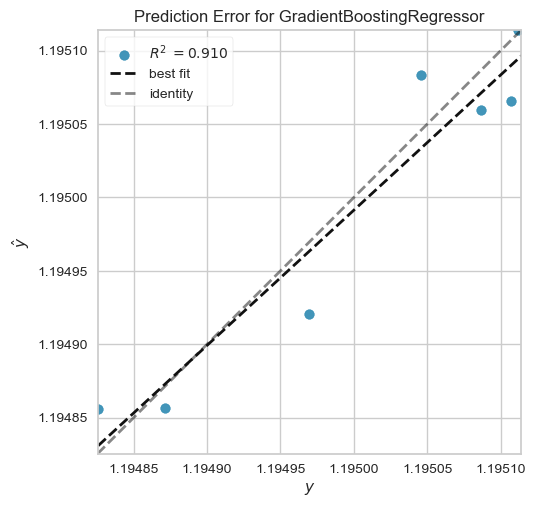

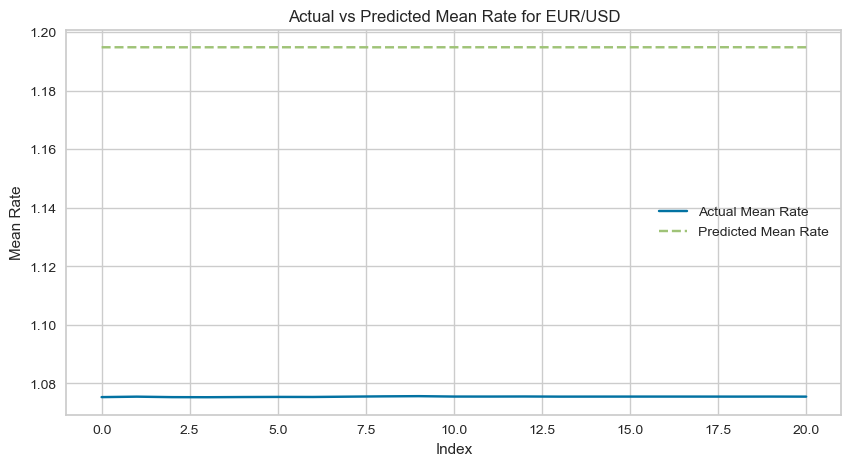

2024-05-07 17:07:55,086 - INFO - MSE for EUR/USD: 0.01425736808798545


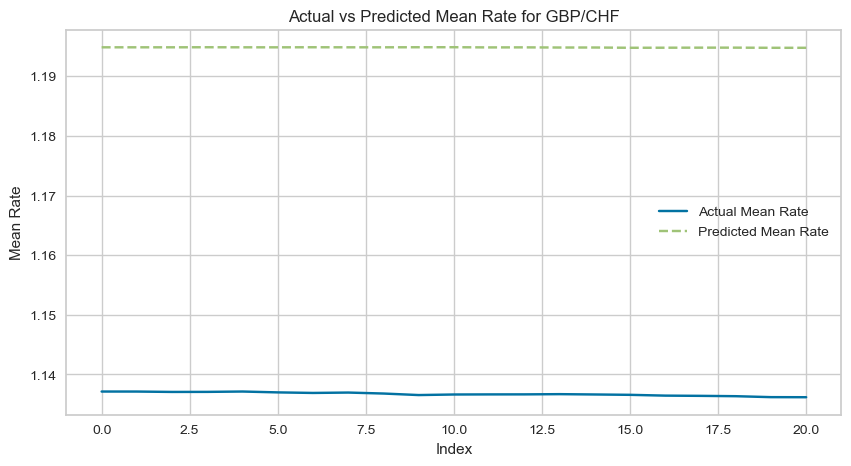

2024-05-07 17:07:55,317 - INFO - MSE for GBP/CHF: 0.0033784810472137976


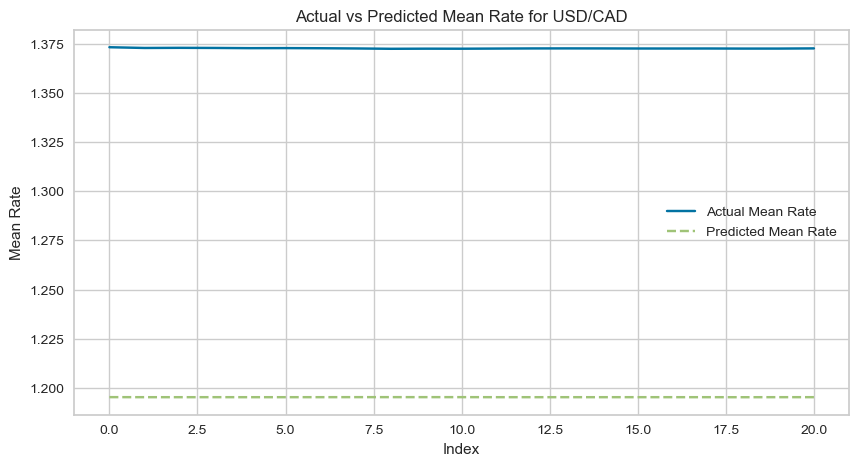

2024-05-07 17:07:55,556 - INFO - MSE for USD/CAD: 0.031520210355831677
2024-05-07 17:07:55,557 - INFO - Label for GBP/CHF: FORECASTABLE
2024-05-07 17:07:55,557 - INFO - Label for EUR/USD: UNDEFINED
2024-05-07 17:07:55,558 - INFO - Label for USD/CAD: NON-FORECASTABLE
2024-05-07 17:07:56,377 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07562, 'bid': 1.07551, 'exchange': 48, 'timestamp': 1715116075000}, 'request_id': 'b420122384ffadb3fb7a43bcf47ee29e', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 17:07:56,585 - INFO - Stored EUR/USD rate at 2024-05-07 17:07:56.379118: 1.075565
2024-05-07 17:07:57,223 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.13698, 'bid': 1.13556, 'exchange': 48, 'timestamp': 1715116076000}, 'request_id': 'b7c0e3e58e86b1a954996d974aee41e0', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 17:07:57,377 - INFO - Stored GBP/CHF rate at 2024-05-07 17:07:57.225854: 1.1362700000000001
2024-05-07 17:07:57,685 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.373,

                           pair_name      rate
2024-05-07 17:07:16.135144   BTC/USD  63005.50
2024-05-07 17:08:01.795626   BTC/USD  62989.39
2024-05-07 17:08:08.874346   BTC/USD  62993.86
2024-05-07 17:08:16.058677   BTC/USD  62990.17
2024-05-07 17:08:23.814557   BTC/USD  62993.80
2024-05-07 17:08:30.132305   BTC/USD  62993.80
2024-05-07 17:08:36.925706   BTC/USD  62993.80
2024-05-07 17:08:43.456879   BTC/USD  62994.47
2024-05-07 17:08:49.489372   BTC/USD  62994.47
2024-05-07 17:08:56.182708   BTC/USD  62994.47
2024-05-07 17:09:02.995120   BTC/USD  62994.47
2024-05-07 17:09:09.116252   BTC/USD  63000.03
2024-05-07 17:09:15.188602   BTC/USD  63000.02
2024-05-07 17:09:21.877288   BTC/USD  63000.03
2024-05-07 17:09:28.213938   BTC/USD  63000.02
2024-05-07 17:09:34.805939   BTC/USD  63000.02
2024-05-07 17:09:41.962339   BTC/USD  63007.00
2024-05-07 17:09:47.664588   BTC/USD  63000.03
2024-05-07 17:09:54.594571   BTC/USD  62999.68
2024-05-07 17:10:02.926915   BTC/USD  62999.68
2024-05-07 17

2024-05-07 17:13:20,479 - INFO - Updated correlation for EUR/USD with BTC/USD: -0.43506420624847797
2024-05-07 17:13:20,683 - INFO - Updated correlation for EUR/USD with EUR/USD: 1.0
2024-05-07 17:13:20,873 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.8429857475360756
2024-05-07 17:13:21,113 - INFO - Updated correlation for GBP/CHF with EUR/USD: -0.6264540523657294
2024-05-07 17:13:21,320 - INFO - Updated correlation for USD/CAD with BTC/USD: 0.5809008235875444
2024-05-07 17:13:21,528 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.8426933282018243
2024-05-07 17:13:21,753 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.7894720853214667
2024-05-07 17:13:21,978 - INFO - Updated correlation for EUR/CHF with EUR/USD: -0.5961122396462509
2024-05-07 17:13:22,183 - INFO - Updated correlation for EUR/CAD with BTC/USD: 0.5479786538569159
2024-05-07 17:13:22,387 - INFO - Updated correlation for EUR/CAD with EUR/USD: -0.025832256802913543
2024-05-07 17:13:22,608 - I

,Description,Value
0,Session id,123
1,Target,mean
2,Target type,Regression
3,Original data shape,"(21, 7)"
4,Transformed data shape,"(21, 7)"
5,Transformed train set shape,"(14, 7)"
6,Transformed test set shape,"(7, 7)"
7,Numeric features,6
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,0.0000,0.0000,0.0000,0.8954,0.0000,0.0000,0.0167
et,Extra Trees Regressor,0.0000,0.0000,0.0000,0.8849,0.0000,0.0000,0.0300
rf,Random Forest Regressor,0.0000,0.0000,0.0001,0.8414,0.0000,0.0000,0.0367
ada,AdaBoost Regressor,0.0000,0.0000,0.0001,0.8336,0.0000,0.0000,0.0200
huber,Huber Regressor,0.0000,0.0000,0.0001,0.8288,0.0000,0.0000,0.0100
dt,Decision Tree Regressor,0.0000,0.0000,0.0001,0.7519,0.0000,0.0000,0.0067
lr,Linear Regression,0.0001,0.0000,0.0001,0.6548,0.0000,0.0001,1.0633
br,Bayesian Ridge,0.0001,0.0000,0.0001,0.4915,0.0000,0.0001,0.0100
lar,Least Angle Regression,0.0001,0.0000,0.0001,0.3970,0.0000,0.0001,0.7667
ridge,Ridge Regression,0.0001,0.0000,0.0001,0.1906,0.0001,0.0001,0.7900


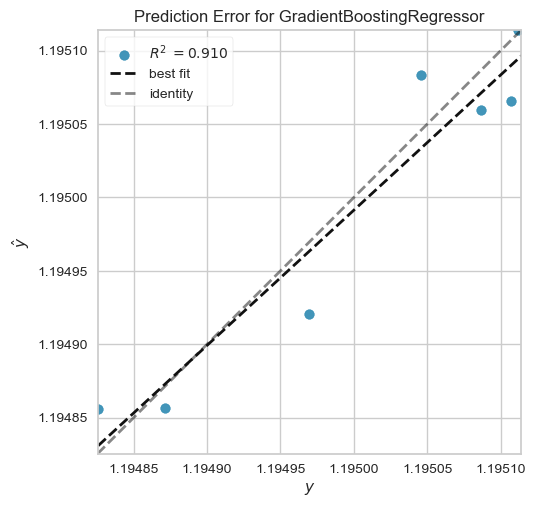

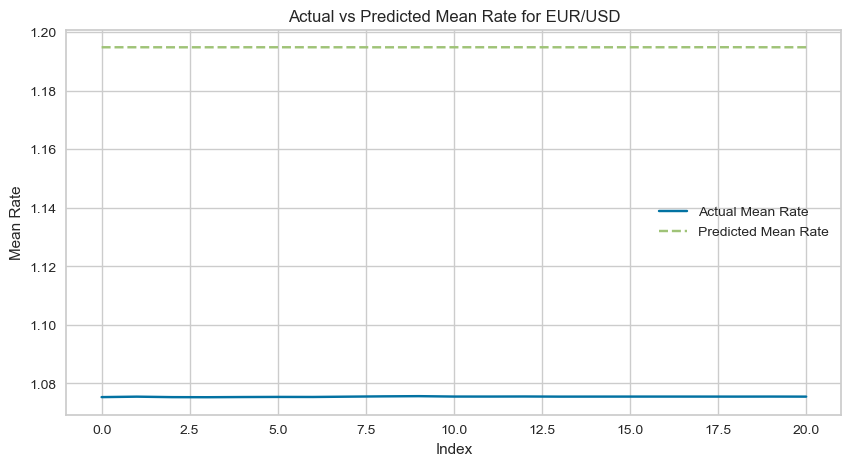

2024-05-07 17:13:44,044 - INFO - MSE for EUR/USD: 0.01425736808798545


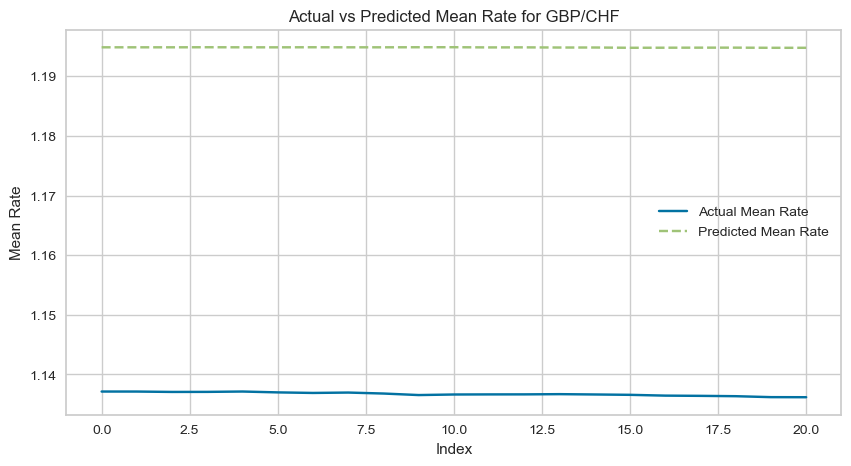

2024-05-07 17:13:44,265 - INFO - MSE for GBP/CHF: 0.0033784810472137976


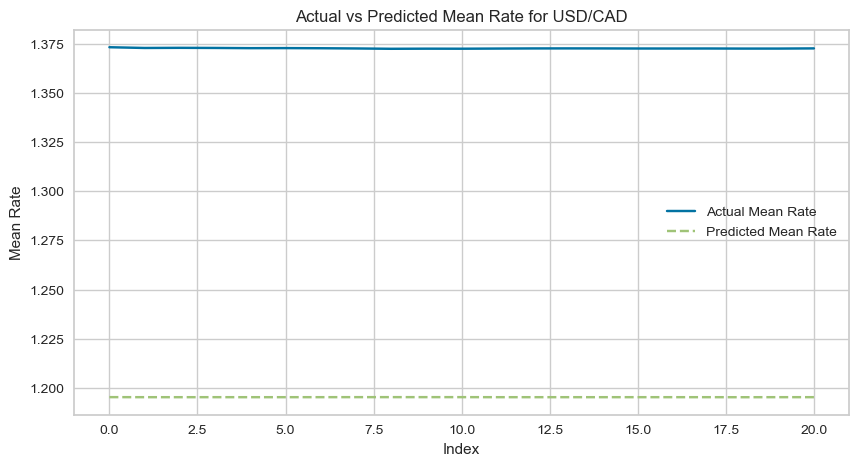

2024-05-07 17:13:44,490 - INFO - MSE for USD/CAD: 0.031520210355831677
2024-05-07 17:13:44,490 - INFO - Label for GBP/CHF: FORECASTABLE
2024-05-07 17:13:44,490 - INFO - Label for EUR/USD: UNDEFINED
2024-05-07 17:13:44,491 - INFO - Label for USD/CAD: NON-FORECASTABLE
2024-05-07 17:13:45,535 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07578, 'bid': 1.07533, 'exchange': 48, 'timestamp': 1715116419000}, 'request_id': '854eb81950a891b4bca4ae49d5437a52', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 17:13:45,731 - INFO - Stored EUR/USD rate at 2024-05-07 17:13:45.537608: 1.075555
2024-05-07 17:13:45,961 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.1368, 'bid': 1.1362, 'exchange': 48, 'timestamp': 1715116425000}, 'request_id': '0c6708f65dc782a5fc5e1449bfd6e667', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 17:13:46,103 - INFO - Stored GBP/CHF rate at 2024-05-07 17:13:45.962485: 1.1365
2024-05-07 17:13:46,334 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37405, 'bid': 1.37

                           pair_name      rate
2024-05-07 17:13:16.675856   BTC/USD  63056.43
2024-05-07 17:13:50.084445   BTC/USD  63043.34
2024-05-07 17:13:56.072067   BTC/USD  63043.33
2024-05-07 17:14:01.944007   BTC/USD  63043.33
2024-05-07 17:14:07.660349   BTC/USD  63046.30
2024-05-07 17:14:14.973391   BTC/USD  63046.30
2024-05-07 17:14:21.245198   BTC/USD  63046.30
2024-05-07 17:14:28.500438   BTC/USD  63036.90
2024-05-07 17:14:34.868951   BTC/USD  63046.30
2024-05-07 17:14:41.669383   BTC/USD  63046.30
2024-05-07 17:14:49.051228   BTC/USD  63050.00
2024-05-07 17:14:56.208715   BTC/USD  63046.35
2024-05-07 17:15:04.773439   BTC/USD  63038.81
2024-05-07 17:15:11.590838   BTC/USD  63039.54
2024-05-07 17:15:18.059177   BTC/USD  63045.85
2024-05-07 17:15:24.665144   BTC/USD  63045.44
2024-05-07 17:15:31.546368   BTC/USD  63055.95
2024-05-07 17:15:37.411189   BTC/USD  63061.00
2024-05-07 17:15:43.431589   BTC/USD  63062.88
2024-05-07 17:15:49.997531   BTC/USD  63083.16
2024-05-07 17

2024-05-07 17:19:21,598 - INFO - Updated correlation for EUR/USD with BTC/USD: -0.47542009449319456
2024-05-07 17:19:21,787 - INFO - Updated correlation for EUR/USD with EUR/USD: 1.0
2024-05-07 17:19:21,973 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.8218614230059098
2024-05-07 17:19:22,162 - INFO - Updated correlation for GBP/CHF with EUR/USD: -0.6428522481144597
2024-05-07 17:19:22,348 - INFO - Updated correlation for USD/CAD with BTC/USD: 0.48171540055295103
2024-05-07 17:19:22,545 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.9174338620824765
2024-05-07 17:19:22,732 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.7502275592803057
2024-05-07 17:19:22,921 - INFO - Updated correlation for EUR/CHF with EUR/USD: -0.6490469326752575
2024-05-07 17:19:23,112 - INFO - Updated correlation for EUR/CAD with BTC/USD: 0.3715576549741268
2024-05-07 17:19:23,300 - INFO - Updated correlation for EUR/CAD with EUR/USD: -0.07889437743875434
2024-05-07 17:19:23,461 - I

,Description,Value
0,Session id,123
1,Target,mean
2,Target type,Regression
3,Original data shape,"(21, 7)"
4,Transformed data shape,"(21, 7)"
5,Transformed train set shape,"(14, 7)"
6,Transformed test set shape,"(7, 7)"
7,Numeric features,6
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,0.0000,0.0000,0.0000,0.8954,0.0000,0.0000,0.0167
et,Extra Trees Regressor,0.0000,0.0000,0.0000,0.8849,0.0000,0.0000,0.0300
rf,Random Forest Regressor,0.0000,0.0000,0.0001,0.8414,0.0000,0.0000,0.0367
ada,AdaBoost Regressor,0.0000,0.0000,0.0001,0.8336,0.0000,0.0000,0.0200
huber,Huber Regressor,0.0000,0.0000,0.0001,0.8288,0.0000,0.0000,0.0100
dt,Decision Tree Regressor,0.0000,0.0000,0.0001,0.7519,0.0000,0.0000,0.0100
lr,Linear Regression,0.0001,0.0000,0.0001,0.6548,0.0000,0.0001,3.4367
br,Bayesian Ridge,0.0001,0.0000,0.0001,0.4915,0.0000,0.0001,0.0100
lar,Least Angle Regression,0.0001,0.0000,0.0001,0.3970,0.0000,0.0001,0.7767
ridge,Ridge Regression,0.0001,0.0000,0.0001,0.1906,0.0001,0.0001,0.8000


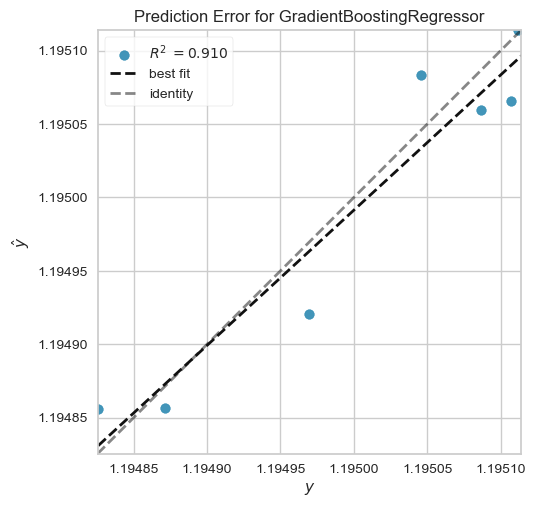

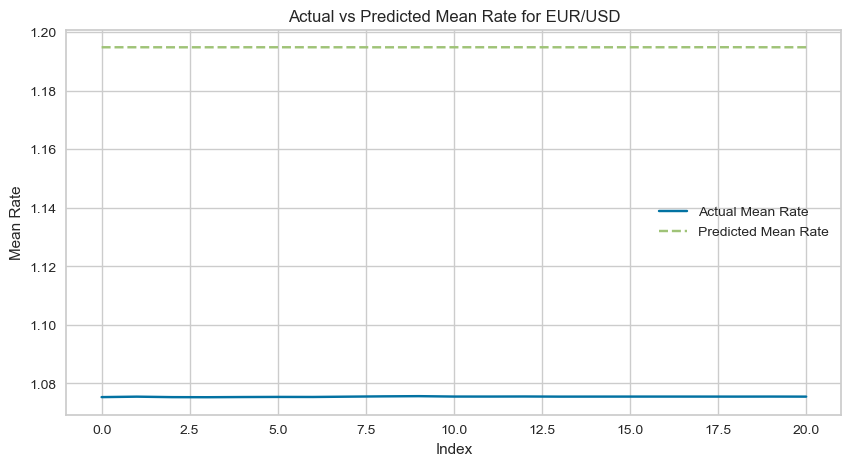

2024-05-07 17:19:51,874 - INFO - MSE for EUR/USD: 0.01425736808798545


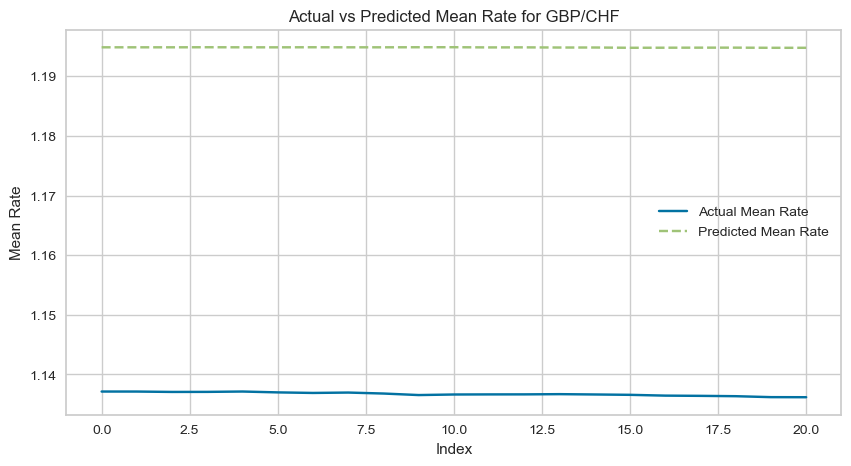

2024-05-07 17:19:52,101 - INFO - MSE for GBP/CHF: 0.0033784810472137976


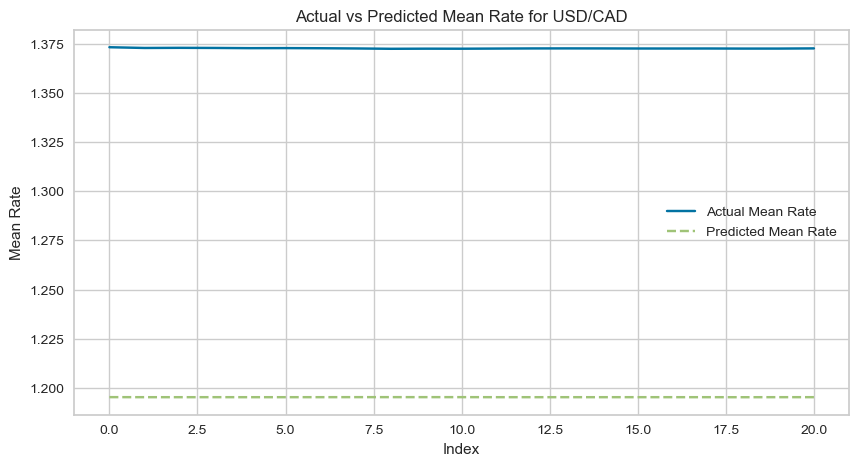

2024-05-07 17:19:52,329 - INFO - MSE for USD/CAD: 0.031520210355831677
2024-05-07 17:19:52,330 - INFO - Label for GBP/CHF: FORECASTABLE
2024-05-07 17:19:52,330 - INFO - Label for EUR/USD: UNDEFINED
2024-05-07 17:19:52,331 - INFO - Label for USD/CAD: NON-FORECASTABLE
2024-05-07 17:19:53,253 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07567, 'bid': 1.07551, 'exchange': 48, 'timestamp': 1715116792000}, 'request_id': '9698c2285446725572a67714460daabc', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 17:19:53,468 - INFO - Stored EUR/USD rate at 2024-05-07 17:19:53.254925: 1.07559
2024-05-07 17:19:53,697 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.1371, 'bid': 1.1365, 'exchange': 48, 'timestamp': 1715116792000}, 'request_id': '28d7136533319df6c353f6e8c75c1a32', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 17:19:53,859 - INFO - Stored GBP/CHF rate at 2024-05-07 17:19:53.699735: 1.1368
2024-05-07 17:19:54,097 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37333, 'bid': 1.372

                           pair_name      rate
2024-05-07 17:19:17.936820   BTC/USD  63078.68
2024-05-07 17:19:58.014192   BTC/USD  63076.69
2024-05-07 17:20:03.995832   BTC/USD  63074.49
2024-05-07 17:20:10.598787   BTC/USD  63079.82
2024-05-07 17:20:16.877593   BTC/USD  63100.00
2024-05-07 17:20:25.240865   BTC/USD  63108.88
2024-05-07 17:20:32.100090   BTC/USD  63135.01
2024-05-07 17:20:38.754798   BTC/USD  63133.40
2024-05-07 17:20:45.125346   BTC/USD  63133.40
2024-05-07 17:20:52.289691   BTC/USD  63132.60
2024-05-07 17:20:58.983237   BTC/USD  63134.97
2024-05-07 17:21:06.136612   BTC/USD  63099.90
2024-05-07 17:21:12.272782   BTC/USD  63136.65
2024-05-07 17:21:18.684239   BTC/USD  63136.66
2024-05-07 17:21:25.320074   BTC/USD  63126.68
2024-05-07 17:21:32.135350   BTC/USD  63121.76
2024-05-07 17:21:38.642447   BTC/USD  63119.61
2024-05-07 17:21:45.885579   BTC/USD  63119.51
2024-05-07 17:21:52.570208   BTC/USD  63119.51
2024-05-07 17:21:59.208642   BTC/USD  63116.93
2024-05-07 17

2024-05-07 17:25:18,827 - INFO - Updated correlation for EUR/USD with BTC/USD: -0.37914474140016363
2024-05-07 17:25:18,994 - INFO - Updated correlation for EUR/USD with EUR/USD: 0.9999999999999999
2024-05-07 17:25:19,182 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.7954085980149252
2024-05-07 17:25:19,349 - INFO - Updated correlation for GBP/CHF with EUR/USD: -0.5836111312636452
2024-05-07 17:25:19,515 - INFO - Updated correlation for USD/CAD with BTC/USD: 0.4747779698890453
2024-05-07 17:25:19,694 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.7640390624251981
2024-05-07 17:25:19,886 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.6932473901506411
2024-05-07 17:25:20,107 - INFO - Updated correlation for EUR/CHF with EUR/USD: -0.6115929994927806
2024-05-07 17:25:20,285 - INFO - Updated correlation for EUR/CAD with BTC/USD: 0.34065421127271256
2024-05-07 17:25:20,464 - INFO - Updated correlation for EUR/CAD with EUR/USD: 0.2425163459652045
2024-05-07 17:

,Description,Value
0,Session id,123
1,Target,mean
2,Target type,Regression
3,Original data shape,"(21, 7)"
4,Transformed data shape,"(21, 7)"
5,Transformed train set shape,"(14, 7)"
6,Transformed test set shape,"(7, 7)"
7,Numeric features,6
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,0.0000,0.0000,0.0000,0.8954,0.0000,0.0000,0.0167
et,Extra Trees Regressor,0.0000,0.0000,0.0000,0.8849,0.0000,0.0000,0.0300
rf,Random Forest Regressor,0.0000,0.0000,0.0001,0.8414,0.0000,0.0000,0.0367
ada,AdaBoost Regressor,0.0000,0.0000,0.0001,0.8336,0.0000,0.0000,0.0200
huber,Huber Regressor,0.0000,0.0000,0.0001,0.8288,0.0000,0.0000,0.0100
dt,Decision Tree Regressor,0.0000,0.0000,0.0001,0.7519,0.0000,0.0000,0.0100
lr,Linear Regression,0.0001,0.0000,0.0001,0.6548,0.0000,0.0001,1.0400
br,Bayesian Ridge,0.0001,0.0000,0.0001,0.4915,0.0000,0.0001,0.0100
lar,Least Angle Regression,0.0001,0.0000,0.0001,0.3970,0.0000,0.0001,0.7767
ridge,Ridge Regression,0.0001,0.0000,0.0001,0.1906,0.0001,0.0001,0.7767


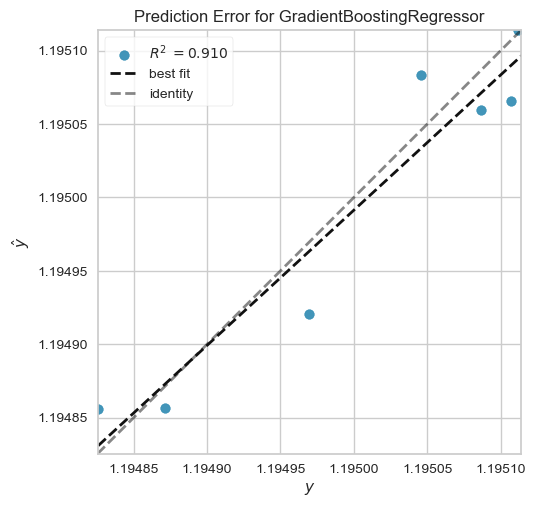

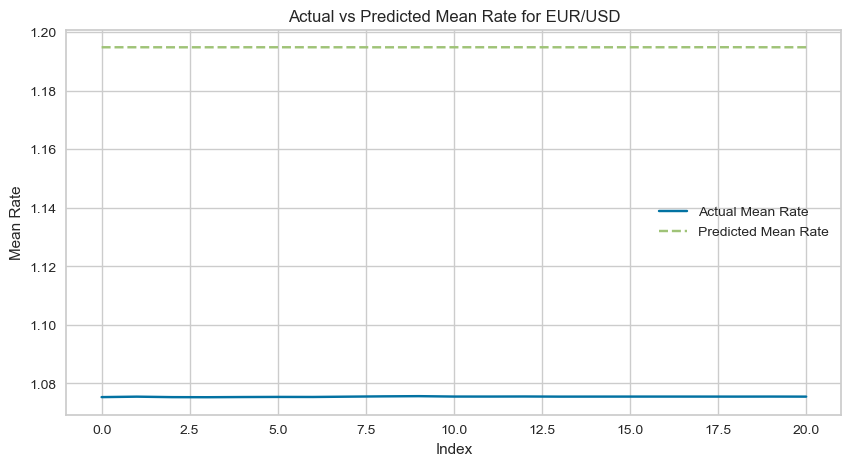

2024-05-07 17:25:41,841 - INFO - MSE for EUR/USD: 0.01425736808798545


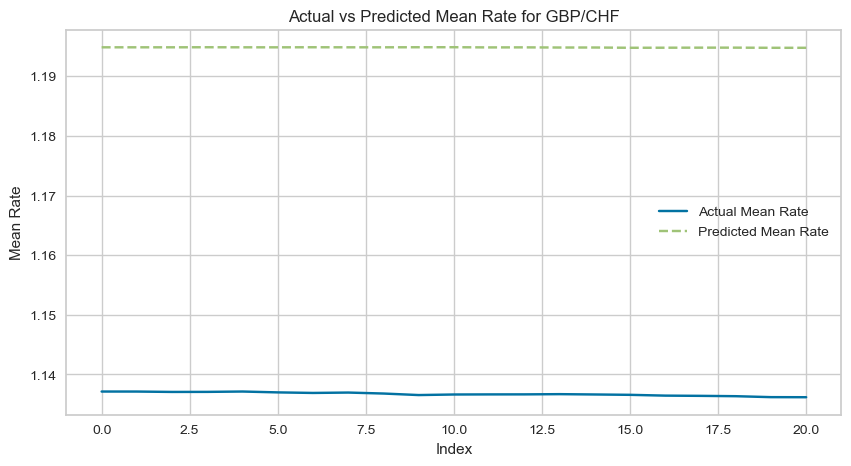

2024-05-07 17:25:42,068 - INFO - MSE for GBP/CHF: 0.0033784810472137976


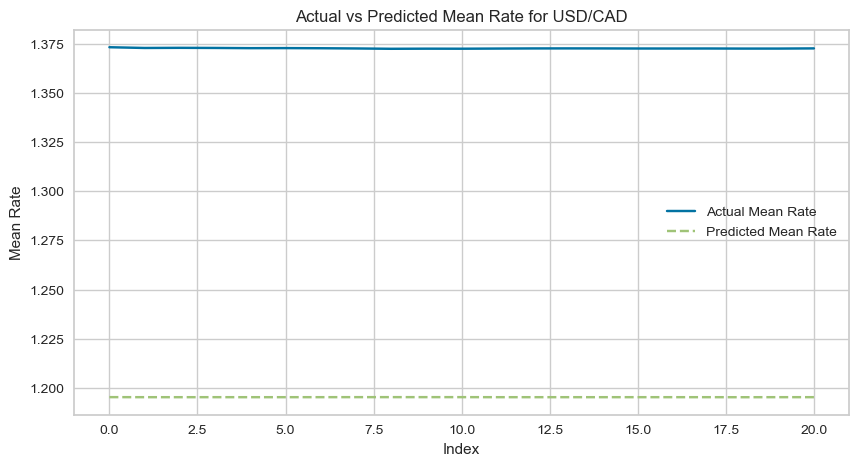

2024-05-07 17:25:42,294 - INFO - MSE for USD/CAD: 0.031520210355831677
2024-05-07 17:25:42,295 - INFO - Label for GBP/CHF: FORECASTABLE
2024-05-07 17:25:42,296 - INFO - Label for EUR/USD: UNDEFINED
2024-05-07 17:25:42,296 - INFO - Label for USD/CAD: NON-FORECASTABLE
2024-05-07 17:25:43,549 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.0758, 'bid': 1.0755, 'exchange': 48, 'timestamp': 1715117135000}, 'request_id': 'd39b9fab53807765ac1af185c33ee7a2', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 17:25:43,767 - INFO - Stored EUR/USD rate at 2024-05-07 17:25:43.551338: 1.07565
2024-05-07 17:25:44,137 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.1367, 'bid': 1.1361, 'exchange': 48, 'timestamp': 1715117142000}, 'request_id': '9704c2f62e1deba3582a1ae54a8dd23d', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 17:25:44,286 - INFO - Stored GBP/CHF rate at 2024-05-07 17:25:44.139764: 1.1364
2024-05-07 17:25:44,521 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.373, 'bid': 1.3725, '

                           pair_name      rate
2024-05-07 17:25:15.245457   BTC/USD  63151.56
2024-05-07 17:25:48.400367   BTC/USD  63118.62
2024-05-07 17:25:54.771955   BTC/USD  63114.75
2024-05-07 17:26:01.168424   BTC/USD  63124.89
2024-05-07 17:26:07.658696   BTC/USD  63126.14
2024-05-07 17:26:13.809877   BTC/USD  63100.00
2024-05-07 17:26:20.607282   BTC/USD  63128.39
2024-05-07 17:26:27.401727   BTC/USD  63125.26
2024-05-07 17:26:34.321722   BTC/USD  63125.25
2024-05-07 17:26:41.459220   BTC/USD  63125.26
2024-05-07 17:26:48.206680   BTC/USD  63122.99
2024-05-07 17:26:56.202922   BTC/USD  63124.00
2024-05-07 17:27:03.992718   BTC/USD  63125.38
2024-05-07 17:27:11.385450   BTC/USD  63125.37
2024-05-07 17:27:18.091018   BTC/USD  63125.37
2024-05-07 17:27:24.885474   BTC/USD  63125.37
2024-05-07 17:27:31.070444   BTC/USD  63118.90
2024-05-07 17:27:37.381061   BTC/USD  63128.11
2024-05-07 17:27:43.901253   BTC/USD  63125.38
2024-05-07 17:27:50.273797   BTC/USD  63125.37
2024-05-07 17

2024-05-07 17:31:16,772 - INFO - Updated correlation for EUR/USD with BTC/USD: -0.26113793540926095
2024-05-07 17:31:16,961 - INFO - Updated correlation for EUR/USD with EUR/USD: 1.0
2024-05-07 17:31:17,165 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.705504877864171
2024-05-07 17:31:17,352 - INFO - Updated correlation for GBP/CHF with EUR/USD: -0.5222406659688136
2024-05-07 17:31:17,547 - INFO - Updated correlation for USD/CAD with BTC/USD: 0.46590580767597395
2024-05-07 17:31:17,740 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.5622070533214492
2024-05-07 17:31:17,913 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.6300806579400002
2024-05-07 17:31:18,089 - INFO - Updated correlation for EUR/CHF with EUR/USD: -0.5395122817567588
2024-05-07 17:31:18,277 - INFO - Updated correlation for EUR/CAD with BTC/USD: 0.38797537431619405
2024-05-07 17:31:18,483 - INFO - Updated correlation for EUR/CAD with EUR/USD: 0.3424922860836041
2024-05-07 17:31:18,664 - INF

,Description,Value
0,Session id,123
1,Target,mean
2,Target type,Regression
3,Original data shape,"(21, 7)"
4,Transformed data shape,"(21, 7)"
5,Transformed train set shape,"(14, 7)"
6,Transformed test set shape,"(7, 7)"
7,Numeric features,6
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,0.0000,0.0000,0.0000,0.8954,0.0000,0.0000,0.0167
et,Extra Trees Regressor,0.0000,0.0000,0.0000,0.8849,0.0000,0.0000,0.0300
rf,Random Forest Regressor,0.0000,0.0000,0.0001,0.8414,0.0000,0.0000,0.0367
ada,AdaBoost Regressor,0.0000,0.0000,0.0001,0.8336,0.0000,0.0000,0.0200
huber,Huber Regressor,0.0000,0.0000,0.0001,0.8288,0.0000,0.0000,0.0100
dt,Decision Tree Regressor,0.0000,0.0000,0.0001,0.7519,0.0000,0.0000,0.0067
lr,Linear Regression,0.0001,0.0000,0.0001,0.6548,0.0000,0.0001,1.0767
br,Bayesian Ridge,0.0001,0.0000,0.0001,0.4915,0.0000,0.0001,0.0100
lar,Least Angle Regression,0.0001,0.0000,0.0001,0.3970,0.0000,0.0001,0.7767
ridge,Ridge Regression,0.0001,0.0000,0.0001,0.1906,0.0001,0.0001,0.7767


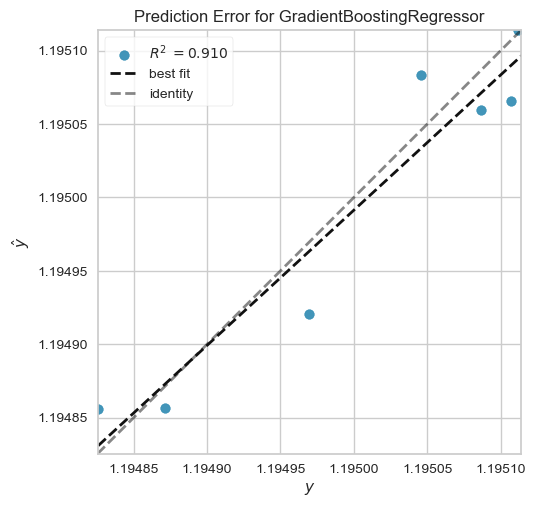

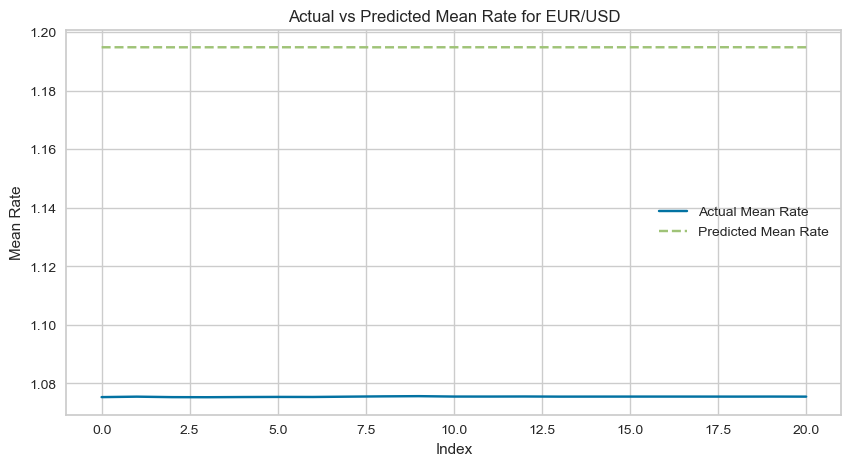

2024-05-07 17:31:40,151 - INFO - MSE for EUR/USD: 0.01425736808798545


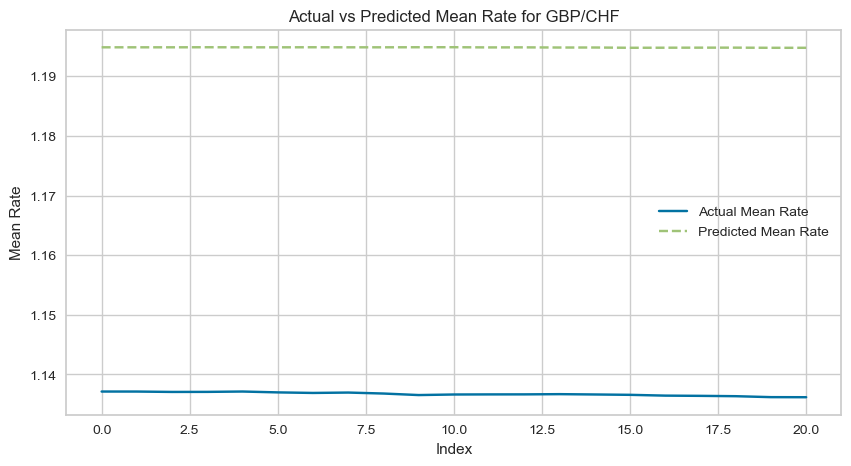

2024-05-07 17:31:40,399 - INFO - MSE for GBP/CHF: 0.0033784810472137976


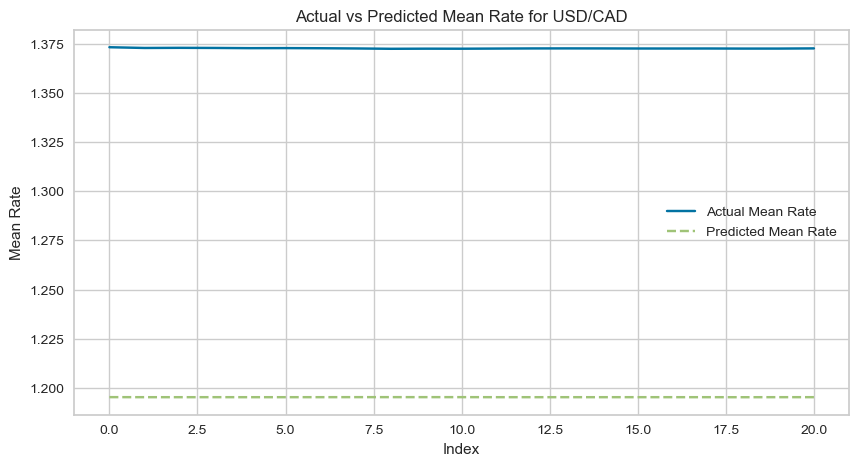

2024-05-07 17:31:40,660 - INFO - MSE for USD/CAD: 0.031520210355831677
2024-05-07 17:31:40,660 - INFO - Label for GBP/CHF: FORECASTABLE
2024-05-07 17:31:40,661 - INFO - Label for EUR/USD: UNDEFINED
2024-05-07 17:31:40,661 - INFO - Label for USD/CAD: NON-FORECASTABLE
2024-05-07 17:31:41,611 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07558, 'bid': 1.07546, 'exchange': 48, 'timestamp': 1715117501000}, 'request_id': '336c8107b00cc3f3679a2010ef117e89', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 17:31:41,833 - INFO - Stored EUR/USD rate at 2024-05-07 17:31:41.613317: 1.07552
2024-05-07 17:31:42,085 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.1368, 'bid': 1.1362, 'exchange': 48, 'timestamp': 1715117500000}, 'request_id': 'a53bc56efb25dcfcf1ae74d31cf233c4', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 17:31:42,266 - INFO - Stored GBP/CHF rate at 2024-05-07 17:31:42.086052: 1.1365
2024-05-07 17:31:42,506 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37345, 'bid': 1.371

                           pair_name      rate
2024-05-07 17:31:13.213503   BTC/USD  63107.46
2024-05-07 17:31:46.901170   BTC/USD  63093.00
2024-05-07 17:31:53.794353   BTC/USD  63084.39
2024-05-07 17:32:00.406258   BTC/USD  63082.95
2024-05-07 17:32:07.180735   BTC/USD  63078.20
2024-05-07 17:32:13.674988   BTC/USD  63078.20
2024-05-07 17:32:20.544241   BTC/USD  63074.11
2024-05-07 17:32:27.334666   BTC/USD  63063.31
2024-05-07 17:32:34.131004   BTC/USD  63081.10
2024-05-07 17:32:41.979518   BTC/USD  63037.82
2024-05-07 17:32:48.683089   BTC/USD  63044.75
2024-05-07 17:32:55.696959   BTC/USD  63041.20
2024-05-07 17:33:03.462986   BTC/USD  63037.90
2024-05-07 17:33:10.114695   BTC/USD  63036.90
2024-05-07 17:33:17.276046   BTC/USD  63029.34
2024-05-07 17:33:23.710342   BTC/USD  63017.88
2024-05-07 17:33:31.572925   BTC/USD  62997.11
2024-05-07 17:33:38.213661   BTC/USD  63010.00
2024-05-07 17:33:45.243428   BTC/USD  63005.40
2024-05-07 17:33:52.045736   BTC/USD  63011.61
2024-05-07 17

2024-05-07 17:37:19,047 - INFO - Updated correlation for EUR/USD with EUR/USD: 1.0
2024-05-07 17:37:19,238 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.7084493856887478
2024-05-07 17:37:19,431 - INFO - Updated correlation for GBP/CHF with EUR/USD: -0.3704827926305189
2024-05-07 17:37:19,605 - INFO - Updated correlation for USD/CAD with BTC/USD: 0.4303556527680239
2024-05-07 17:37:19,784 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.47441769112000026
2024-05-07 17:37:19,967 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.6249469933835713
2024-05-07 17:37:20,151 - INFO - Updated correlation for EUR/CHF with EUR/USD: -0.3854355162446199
2024-05-07 17:37:20,329 - INFO - Updated correlation for EUR/CAD with BTC/USD: 0.4372890148379355
2024-05-07 17:37:20,526 - INFO - Updated correlation for EUR/CAD with EUR/USD: 0.33117270383210395
2024-05-07 17:37:20,708 - INFO - Updated correlation for GBP/EUR with BTC/USD: 0.5108504886989598
2024-05-07 17:37:20,889 - INFO

,Description,Value
0,Session id,123
1,Target,mean
2,Target type,Regression
3,Original data shape,"(21, 7)"
4,Transformed data shape,"(21, 7)"
5,Transformed train set shape,"(14, 7)"
6,Transformed test set shape,"(7, 7)"
7,Numeric features,6
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,0.0000,0.0000,0.0000,0.8954,0.0000,0.0000,0.0167
et,Extra Trees Regressor,0.0000,0.0000,0.0000,0.8849,0.0000,0.0000,0.0300
rf,Random Forest Regressor,0.0000,0.0000,0.0001,0.8414,0.0000,0.0000,0.0367
ada,AdaBoost Regressor,0.0000,0.0000,0.0001,0.8336,0.0000,0.0000,0.0200
huber,Huber Regressor,0.0000,0.0000,0.0001,0.8288,0.0000,0.0000,0.0133
dt,Decision Tree Regressor,0.0000,0.0000,0.0001,0.7519,0.0000,0.0000,0.0100
lr,Linear Regression,0.0001,0.0000,0.0001,0.6548,0.0000,0.0001,0.0500
br,Bayesian Ridge,0.0001,0.0000,0.0001,0.4915,0.0000,0.0001,0.7100
lar,Least Angle Regression,0.0001,0.0000,0.0001,0.3970,0.0000,0.0001,0.7700
ridge,Ridge Regression,0.0001,0.0000,0.0001,0.1906,0.0001,0.0001,0.7767


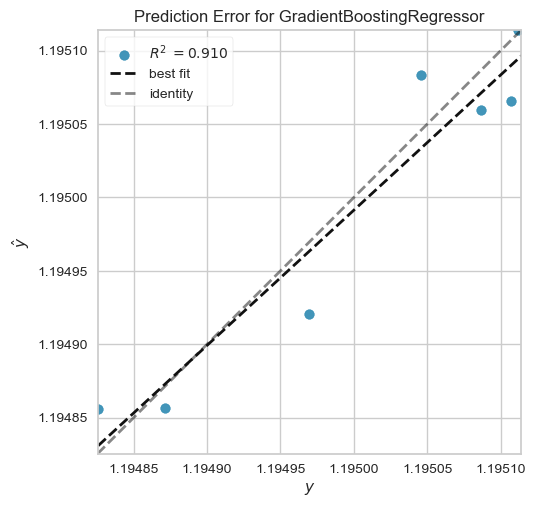

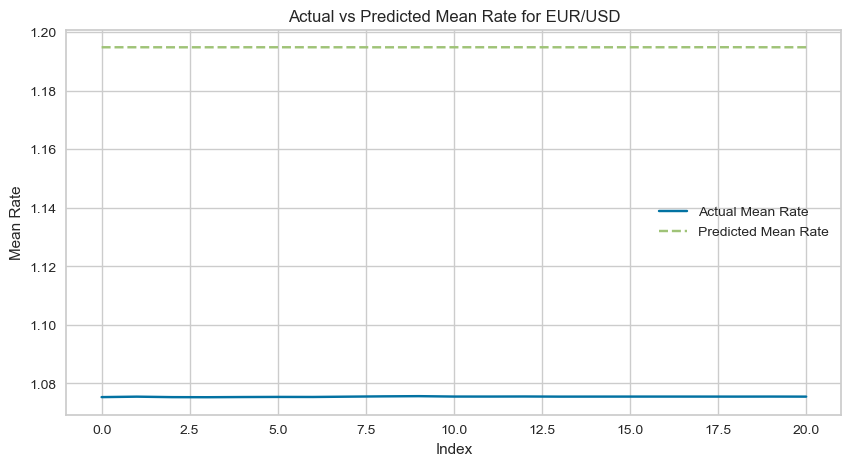

2024-05-07 17:37:41,664 - INFO - MSE for EUR/USD: 0.01425736808798545


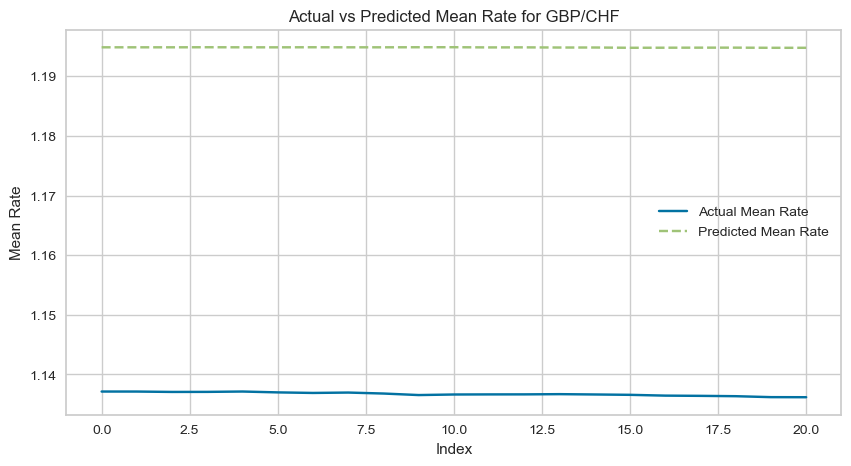

2024-05-07 17:37:41,890 - INFO - MSE for GBP/CHF: 0.0033784810472137976


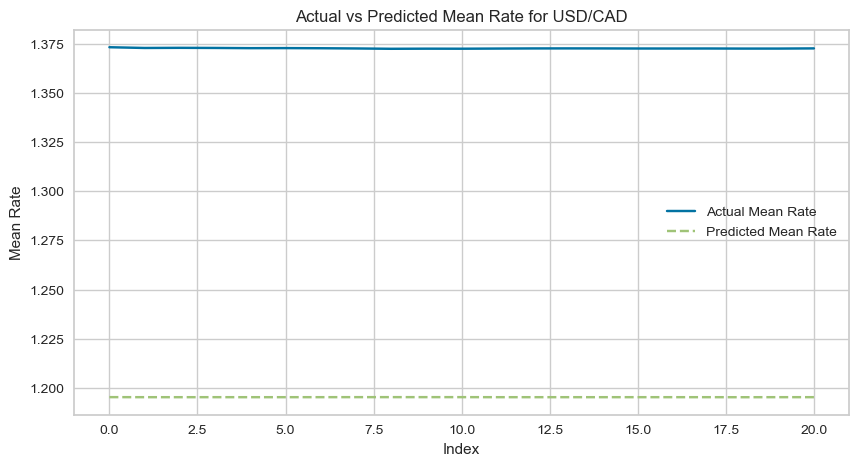

2024-05-07 17:37:42,130 - INFO - MSE for USD/CAD: 0.031520210355831677
2024-05-07 17:37:42,130 - INFO - Label for GBP/CHF: FORECASTABLE
2024-05-07 17:37:42,130 - INFO - Label for EUR/USD: UNDEFINED
2024-05-07 17:37:42,131 - INFO - Label for USD/CAD: NON-FORECASTABLE
2024-05-07 17:37:42,975 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07573, 'bid': 1.07527, 'exchange': 48, 'timestamp': 1715117861000}, 'request_id': 'af958446c729ec16d4c58f797c23cb85', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 17:37:43,540 - INFO - Stored EUR/USD rate at 2024-05-07 17:37:42.976373: 1.0755
2024-05-07 17:37:43,790 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.1368, 'bid': 1.13577, 'exchange': 48, 'timestamp': 1715117857000}, 'request_id': '76b642d56debb0bea90ac9b8e76c2d6b', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 17:37:43,938 - INFO - Stored GBP/CHF rate at 2024-05-07 17:37:43.792186: 1.136285
2024-05-07 17:37:44,168 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37265, 'bid': 1.3

                           pair_name      rate
2024-05-07 17:37:15.316855   BTC/USD  63067.19
2024-05-07 17:37:48.644205   BTC/USD  63016.58
2024-05-07 17:37:56.470771   BTC/USD  63008.24
2024-05-07 17:38:03.684981   BTC/USD  63000.89
2024-05-07 17:38:10.236083   BTC/USD  63004.81
2024-05-07 17:38:17.016448   BTC/USD  63001.20
2024-05-07 17:38:23.651208   BTC/USD  63001.83
2024-05-07 17:38:31.403972   BTC/USD  63004.48
2024-05-07 17:38:40.309759   BTC/USD  63005.66
2024-05-07 17:38:47.523964   BTC/USD  62998.18
2024-05-07 17:38:54.613612   BTC/USD  63000.54
2024-05-07 17:39:01.747176   BTC/USD  62999.74
2024-05-07 17:39:08.775953   BTC/USD  62999.90
2024-05-07 17:39:15.328925   BTC/USD  63000.00
2024-05-07 17:39:21.308433   BTC/USD  62997.68
2024-05-07 17:39:28.146650   BTC/USD  62998.93
2024-05-07 17:39:34.773426   BTC/USD  62996.43
2024-05-07 17:39:42.064429   BTC/USD  62995.15
2024-05-07 17:39:49.010351   BTC/USD  62997.55
2024-05-07 17:39:56.288385   BTC/USD  62998.54
2024-05-07 17

2024-05-07 17:43:22,596 - INFO - Updated correlation for EUR/USD with BTC/USD: -0.07160741950396436
2024-05-07 17:43:22,793 - INFO - Updated correlation for EUR/USD with EUR/USD: 0.9999999999999999
2024-05-07 17:43:22,983 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.6862279522009148
2024-05-07 17:43:23,171 - INFO - Updated correlation for GBP/CHF with EUR/USD: -0.22596817924976642
2024-05-07 17:43:23,322 - INFO - Updated correlation for USD/CAD with BTC/USD: 0.38542121009996555
2024-05-07 17:43:23,513 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.33376596943021913
2024-05-07 17:43:23,666 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.6139309200579984
2024-05-07 17:43:23,863 - INFO - Updated correlation for EUR/CHF with EUR/USD: -0.22593127202840618
2024-05-07 17:43:24,050 - INFO - Updated correlation for EUR/CAD with BTC/USD: 0.43505786518513195
2024-05-07 17:43:24,234 - INFO - Updated correlation for EUR/CAD with EUR/USD: 0.4324826958733258
2024-05-07

,Description,Value
0,Session id,123
1,Target,mean
2,Target type,Regression
3,Original data shape,"(21, 7)"
4,Transformed data shape,"(21, 7)"
5,Transformed train set shape,"(14, 7)"
6,Transformed test set shape,"(7, 7)"
7,Numeric features,6
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,0.0000,0.0000,0.0000,0.8954,0.0000,0.0000,0.0167
et,Extra Trees Regressor,0.0000,0.0000,0.0000,0.8849,0.0000,0.0000,0.0300
rf,Random Forest Regressor,0.0000,0.0000,0.0001,0.8414,0.0000,0.0000,0.0367
ada,AdaBoost Regressor,0.0000,0.0000,0.0001,0.8336,0.0000,0.0000,0.0200
huber,Huber Regressor,0.0000,0.0000,0.0001,0.8288,0.0000,0.0000,0.0133
dt,Decision Tree Regressor,0.0000,0.0000,0.0001,0.7519,0.0000,0.0000,0.0100
lr,Linear Regression,0.0001,0.0000,0.0001,0.6548,0.0000,0.0001,1.0367
br,Bayesian Ridge,0.0001,0.0000,0.0001,0.4915,0.0000,0.0001,0.0100
lar,Least Angle Regression,0.0001,0.0000,0.0001,0.3970,0.0000,0.0001,0.7900
ridge,Ridge Regression,0.0001,0.0000,0.0001,0.1906,0.0001,0.0001,0.7767


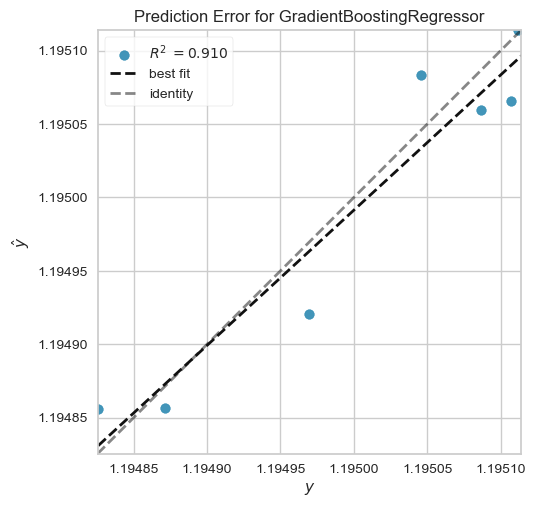

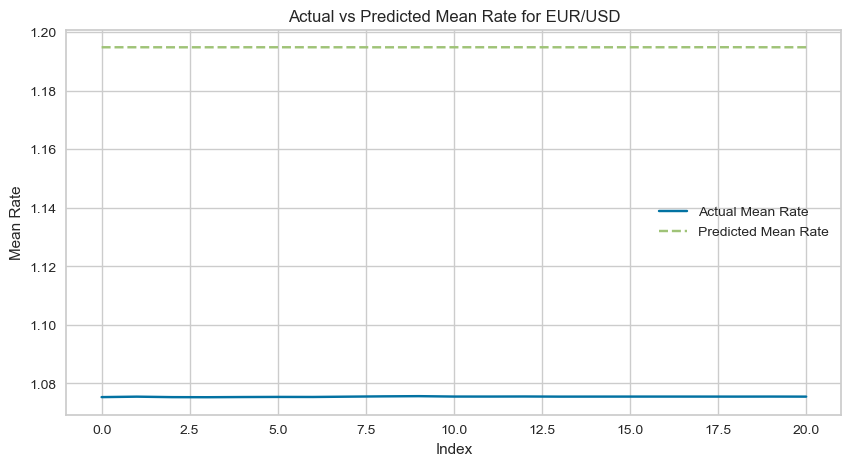

2024-05-07 17:43:45,660 - INFO - MSE for EUR/USD: 0.01425736808798545


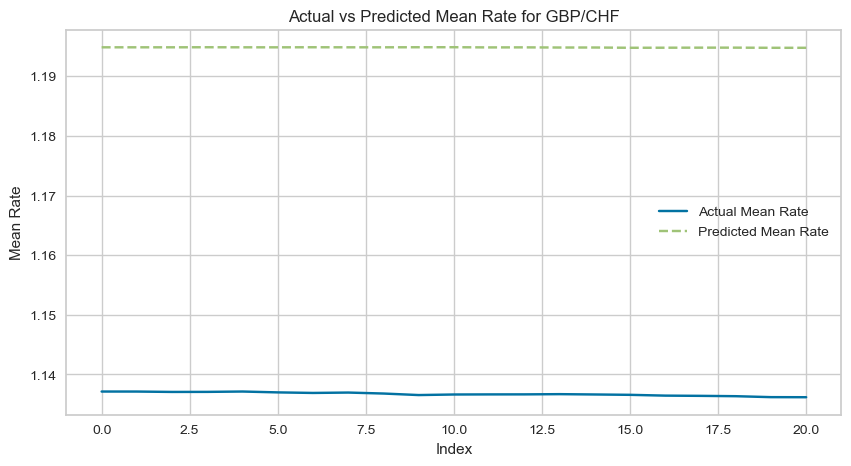

2024-05-07 17:43:45,891 - INFO - MSE for GBP/CHF: 0.0033784810472137976


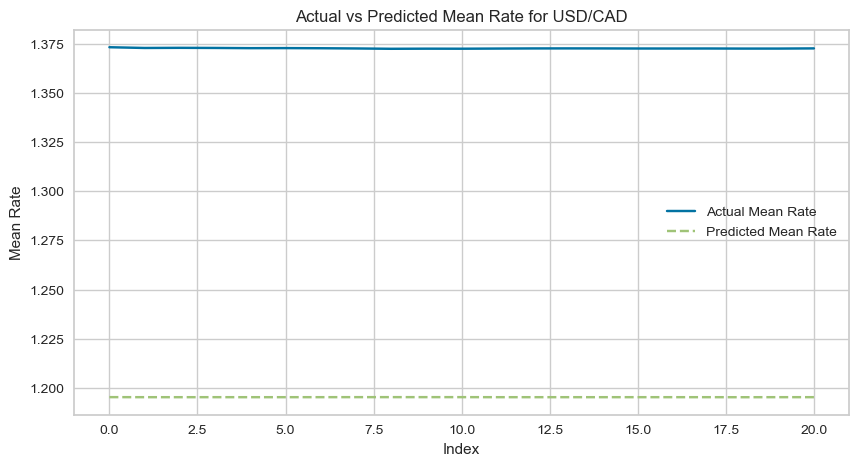

2024-05-07 17:43:46,127 - INFO - MSE for USD/CAD: 0.031520210355831677
2024-05-07 17:43:46,127 - INFO - Label for GBP/CHF: FORECASTABLE
2024-05-07 17:43:46,128 - INFO - Label for EUR/USD: UNDEFINED
2024-05-07 17:43:46,128 - INFO - Label for USD/CAD: NON-FORECASTABLE
2024-05-07 17:43:46,985 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07559, 'bid': 1.07547, 'exchange': 48, 'timestamp': 1715118227000}, 'request_id': '464845c9fe430afad0a5538570289f0b', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 17:43:47,240 - INFO - Stored EUR/USD rate at 2024-05-07 17:43:46.987371: 1.07553
2024-05-07 17:43:47,474 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.13661, 'bid': 1.13616, 'exchange': 48, 'timestamp': 1715118227000}, 'request_id': '8d78428b21d634f96d2e5277c6996a32', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 17:43:47,638 - INFO - Stored GBP/CHF rate at 2024-05-07 17:43:47.475066: 1.136385
2024-05-07 17:43:47,873 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37275, 'bid': 1

                           pair_name      rate
2024-05-07 17:43:18.989764   BTC/USD  63019.11
2024-05-07 17:43:52.520566   BTC/USD  63021.51
2024-05-07 17:43:59.227134   BTC/USD  63015.99
2024-05-07 17:44:07.010821   BTC/USD  63013.09
2024-05-07 17:44:14.568107   BTC/USD  63007.43
2024-05-07 17:44:22.452528   BTC/USD  63013.74
2024-05-07 17:44:29.220990   BTC/USD  63007.52
2024-05-07 17:44:37.598139   BTC/USD  63007.09
2024-05-07 17:44:45.518454   BTC/USD  63010.97
2024-05-07 17:44:53.227340   BTC/USD  63002.10
2024-05-07 17:45:01.614425   BTC/USD  63003.15
2024-05-07 17:45:08.118557   BTC/USD  62993.03
2024-05-07 17:45:15.635049   BTC/USD  62992.48
2024-05-07 17:45:23.006859   BTC/USD  62985.95
2024-05-07 17:45:29.581850   BTC/USD  62989.69
2024-05-07 17:45:36.402244   BTC/USD  62986.37
2024-05-07 17:45:43.450956   BTC/USD  63003.90
2024-05-07 17:45:50.222350   BTC/USD  62988.49
2024-05-07 17:45:57.684891   BTC/USD  62987.78
2024-05-07 17:46:04.936994   BTC/USD  63002.90
2024-05-07 17

2024-05-07 17:49:22,674 - INFO - Updated correlation for EUR/USD with BTC/USD: 0.17698333359025878
2024-05-07 17:49:22,843 - INFO - Updated correlation for EUR/USD with EUR/USD: 1.0
2024-05-07 17:49:23,033 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.6612863787934058
2024-05-07 17:49:23,199 - INFO - Updated correlation for GBP/CHF with EUR/USD: 0.026632692482465248
2024-05-07 17:49:23,391 - INFO - Updated correlation for USD/CAD with BTC/USD: 0.2587493866271711
2024-05-07 17:49:23,585 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.14987800560869316
2024-05-07 17:49:23,795 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.6165165617915375
2024-05-07 17:49:23,991 - INFO - Updated correlation for EUR/CHF with EUR/USD: 0.05608486263039922
2024-05-07 17:49:24,162 - INFO - Updated correlation for EUR/CAD with BTC/USD: 0.4823072685832504
2024-05-07 17:49:24,351 - INFO - Updated correlation for EUR/CAD with EUR/USD: 0.46049471249841495
2024-05-07 17:49:24,562 - IN

,Description,Value
0,Session id,123
1,Target,mean
2,Target type,Regression
3,Original data shape,"(21, 7)"
4,Transformed data shape,"(21, 7)"
5,Transformed train set shape,"(14, 7)"
6,Transformed test set shape,"(7, 7)"
7,Numeric features,6
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,0.0000,0.0000,0.0000,0.8954,0.0000,0.0000,0.0167
et,Extra Trees Regressor,0.0000,0.0000,0.0000,0.8849,0.0000,0.0000,0.0300
rf,Random Forest Regressor,0.0000,0.0000,0.0001,0.8414,0.0000,0.0000,0.0367
ada,AdaBoost Regressor,0.0000,0.0000,0.0001,0.8336,0.0000,0.0000,0.0233
huber,Huber Regressor,0.0000,0.0000,0.0001,0.8288,0.0000,0.0000,0.0133
dt,Decision Tree Regressor,0.0000,0.0000,0.0001,0.7519,0.0000,0.0000,0.0067
lr,Linear Regression,0.0001,0.0000,0.0001,0.6548,0.0000,0.0001,0.0533
br,Bayesian Ridge,0.0001,0.0000,0.0001,0.4915,0.0000,0.0001,0.7233
lar,Least Angle Regression,0.0001,0.0000,0.0001,0.3970,0.0000,0.0001,0.8400
ridge,Ridge Regression,0.0001,0.0000,0.0001,0.1906,0.0001,0.0001,0.7867


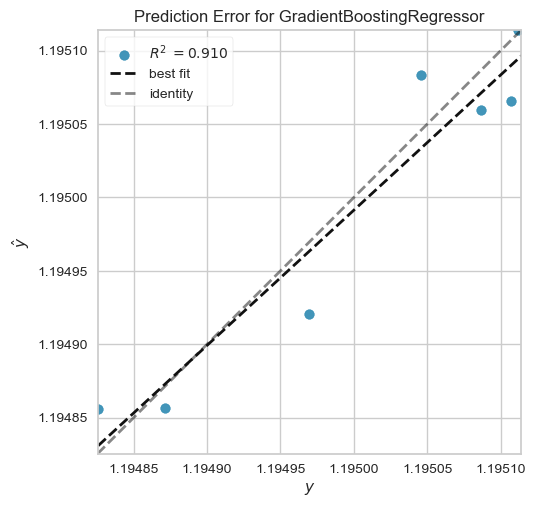

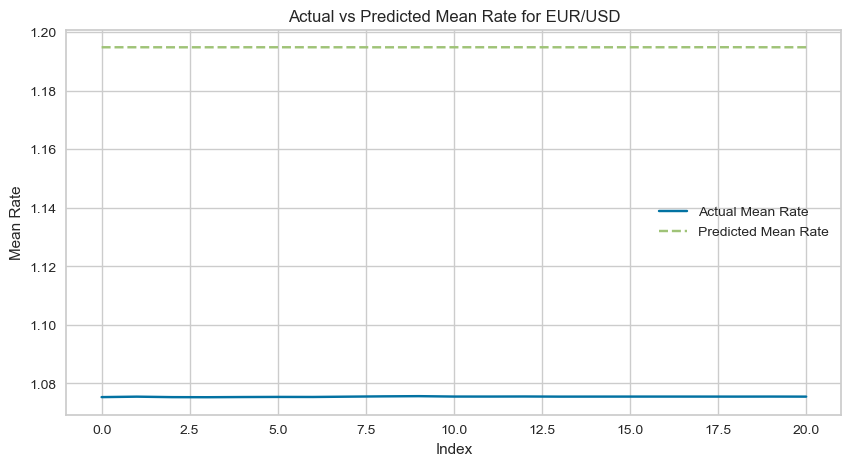

2024-05-07 17:49:46,367 - INFO - MSE for EUR/USD: 0.01425736808798545


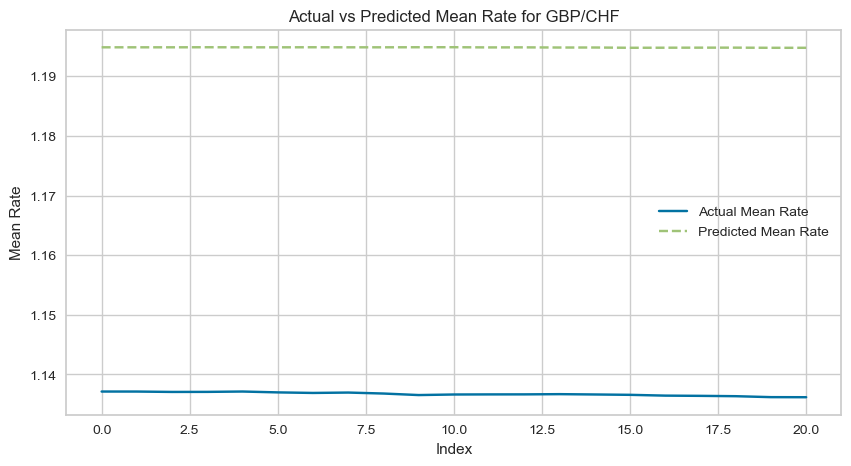

2024-05-07 17:49:46,608 - INFO - MSE for GBP/CHF: 0.0033784810472137976


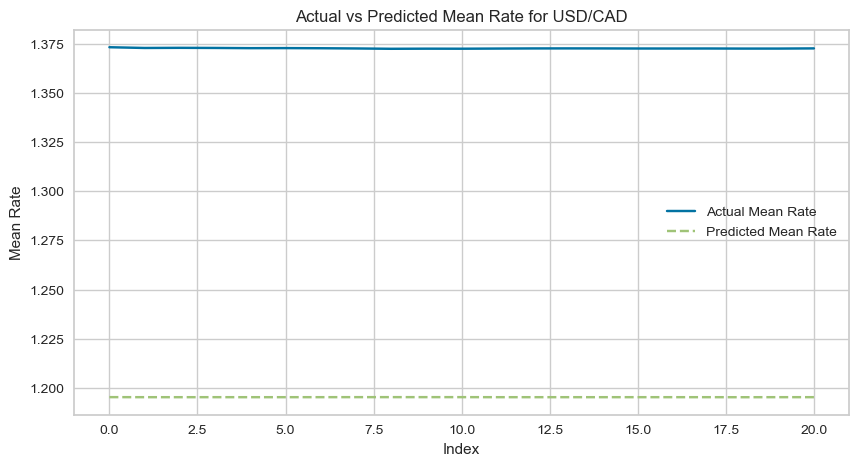

2024-05-07 17:49:46,842 - INFO - MSE for USD/CAD: 0.031520210355831677
2024-05-07 17:49:46,843 - INFO - Label for GBP/CHF: FORECASTABLE
2024-05-07 17:49:46,843 - INFO - Label for EUR/USD: UNDEFINED
2024-05-07 17:49:46,843 - INFO - Label for USD/CAD: NON-FORECASTABLE
2024-05-07 17:49:47,748 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07563, 'bid': 1.07539, 'exchange': 48, 'timestamp': 1715118587000}, 'request_id': 'cf5bd52d0e4e1faab5278f80b748f536', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 17:49:48,044 - INFO - Stored EUR/USD rate at 2024-05-07 17:49:47.750789: 1.07551
2024-05-07 17:49:48,423 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.1366, 'bid': 1.136, 'exchange': 48, 'timestamp': 1715118588000}, 'request_id': '684c6942f03fa8226bda4cf81bc26425', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 17:49:48,593 - INFO - Stored GBP/CHF rate at 2024-05-07 17:49:48.425947: 1.1362999999999999
2024-05-07 17:49:48,844 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.3731, 'b

                           pair_name      rate
2024-05-07 17:49:19.262346   BTC/USD  62826.79
2024-05-07 17:49:54.175569   BTC/USD  62878.55
2024-05-07 17:50:01.380898   BTC/USD  62936.89
2024-05-07 17:50:08.654160   BTC/USD  62936.89
2024-05-07 17:50:15.864510   BTC/USD  62898.21
2024-05-07 17:50:23.290266   BTC/USD  62902.34
2024-05-07 17:50:31.333323   BTC/USD  62870.48
2024-05-07 17:50:37.962135   BTC/USD  62870.46
2024-05-07 17:50:44.863282   BTC/USD  62875.68
2024-05-07 17:50:51.845109   BTC/USD  62872.22
2024-05-07 17:50:59.413382   BTC/USD  62870.10
2024-05-07 17:51:07.327349   BTC/USD  62871.66
2024-05-07 17:51:14.495685   BTC/USD  62852.52
2024-05-07 17:51:22.592624   BTC/USD  62850.24
2024-05-07 17:51:29.991433   BTC/USD  62851.82
2024-05-07 17:51:37.532831   BTC/USD  62851.82
2024-05-07 17:51:44.677341   BTC/USD  62849.99
2024-05-07 17:51:51.593442   BTC/USD  62852.48
2024-05-07 17:51:58.353955   BTC/USD  62852.53
2024-05-07 17:52:06.144746   BTC/USD  62855.00
2024-05-07 17

2024-05-07 17:55:15,986 - INFO - Updated features for EUR/USD at 2024-05-07 17:55:12.728023
2024-05-07 17:55:16,172 - INFO - Updated correlation for EUR/USD with BTC/USD: 0.030516261514030057
2024-05-07 17:55:16,363 - INFO - Updated correlation for EUR/USD with EUR/USD: 1.0
2024-05-07 17:55:16,563 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.6845558516296218
2024-05-07 17:55:16,761 - INFO - Updated correlation for GBP/CHF with EUR/USD: 0.0948306371759537
2024-05-07 17:55:16,972 - INFO - Updated correlation for USD/CAD with BTC/USD: 0.2510187357393314
2024-05-07 17:55:17,146 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.15066589631169508
2024-05-07 17:55:17,329 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.6096086735328153
2024-05-07 17:55:17,522 - INFO - Updated correlation for EUR/CHF with EUR/USD: 0.19086500082858732
2024-05-07 17:55:17,719 - INFO - Updated correlation for EUR/CAD with BTC/USD: 0.4047017920261368
2024-05-07 17:55:17,903 - INFO - Upd

,Description,Value
0,Session id,123
1,Target,mean
2,Target type,Regression
3,Original data shape,"(21, 7)"
4,Transformed data shape,"(21, 7)"
5,Transformed train set shape,"(14, 7)"
6,Transformed test set shape,"(7, 7)"
7,Numeric features,6
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,0.0000,0.0000,0.0000,0.8954,0.0000,0.0000,0.0167
et,Extra Trees Regressor,0.0000,0.0000,0.0000,0.8849,0.0000,0.0000,0.0300
rf,Random Forest Regressor,0.0000,0.0000,0.0001,0.8414,0.0000,0.0000,0.0367
ada,AdaBoost Regressor,0.0000,0.0000,0.0001,0.8336,0.0000,0.0000,0.0200
huber,Huber Regressor,0.0000,0.0000,0.0001,0.8288,0.0000,0.0000,0.0100
dt,Decision Tree Regressor,0.0000,0.0000,0.0001,0.7519,0.0000,0.0000,0.0067
lr,Linear Regression,0.0001,0.0000,0.0001,0.6548,0.0000,0.0001,1.0500
br,Bayesian Ridge,0.0001,0.0000,0.0001,0.4915,0.0000,0.0001,0.0067
lar,Least Angle Regression,0.0001,0.0000,0.0001,0.3970,0.0000,0.0001,0.7767
ridge,Ridge Regression,0.0001,0.0000,0.0001,0.1906,0.0001,0.0001,0.7767


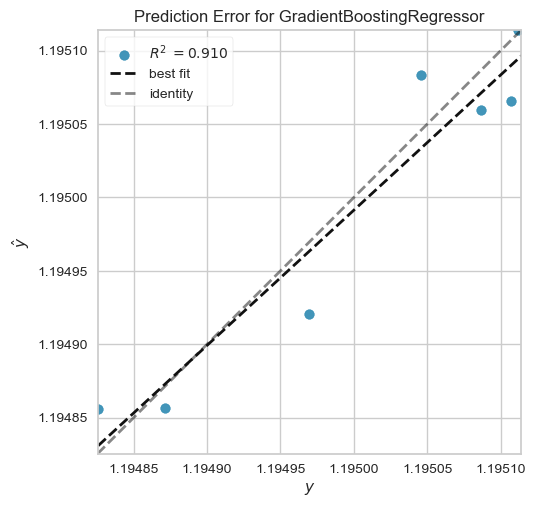

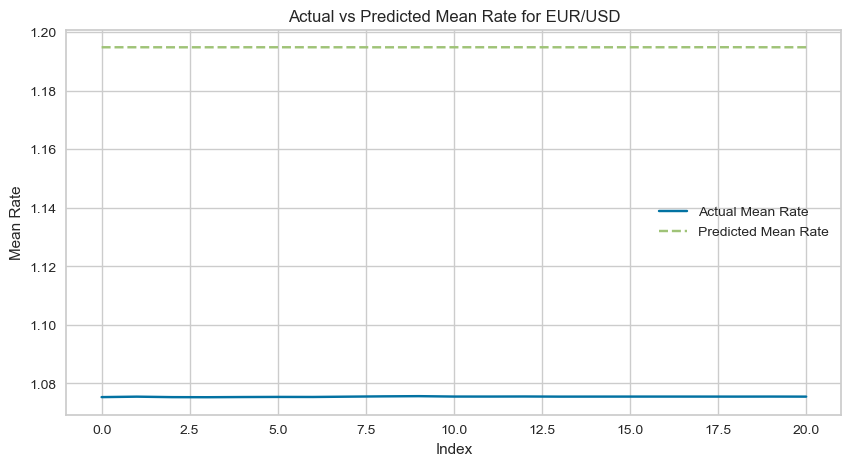

2024-05-07 17:55:39,158 - INFO - MSE for EUR/USD: 0.01425736808798545


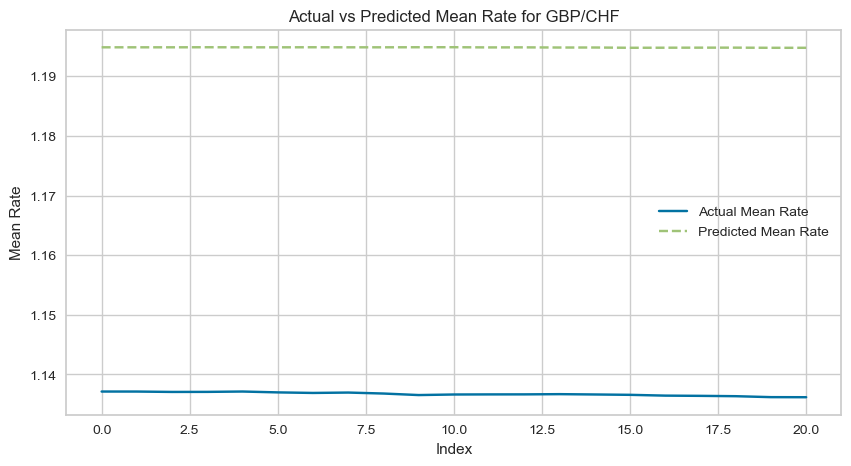

2024-05-07 17:55:39,379 - INFO - MSE for GBP/CHF: 0.0033784810472137976


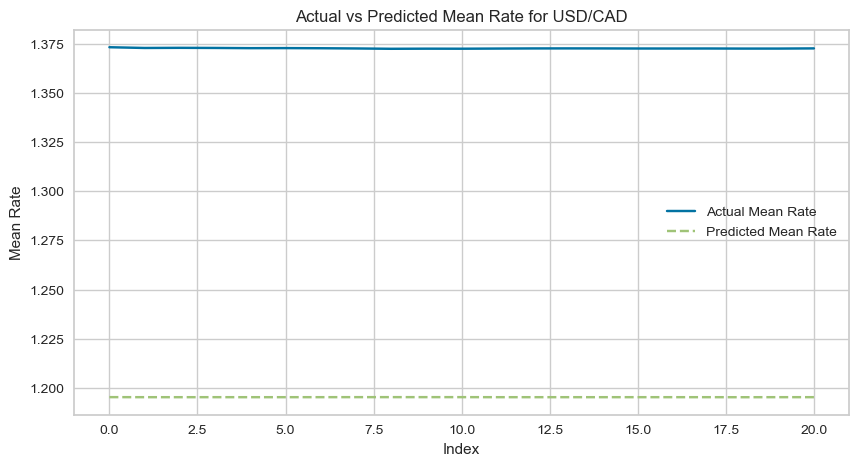

2024-05-07 17:55:39,606 - INFO - MSE for USD/CAD: 0.031520210355831677
2024-05-07 17:55:39,606 - INFO - Label for GBP/CHF: FORECASTABLE
2024-05-07 17:55:39,607 - INFO - Label for EUR/USD: UNDEFINED
2024-05-07 17:55:39,607 - INFO - Label for USD/CAD: NON-FORECASTABLE
2024-05-07 17:55:40,442 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.07571, 'bid': 1.07547, 'exchange': 48, 'timestamp': 1715118936000}, 'request_id': 'cbaef705e0abe18b1199fdb7f1189380', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 17:55:40,627 - INFO - Stored EUR/USD rate at 2024-05-07 17:55:40.444076: 1.07559
2024-05-07 17:55:41,246 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.13663, 'bid': 1.13586, 'exchange': 48, 'timestamp': 1715118938000}, 'request_id': '7833ee808305847577fdaf9ecbebc22a', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 17:55:41,413 - INFO - Stored GBP/CHF rate at 2024-05-07 17:55:41.248923: 1.1362450000000002
2024-05-07 17:55:41,822 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37265

                           pair_name      rate
2024-05-07 17:55:45.869560   BTC/USD  63055.00
2024-05-07 17:55:53.535639   BTC/USD  62980.60
2024-05-07 17:56:00.125627   BTC/USD  63006.79
2024-05-07 17:56:07.043758   BTC/USD  63000.69
2024-05-07 17:56:14.122466   BTC/USD  62999.72
2024-05-07 17:56:20.704494   BTC/USD  62994.86
2024-05-07 17:56:27.681422   BTC/USD  62993.90
2024-05-07 17:56:34.665448   BTC/USD  62994.82
2024-05-07 17:56:41.950528   BTC/USD  62979.00
2024-05-07 17:56:49.199773   BTC/USD  62961.09
2024-05-07 17:56:57.085265   BTC/USD  62989.39
2024-05-07 17:57:03.905345   BTC/USD  63008.00
2024-05-07 17:57:10.458409   BTC/USD  62990.18
2024-05-07 17:57:18.615174   BTC/USD  63099.00
2024-05-07 17:57:26.738018   BTC/USD  63010.40
2024-05-07 17:57:34.866296   BTC/USD  63008.07
2024-05-07 17:57:41.120078   BTC/USD  63009.95
2024-05-07 17:57:47.974401   BTC/USD  63028.00
2024-05-07 17:57:56.441367   BTC/USD  63149.00
2024-05-07 17:58:03.582905   BTC/USD  63043.41
2024-05-07 17

2024-05-07 18:01:20,701 - INFO - Updated correlation for EUR/USD with BTC/USD: -0.019427950635509963
2024-05-07 18:01:20,894 - INFO - Updated correlation for EUR/USD with EUR/USD: 0.9999999999999999
2024-05-07 18:01:21,090 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.6421437857321862
2024-05-07 18:01:21,278 - INFO - Updated correlation for GBP/CHF with EUR/USD: -0.05219746281759507
2024-05-07 18:01:21,458 - INFO - Updated correlation for USD/CAD with BTC/USD: 0.36573890177588947
2024-05-07 18:01:21,636 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.10730722277900631
2024-05-07 18:01:21,819 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.5807291340255948
2024-05-07 18:01:21,986 - INFO - Updated correlation for EUR/CHF with EUR/USD: 0.062145732926383056
2024-05-07 18:01:22,200 - INFO - Updated correlation for EUR/CAD with BTC/USD: 0.44997153535330986
2024-05-07 18:01:22,403 - INFO - Updated correlation for EUR/CAD with EUR/USD: 0.47665314860154034
2024-05-

,Description,Value
0,Session id,123
1,Target,mean
2,Target type,Regression
3,Original data shape,"(21, 7)"
4,Transformed data shape,"(21, 7)"
5,Transformed train set shape,"(14, 7)"
6,Transformed test set shape,"(7, 7)"
7,Numeric features,6
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,0.0000,0.0000,0.0000,0.8954,0.0000,0.0000,0.0167
et,Extra Trees Regressor,0.0000,0.0000,0.0000,0.8849,0.0000,0.0000,0.0300
rf,Random Forest Regressor,0.0000,0.0000,0.0001,0.8414,0.0000,0.0000,0.0367
ada,AdaBoost Regressor,0.0000,0.0000,0.0001,0.8336,0.0000,0.0000,0.0200
huber,Huber Regressor,0.0000,0.0000,0.0001,0.8288,0.0000,0.0000,0.0133
dt,Decision Tree Regressor,0.0000,0.0000,0.0001,0.7519,0.0000,0.0000,0.0067
lr,Linear Regression,0.0001,0.0000,0.0001,0.6548,0.0000,0.0001,1.0700
br,Bayesian Ridge,0.0001,0.0000,0.0001,0.4915,0.0000,0.0001,0.0100
lar,Least Angle Regression,0.0001,0.0000,0.0001,0.3970,0.0000,0.0001,0.7833
ridge,Ridge Regression,0.0001,0.0000,0.0001,0.1906,0.0001,0.0001,0.8133


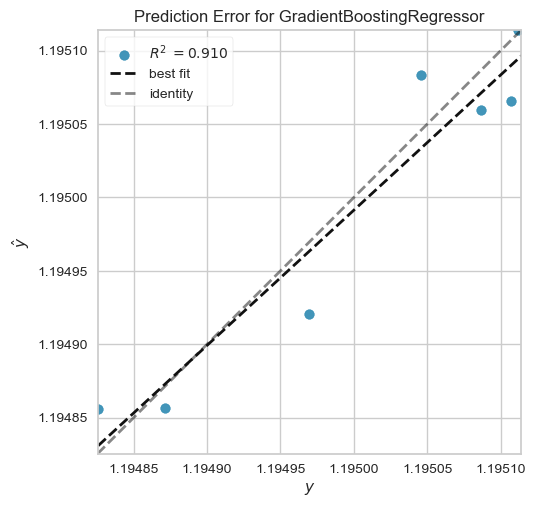

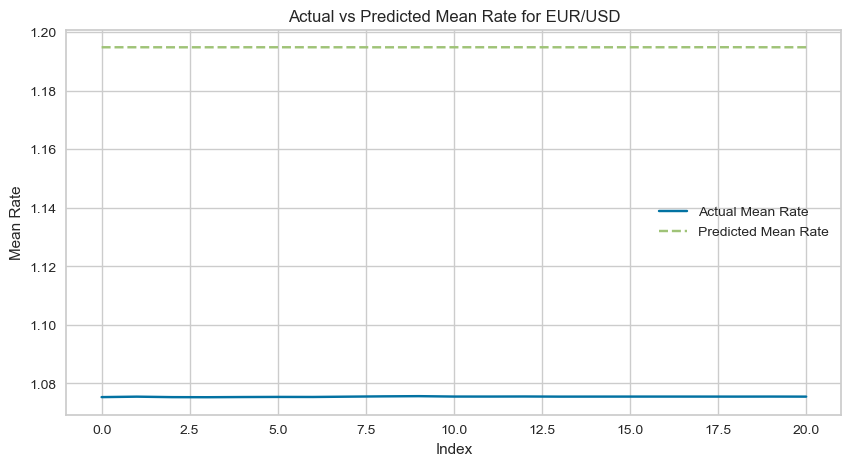

2024-05-07 18:01:44,008 - INFO - MSE for EUR/USD: 0.01425736808798545


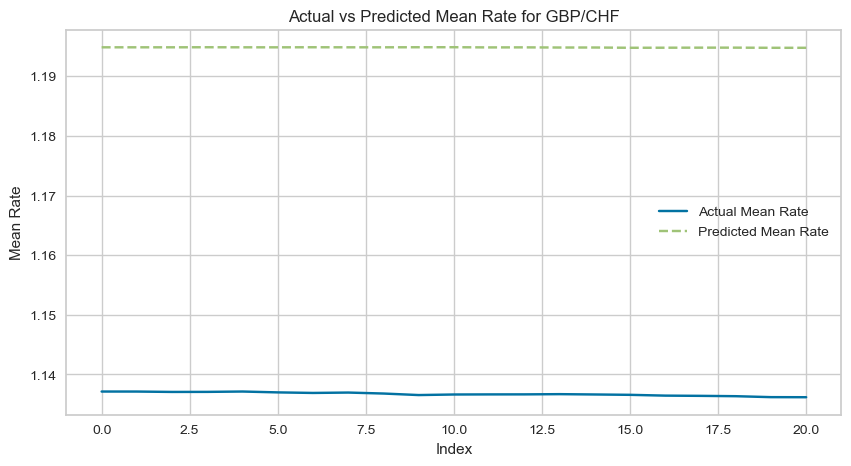

2024-05-07 18:01:44,250 - INFO - MSE for GBP/CHF: 0.0033784810472137976


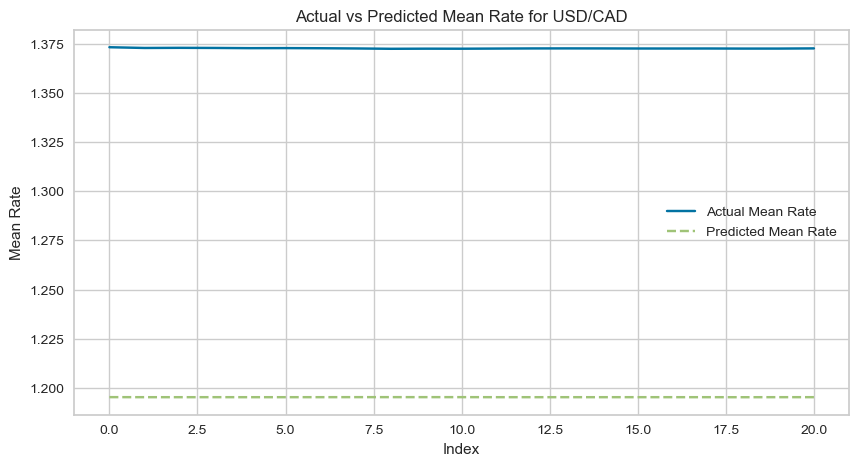

2024-05-07 18:01:44,489 - INFO - MSE for USD/CAD: 0.031520210355831677
2024-05-07 18:01:44,489 - INFO - Label for GBP/CHF: FORECASTABLE
2024-05-07 18:01:44,489 - INFO - Label for EUR/USD: UNDEFINED
2024-05-07 18:01:44,490 - INFO - Label for USD/CAD: NON-FORECASTABLE
2024-05-07 18:01:45,282 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.0757, 'bid': 1.0754, 'exchange': 48, 'timestamp': 1715119302000}, 'request_id': '63874be6ea7237a5cadc1953449bbb59', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 18:01:45,576 - INFO - Stored EUR/USD rate at 2024-05-07 18:01:45.283985: 1.07555
2024-05-07 18:01:46,003 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.13647, 'bid': 1.13564, 'exchange': 48, 'timestamp': 1715119306000}, 'request_id': '82bdb6e7898d6136294929017c57cc2e', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 18:01:46,200 - INFO - Stored GBP/CHF rate at 2024-05-07 18:01:46.005025: 1.136055
2024-05-07 18:01:46,932 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37279, 'bid': 1.3

                           pair_name      rate
2024-05-07 18:01:17.149630   BTC/USD  63052.46
2024-05-07 18:01:52.667204   BTC/USD  63060.00
2024-05-07 18:02:00.546764   BTC/USD  63057.63
2024-05-07 18:02:07.355126   BTC/USD  63059.30
2024-05-07 18:02:14.334957   BTC/USD  63059.00
2024-05-07 18:02:21.520329   BTC/USD  63039.00
2024-05-07 18:02:28.338595   BTC/USD  63027.40
2024-05-07 18:02:35.079157   BTC/USD  63027.39
2024-05-07 18:02:41.453704   BTC/USD  63027.39
2024-05-07 18:02:48.413675   BTC/USD  63037.62
2024-05-07 18:02:55.650905   BTC/USD  63027.67
2024-05-07 18:03:02.574825   BTC/USD  63030.68
2024-05-07 18:03:09.012195   BTC/USD  63030.67
2024-05-07 18:03:16.153592   BTC/USD  63030.62
2024-05-07 18:03:24.449906   BTC/USD  63030.62
2024-05-07 18:03:32.068037   BTC/USD  63014.00
2024-05-07 18:03:39.325215   BTC/USD  62994.88
2024-05-07 18:03:46.533563   BTC/USD  62971.03
2024-05-07 18:03:53.128554   BTC/USD  62977.12
2024-05-07 18:04:00.374681   BTC/USD  62986.29
2024-05-07 18

2024-05-07 18:07:20,885 - INFO - Updated correlation for EUR/USD with BTC/USD: 0.0641941462891395
2024-05-07 18:07:21,076 - INFO - Updated correlation for EUR/USD with EUR/USD: 1.0
2024-05-07 18:07:21,268 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.6204093768649762
2024-05-07 18:07:21,460 - INFO - Updated correlation for GBP/CHF with EUR/USD: 0.1485750359724329
2024-05-07 18:07:21,651 - INFO - Updated correlation for USD/CAD with BTC/USD: 0.29582012150555226
2024-05-07 18:07:21,834 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.18816129966039916
2024-05-07 18:07:22,027 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.6108432559294665
2024-05-07 18:07:22,189 - INFO - Updated correlation for EUR/CHF with EUR/USD: 0.11647385609112801
2024-05-07 18:07:22,360 - INFO - Updated correlation for EUR/CAD with BTC/USD: 0.4850600747090824
2024-05-07 18:07:22,527 - INFO - Updated correlation for EUR/CAD with EUR/USD: 0.34765039500994555
2024-05-07 18:07:22,718 - INFO

,Description,Value
0,Session id,123
1,Target,mean
2,Target type,Regression
3,Original data shape,"(21, 7)"
4,Transformed data shape,"(21, 7)"
5,Transformed train set shape,"(14, 7)"
6,Transformed test set shape,"(7, 7)"
7,Numeric features,6
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,0.0000,0.0000,0.0000,0.8954,0.0000,0.0000,0.0167
et,Extra Trees Regressor,0.0000,0.0000,0.0000,0.8849,0.0000,0.0000,0.0300
rf,Random Forest Regressor,0.0000,0.0000,0.0001,0.8414,0.0000,0.0000,0.0367
ada,AdaBoost Regressor,0.0000,0.0000,0.0001,0.8336,0.0000,0.0000,0.0233
huber,Huber Regressor,0.0000,0.0000,0.0001,0.8288,0.0000,0.0000,0.0133
dt,Decision Tree Regressor,0.0000,0.0000,0.0001,0.7519,0.0000,0.0000,0.0067
lr,Linear Regression,0.0001,0.0000,0.0001,0.6548,0.0000,0.0001,1.0433
br,Bayesian Ridge,0.0001,0.0000,0.0001,0.4915,0.0000,0.0001,0.0100
lar,Least Angle Regression,0.0001,0.0000,0.0001,0.3970,0.0000,0.0001,0.7833
ridge,Ridge Regression,0.0001,0.0000,0.0001,0.1906,0.0001,0.0001,0.7900


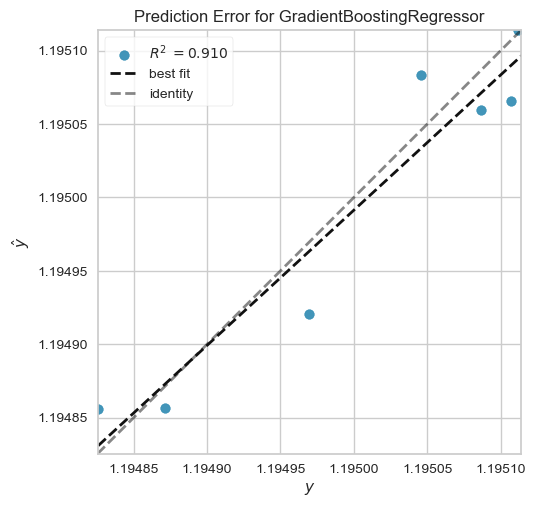

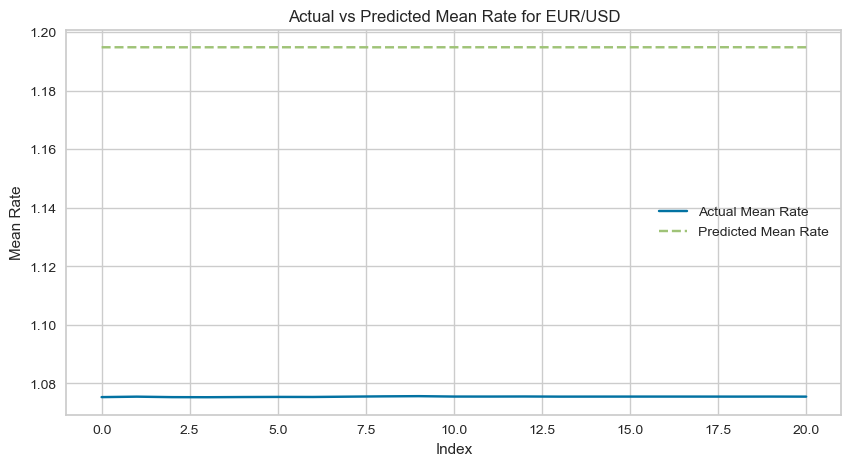

2024-05-07 18:07:44,322 - INFO - MSE for EUR/USD: 0.01425736808798545


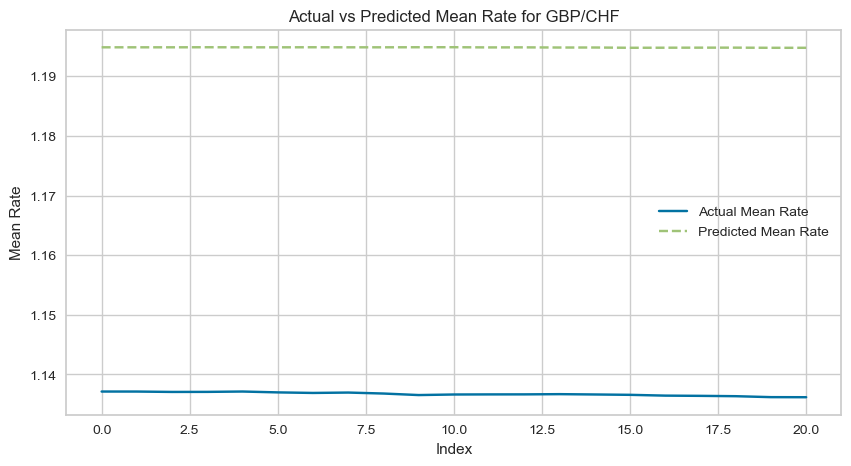

2024-05-07 18:07:44,584 - INFO - MSE for GBP/CHF: 0.0033784810472137976


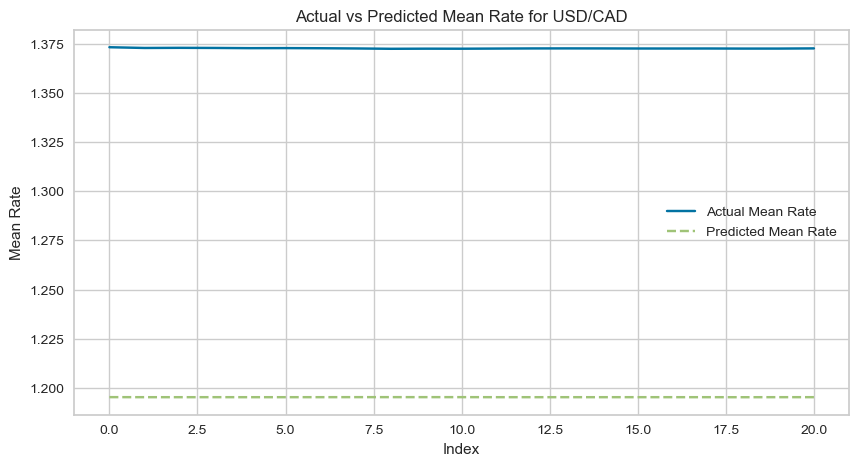

2024-05-07 18:07:44,821 - INFO - MSE for USD/CAD: 0.031520210355831677
2024-05-07 18:07:44,822 - INFO - Label for GBP/CHF: FORECASTABLE
2024-05-07 18:07:44,822 - INFO - Label for EUR/USD: UNDEFINED
2024-05-07 18:07:44,822 - INFO - Label for USD/CAD: NON-FORECASTABLE


,Description,Value
0,Session id,123
1,Target,Forecastability
2,Target type,Multiclass
3,Target mapping,"FORECASTABLE: 0, NON-FORECASTABLE: 1, UNDEFINED: 2"
4,Original data shape,"(63, 9)"
5,Transformed data shape,"(63, 7)"
6,Transformed train set shape,"(44, 7)"
7,Transformed test set shape,"(19, 7)"
8,Ignore features,2
9,Numeric features,6


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
nb,Naive Bayes,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0050
dt,Decision Tree Classifier,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0050
rf,Random Forest Classifier,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0200
ada,Ada Boost Classifier,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0150
lda,Linear Discriminant Analysis,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0070
et,Extra Trees Classifier,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0170
gbc,Gradient Boosting Classifier,0.9750,0.0000,0.9750,0.9625,0.9667,0.9600,0.9671,0.0220
ridge,Ridge Classifier,0.8900,0.0000,0.8900,0.8633,0.8642,0.8414,0.8797,0.0060
lr,Logistic Regression,0.8650,0.0000,0.8650,0.8508,0.8392,0.8051,0.8497,0.0180
svm,SVM - Linear Kernel,0.7350,0.0000,0.7350,0.6652,0.6767,0.6081,0.6280,0.0090


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Naive Bayes,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Classification percentages for EUR/CHF:prediction_label
FORECASTABLE    100.0
Name: proportion, dtype: float64
Classification percentages for EUR/CAD:prediction_label
NON-FORECASTABLE    100.0
Name: proportion, dtype: float64
Classification percentages for GBP/EUR:prediction_label
FORECASTABLE    100.0
Name: proportion, dtype: float64
Classification percentages for GBP/USD:prediction_label
FORECASTABLE    100.0
Name: proportion, dtype: float64
Classification percentages for GBP/CAD:prediction_label
NON-FORECASTABLE    100.0
Name: proportion, dtype: float64
Classification percentages for USD/CHF:prediction_label
FORECASTABLE    100.0
Name: proportion, dtype: float64
Classification percentages for USD/JPY:prediction_label
FORECASTABLE    100.0
Name: proportion, dtype: float64


2024-05-07 18:07:50,835 - INFO - Retrieved EUR/USD: {'last': {'ask': 1.0756, 'bid': 1.0753, 'exchange': 48, 'timestamp': 1715119667000}, 'request_id': '4ad42e1e4a203ce1d573159f106ee394', 'status': 'success', 'symbol': 'EUR/USD'}
2024-05-07 18:07:51,304 - INFO - Stored EUR/USD rate at 2024-05-07 18:07:50.836904: 1.07545
2024-05-07 18:07:51,533 - INFO - Retrieved GBP/CHF: {'last': {'ask': 1.13641, 'bid': 1.13558, 'exchange': 48, 'timestamp': 1715119671000}, 'request_id': 'e779f047829585f73db1d43cafbbd555', 'status': 'success', 'symbol': 'GBP/CHF'}
2024-05-07 18:07:51,691 - INFO - Stored GBP/CHF rate at 2024-05-07 18:07:51.535024: 1.1359949999999999
2024-05-07 18:07:51,933 - INFO - Retrieved USD/CAD: {'last': {'ask': 1.37305, 'bid': 1.37282, 'exchange': 48, 'timestamp': 1715119672000}, 'request_id': '1e47d1f5526aeb2cd248340ac9857311', 'status': 'success', 'symbol': 'USD/CAD'}
2024-05-07 18:07:52,108 - INFO - Stored USD/CAD rate at 2024-05-07 18:07:51.935983: 1.372935
2024-05-07 18:07:52,3

                           pair_name      rate
2024-05-07 18:07:17.289099   BTC/USD  63014.49
2024-05-07 18:07:56.257389   BTC/USD  62985.98
2024-05-07 18:08:03.215412   BTC/USD  62981.02
2024-05-07 18:08:10.879499   BTC/USD  62977.99
2024-05-07 18:08:17.999963   BTC/USD  62984.36
2024-05-07 18:08:24.945927   BTC/USD  63010.40
2024-05-07 18:08:32.166218   BTC/USD  63010.30
2024-05-07 18:08:39.961970   BTC/USD  62963.34
2024-05-07 18:08:46.788330   BTC/USD  62968.57
2024-05-07 18:08:53.474074   BTC/USD  63091.00
2024-05-07 18:08:59.910483   BTC/USD  62952.17
2024-05-07 18:09:07.173690   BTC/USD  62946.62
2024-05-07 18:09:14.271341   BTC/USD  62938.24
2024-05-07 18:09:20.673509   BTC/USD  62942.31
2024-05-07 18:09:27.247545   BTC/USD  62937.91
2024-05-07 18:09:33.749760   BTC/USD  62938.65
2024-05-07 18:09:40.662777   BTC/USD  62948.45
2024-05-07 18:09:47.762427   BTC/USD  62945.13
2024-05-07 18:09:54.623710   BTC/USD  62945.00
2024-05-07 18:10:02.703689   BTC/USD  62952.02
2024-05-07 18

2024-05-07 18:13:15,438 - INFO - Updated correlation for EUR/USD with BTC/USD: 0.2687064230527881
2024-05-07 18:13:15,631 - INFO - Updated correlation for EUR/USD with EUR/USD: 1.0
2024-05-07 18:13:15,789 - INFO - Updated correlation for GBP/CHF with BTC/USD: 0.6586694185350213
2024-05-07 18:13:15,947 - INFO - Updated correlation for GBP/CHF with EUR/USD: 0.4584833847129638
2024-05-07 18:13:16,130 - INFO - Updated correlation for USD/CAD with BTC/USD: 0.008555404586404332
2024-05-07 18:13:16,313 - INFO - Updated correlation for USD/CAD with EUR/USD: -0.6471462345218483
2024-05-07 18:13:16,489 - INFO - Updated correlation for EUR/CHF with BTC/USD: 0.6528356039480777
2024-05-07 18:13:16,646 - INFO - Updated correlation for EUR/CHF with EUR/USD: 0.38162881998611536
2024-05-07 18:13:16,823 - INFO - Updated correlation for EUR/CAD with BTC/USD: 0.4235523350503448
2024-05-07 18:13:16,996 - INFO - Updated correlation for EUR/CAD with EUR/USD: 0.033812447779579625
2024-05-07 18:13:17,172 - INF

,Description,Value
0,Session id,123
1,Target,mean
2,Target type,Regression
3,Original data shape,"(21, 7)"
4,Transformed data shape,"(21, 7)"
5,Transformed train set shape,"(14, 7)"
6,Transformed test set shape,"(7, 7)"
7,Numeric features,6
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,0.0000,0.0000,0.0000,0.8954,0.0000,0.0000,0.0167
et,Extra Trees Regressor,0.0000,0.0000,0.0000,0.8849,0.0000,0.0000,0.0300
rf,Random Forest Regressor,0.0000,0.0000,0.0001,0.8414,0.0000,0.0000,0.0367
ada,AdaBoost Regressor,0.0000,0.0000,0.0001,0.8336,0.0000,0.0000,0.0233
huber,Huber Regressor,0.0000,0.0000,0.0001,0.8288,0.0000,0.0000,0.0133
dt,Decision Tree Regressor,0.0000,0.0000,0.0001,0.7519,0.0000,0.0000,0.0067
lr,Linear Regression,0.0001,0.0000,0.0001,0.6548,0.0000,0.0001,0.0533
br,Bayesian Ridge,0.0001,0.0000,0.0001,0.4915,0.0000,0.0001,0.7067
lar,Least Angle Regression,0.0001,0.0000,0.0001,0.3970,0.0000,0.0001,0.7800
ridge,Ridge Regression,0.0001,0.0000,0.0001,0.1906,0.0001,0.0001,0.7933


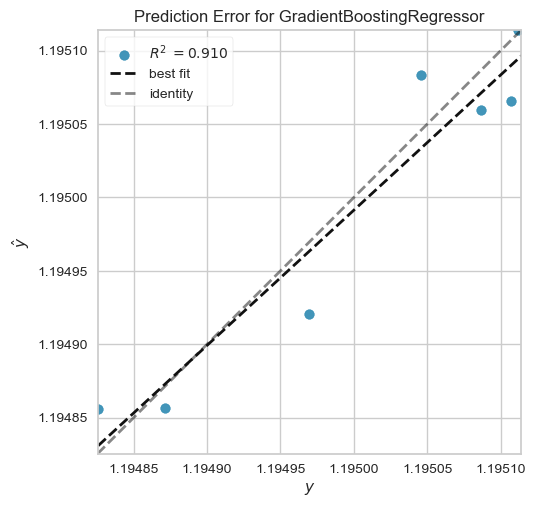

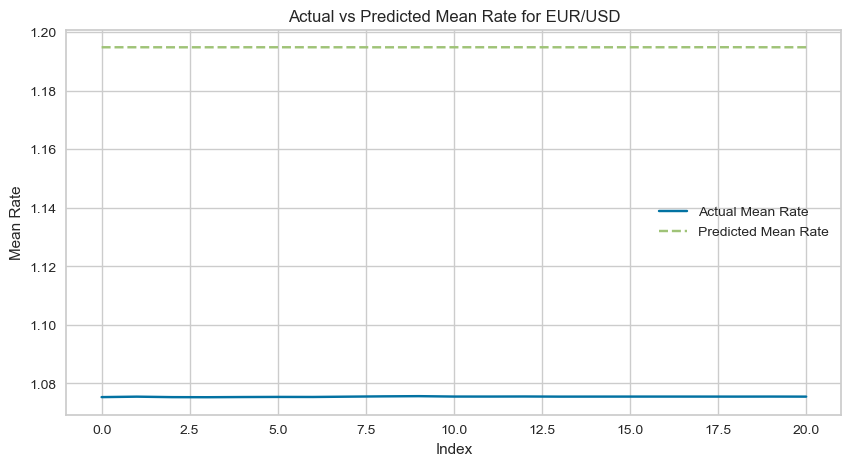

2024-05-07 18:13:38,530 - INFO - MSE for EUR/USD: 0.01425736808798545


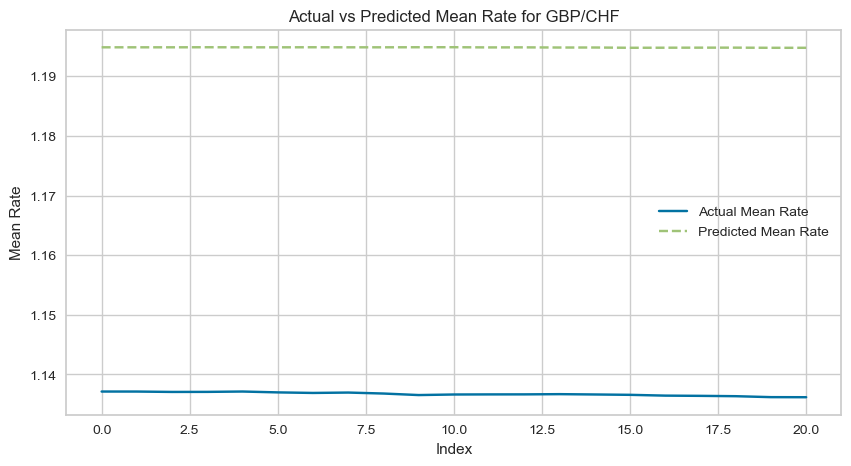

2024-05-07 18:13:38,758 - INFO - MSE for GBP/CHF: 0.0033784810472137976


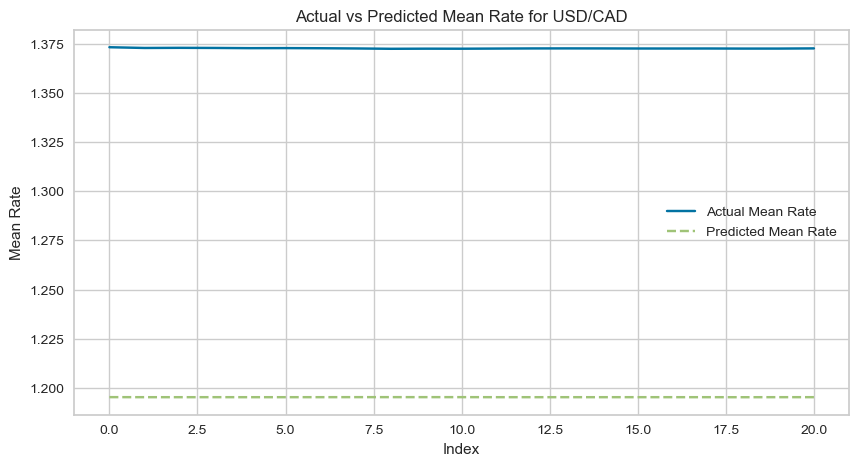

2024-05-07 18:13:38,993 - INFO - MSE for USD/CAD: 0.031520210355831677
2024-05-07 18:13:38,994 - INFO - Label for GBP/CHF: FORECASTABLE
2024-05-07 18:13:38,994 - INFO - Label for EUR/USD: UNDEFINED
2024-05-07 18:13:38,995 - INFO - Label for USD/CAD: NON-FORECASTABLE


,Description,Value
0,Session id,123
1,Target,Forecastability
2,Target type,Multiclass
3,Target mapping,"FORECASTABLE: 0, NON-FORECASTABLE: 1, UNDEFINED: 2"
4,Original data shape,"(63, 9)"
5,Transformed data shape,"(63, 7)"
6,Transformed train set shape,"(44, 7)"
7,Transformed test set shape,"(19, 7)"
8,Ignore features,2
9,Numeric features,6


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
nb,Naive Bayes,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0060
dt,Decision Tree Classifier,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0060
rf,Random Forest Classifier,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0200
ada,Ada Boost Classifier,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0120
lda,Linear Discriminant Analysis,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0050
et,Extra Trees Classifier,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.0170
gbc,Gradient Boosting Classifier,0.9750,0.0000,0.9750,0.9625,0.9667,0.9600,0.9671,0.0220
ridge,Ridge Classifier,0.8900,0.0000,0.8900,0.8633,0.8642,0.8414,0.8797,0.0050
lr,Logistic Regression,0.8650,0.0000,0.8650,0.8508,0.8392,0.8051,0.8497,0.0090
svm,SVM - Linear Kernel,0.7350,0.0000,0.7350,0.6652,0.6767,0.6081,0.6280,0.0070


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Naive Bayes,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Classification percentages for EUR/CHF:prediction_label
FORECASTABLE    100.0
Name: proportion, dtype: float64
Classification percentages for EUR/CAD:prediction_label
NON-FORECASTABLE    100.0
Name: proportion, dtype: float64
Classification percentages for GBP/EUR:prediction_label
FORECASTABLE    100.0
Name: proportion, dtype: float64
Classification percentages for GBP/USD:prediction_label
FORECASTABLE    100.0
Name: proportion, dtype: float64
Classification percentages for GBP/CAD:prediction_label
NON-FORECASTABLE    100.0
Name: proportion, dtype: float64
Classification percentages for USD/CHF:prediction_label
FORECASTABLE    100.0
Name: proportion, dtype: float64
Classification percentages for USD/JPY:prediction_label
FORECASTABLE    100.0
Name: proportion, dtype: float64


In [23]:
start_time = datetime.now()
end_time = start_time + timedelta(hours=5, minutes=12)
feature_interval = timedelta(minutes=6)
next_feature_time = start_time + feature_interval
correlation_start_time = start_time + timedelta(hours=2, minutes=6)
correlation_interval = timedelta(hours=2)
regression_time = start_time + timedelta(hours=4, minutes=6)
classification_time = start_time + timedelta(hours=5, minutes=6)

###Raw data retreiving
while datetime.now() <= end_time:
    for pair in base_cps + class_cps + [exogenous[1]]:
        data = fetch_data(pair)
        rate = (data['last']['ask'] + data['last']['bid']) / 2
        store_data(pair, rate, datetime.now())
   
    for pair in [exogenous[0]]:
        data = fetch_data_exo(pair)
        rate = data['last']['price']
        store_data(pair, rate, datetime.now())
    #the first two for loops are intended to continously store data within the entire processing time
    time.sleep(1)

    ###Extract Features
    if datetime.now() >= next_feature_time:
        logging.info(f"Starting feature aggregation for all pairs at {next_feature_time}")
        for pair in base_cps + class_cps:
            data = currency_lib.read(pair, date_range=(next_feature_time - feature_interval,next_feature_time)).data
            #At the end of each 6-minute window, read and process the stored data from the previous 6 minutes.
            rates = data['rate']
            max_rate = max(rates)
            min_rate = min(rates)
            mean_rate = np.mean(rates)
            vol = (max_rate - min_rate) / mean_rate if mean_rate != 0 else 0            
            try:
                prev_vol_data = currency_feature_lib.read(pair, date_range=(next_feature_time - feature_interval, next_feature_time - timedelta(seconds=1))).data
                prev_vol = prev_vol_data['vol'].iloc[-1] if not prev_vol_data.empty else 0
                #Locate the last volatility; if it's the first 6-minute group and no previous volatility exists, set pre_vol to 0.
            except (KeyError, IndexError, TypeError, NoSuchVersionException):
                prev_vol = 0
                # Since the first 6-minute group has no entry of previous volatility,iloc[-1] might trigger an error message
                # In such scenarios, assign prev_vol = 0.
            band_width = 0.025 * prev_vol            
            if band_width != 0:
                fd = sum(abs(r - prev_r)/band_width for r, prev_r in zip(rates[1:], rates[:-1])) / (max_rate - min_rate) / 100000 if (max_rate - min_rate) != 0 else 0
                #rates[1:] creates a list from the second element to the last element of rates.
                #rates[:-1] creates a list from the first element to the second-to-last element of rates.
                #zip() function takes these two lists and pairs them, resulting in pairs of (current rate, previous rate). 
                #This is used to accumulate number of crosses within this 6-minutes window
                #/100,000 is to normolizing FD, making it more intuiative for pair and pair comparison
                # It also enhances comprehension of the oscillation.
            else:
                fd = 0
                
            features_df = pd.DataFrame({
            'pair':[pair],
            'max': [max_rate],
            'min': [min_rate],
            'mean': [mean_rate],
            'vol': [vol],
            'fd': [fd]
            }, index=[pd.Timestamp(next_feature_time)]) 
            currency_feature_lib.append(pair, features_df)
            logging.info(f"Updated features for {pair} at {next_feature_time}")

        ###6-mins mean rate of exogenous data
        for exog in exogenous:
            exog_data = currency_lib.read(exog, date_range=(next_feature_time - feature_interval,next_feature_time)).data
            print(exog_data)
            rates = exog_data['rate']
            mean_exog_rate = np.mean(rates)

            
            df_exo = pd.DataFrame({'pair':[exog],
                                   'rate': [mean_exog_rate]
                                  }, index=[pd.Timestamp(next_feature_time)])
            exogenous_lib.update(exog,df_exo,upsert=True)
            #Since we are interested only in the mean rate of exogenous data, not its features,
            #the schema structure differs from the 6-minute feature groups of CPs.
            #For data integrity and clarity, this data is stored in a separate library.

            logging.info(f"Updated features for {exog} at {next_feature_time}")

        ###Correlation computation
        #trigger evey 6 mins after the correlation start time
        if datetime.now() >= correlation_start_time:
            for pair in base_cps + class_cps:
                base_rates = [item for item in currency_feature_lib.read(pair, date_range=(next_feature_time - correlation_interval, next_feature_time)).data['mean']]
                #This list comprehension collects data for correlation computation. For each 6-minute window starting from 'correlation_start_time',
                #it retrieves the previous 20 mean currency rates. The rates are stored in the list 'base_rates' which is used as input for correlation analysis.
                #The 'next_feature_time' is updated dynamically to continually adjust the data fetching window.
                for exog in exogenous:
                    exog_rates = [item for item in exogenous_lib.read(exog, date_range=(next_feature_time - correlation_interval, next_feature_time)).data['rate']]
                    correlation = np.corrcoef(base_rates, exog_rates)[0, 1] #top right of correlation matrix
                    df_feature = currency_feature_lib.read(pair, date_range=(next_feature_time - timedelta(seconds=1), next_feature_time + timedelta(seconds=1))).data
                    #read the feature data at the nex_feature_time explicitly, to +/- 1 seconds is make sure the inclusive of data at this next feature time
                    df_feature[f'correlation_with_{exog}'] = correlation
                    currency_feature_lib.update(pair,df_feature,upsert=True)
                    #lib.update, is used to modify existing records and add new records (here is to add the correlation column)
                    #upset=True, this operation should insert new record if one does not already exist for the given key (pair)
                    logging.info(f"Updated correlation for {pair} with {exog}: {correlation}")        
            #Correlation computation occurs once 20 data points are gathered. The correlation is calculated between each combination of control points (CPs) and exogenous objects. 
            #Using nested loops (i, j) is the optimized approach for handling the pairwise computations efficiently. 
            #This ensures each possible pair is considered for correlation analysis without redundant calculations. 
        next_feature_time += feature_interval
        #updating the next_feature_time 

        ###Regression on aggregate feature data of base CPs
        if datetime.now() >= regression_time: #just trigger once
            start = regression_time - correlation_interval
            end = regression_time
            aggregated_data = aggregate_data(base_cps, start, end)
            insert_aggregated_data_to_regression_lib(aggregated_data)
            df = regression_lib.read('aggregated_base_cps').data
            experiment = setup(df,
                               target='mean',
                              fold=3,
                              session_id=123)
            best = compare_models()
            plot_model(best, plot = 'error')
            
            ##Manually assign the labels based on MSE
            predictions ={}
            mse_scores ={}
            for pair in base_cps:
                base_data = currency_feature_lib.read(pair,date_range=(regression_time - correlation_interval, regression_time)).data
                features = base_data[['vol','fd','max','min','correlation_with_BTC/USD','correlation_with_EUR/USD']]
                results = predict_model(best, data=features)
                predictions[pair] = results
                
                predicted_mean_rate = results['prediction_label']
                actual_mean_rate = base_data['mean']
                
                mse = mean_squared_error(actual_mean_rate, predicted_mean_rate)
                #the sklearn package of computing mse score
                mse_scores[pair] = mse
                
                plt.figure(figsize=(10, 5))
                plt.plot(actual_mean_rate.reset_index(drop=True), label='Actual Mean Rate')
                #drop the datetime index for ensure the consistency and for easily to be visualized
                plt.plot(predicted_mean_rate.reset_index(drop=True), label='Predicted Mean Rate', linestyle='--')
                plt.title(f'Actual vs Predicted Mean Rate for {pair}')
                plt.xlabel('Index')
                plt.ylabel('Mean Rate')
                plt.legend()
                plt.show()

                logging.info(f"MSE for {pair}: {mse}")
            
            sorted_pairs = sorted(mse_scores, key=mse_scores.get)
            #sort function is to sort the key by default
            #thus, we use dictionary.get to fetch the value corresponding the key
            #and sort on the value directly
            labels = {sorted_pairs[0]: 'FORECASTABLE',  # Best performance
                      sorted_pairs[1]: 'UNDEFINED',  # Middle performance
                      sorted_pairs[2]: 'NON-FORECASTABLE'  # Worst performance
                     }
            
            for pair, label in labels.items(): #dic.items returns a list of dictionary's key-value tuple pairs
                logging.info(f"Label for {pair}: {label}")
            
            for pair in base_cps:
                base_data = currency_feature_lib.read(pair, date_range=(regression_time - correlation_interval, regression_time)).data
                base_data['Forecastability'] = labels[pair]
                classification_lib.write(pair, base_data) #write data into a new library for preparation of classificaiton
        
        ###Classification part                
        if datetime.now() >= classification_time: #just trigger once
            start = regression_time - correlation_interval
            end = classification_time
            df_class = class_base_data(base_cps, start, end)
            #aggregate all pairs into one dataframe
            df_class.reset_index(drop=True, inplace=True)
            #since there are duplicated datetime index, which is not compatible for pycaret
            #rest index to default integr index
            #drop=true, is to instruct it not to insert the old index as a column, instead discard it
            #inplace=ture, is to modify the existing one, not return a new dataframe
            experiment = setup_class(df_class,
                         target='Forecastability',
                         ignore_features=['pair','mean'],
                         session_id=123)
    
            best = compare_models_class()
            predict_model_class(best)

            ##Classify the class_cps
            predictions={} #create a dictionary to hold the results of prediction_label of each class_cps
            for pair in class_cps:
                class_data = currency_feature_lib.read(pair, date_range=(correlation_start_time, classification_time)).data
                features = class_data[['vol','fd','max','min','correlation_with_BTC/USD','correlation_with_EUR/USD']]
                result_df = predict_model_class(best, data=features)                
                prediction_counts = result_df['prediction_label'].value_counts(normalize=True) * 100
                #value_counts is applied to prediction_label and returns a series containing unique values as index
                #and counts value, useful to quickly understading the distribution of categories
                #normalize=True, retruns the relative freqency, since i would like to know percentage of each unique lables of each pairs
                predictions[pair] = prediction_counts
                
            for pair, counts in predictions.items():
                print(f"Classification percentages for {pair}:{counts}")

,Description,Value
0,Session id,123
1,Target,rate
2,Target type,Regression
3,Original data shape,"(463, 3)"
4,Transformed data shape,"(463, 2)"
5,Transformed train set shape,"(324, 2)"
6,Transformed test set shape,"(139, 2)"
7,Ignore features,1
8,Numeric features,1
9,Preprocess,True


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0001,0.0000,0.0002,0.4284,0.0001,0.0001
1,0.0002,0.0000,0.0002,0.5721,0.0001,0.0002
2,0.0002,0.0000,0.0002,0.5177,0.0001,0.0001
3,0.0001,0.0000,0.0002,0.6118,0.0001,0.0001
4,0.0002,0.0000,0.0002,0.5684,0.0001,0.0001
5,0.0002,0.0000,0.0002,0.5379,0.0001,0.0001
6,0.0001,0.0000,0.0002,0.4974,0.0001,0.0001
7,0.0002,0.0000,0.0002,0.5059,0.0001,0.0001
8,0.0002,0.0000,0.0002,0.3144,0.0001,0.0001


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Linear Regression,0.0002,0.0000,0.0002,0.4942,0.0001,0.0001


,Description,Value
0,Session id,123
1,Target,rate
2,Target type,Regression
3,Original data shape,"(463, 3)"
4,Transformed data shape,"(463, 2)"
5,Transformed train set shape,"(324, 2)"
6,Transformed test set shape,"(139, 2)"
7,Ignore features,1
8,Numeric features,1
9,Preprocess,True


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0003,0.0000,0.0003,0.1203,0.0001,0.0002
1,0.0003,0.0000,0.0003,0.3170,0.0001,0.0002
2,0.0003,0.0000,0.0003,0.2015,0.0001,0.0002
3,0.0003,0.0000,0.0003,0.0913,0.0001,0.0002
4,0.0003,0.0000,0.0003,0.0912,0.0001,0.0002
5,0.0003,0.0000,0.0003,0.0907,0.0001,0.0002
6,0.0003,0.0000,0.0003,-0.2095,0.0001,0.0002
7,0.0003,0.0000,0.0003,0.2762,0.0001,0.0002
8,0.0003,0.0000,0.0003,0.0827,0.0001,0.0002


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Linear Regression,0.0003,0.0000,0.0003,0.1701,0.0001,0.0002


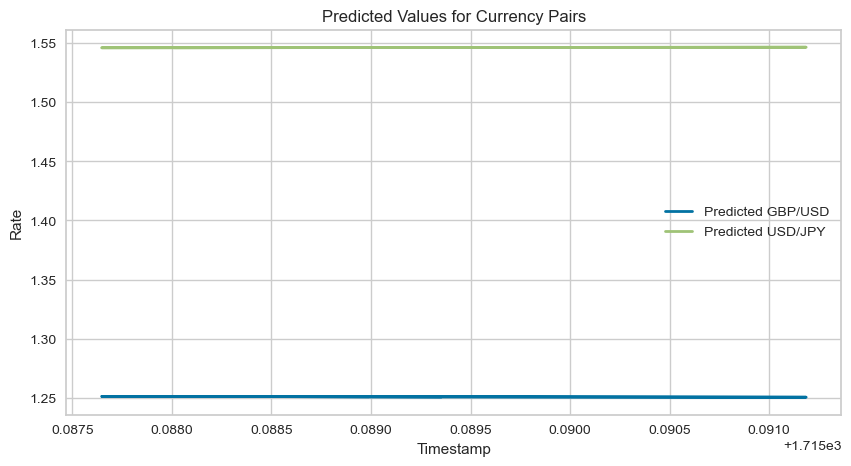

2024-05-07 18:13:47,532 - INFO - long USD/JPY and short GBP/USD
2024-05-07 18:13:47,841 - INFO - Retrieved USD/JPY: {'last': {'ask': 154.702, 'bid': 154.692, 'exchange': 48, 'timestamp': 1715120027000}, 'request_id': 'dee63033cf7dc31b2231de975f29102b', 'status': 'success', 'symbol': 'USD/JPY'}
2024-05-07 18:13:48,011 - INFO - Stored USD/JPY rate at 2024-05-07 18:13:47.843663: 154.697
2024-05-07 18:13:48,283 - INFO - Retrieved GBP/USD: {'last': {'ask': 1.2504, 'bid': 1.2502, 'exchange': 48, 'timestamp': 1715120027000}, 'request_id': '21318454d37d876a6b70a4e28c4d726f', 'status': 'success', 'symbol': 'GBP/USD'}
2024-05-07 18:13:48,441 - INFO - Stored GBP/USD rate at 2024-05-07 18:13:48.285481: 1.2503
2024-05-07 18:13:48,873 - INFO - Retrieved USD/JPY: {'last': {'ask': 154.702, 'bid': 154.692, 'exchange': 48, 'timestamp': 1715120027000}, 'request_id': '229e9d53f5a92d2fd877ece4f69f02c5', 'status': 'success', 'symbol': 'USD/JPY'}
2024-05-07 18:13:49,034 - INFO - Stored USD/JPY rate at 2024-0

,Description,Value
0,Session id,123
1,Target,rate
2,Target type,Regression
3,Original data shape,"(2217, 3)"
4,Transformed data shape,"(2217, 2)"
5,Transformed train set shape,"(1551, 2)"
6,Transformed test set shape,"(666, 2)"
7,Ignore features,1
8,Numeric features,1
9,Preprocess,True


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0001,0.0000,0.0001,0.3340,0.0001,0.0001
1,0.0001,0.0000,0.0001,0.2652,0.0001,0.0001
2,0.0001,0.0000,0.0001,0.3826,0.0001,0.0001
3,0.0001,0.0000,0.0001,0.4021,0.0001,0.0001
4,0.0001,0.0000,0.0001,0.2293,0.0001,0.0001
5,0.0001,0.0000,0.0001,0.3656,0.0001,0.0001
6,0.0001,0.0000,0.0001,0.3858,0.0001,0.0001
7,0.0001,0.0000,0.0001,0.3530,0.0001,0.0001
8,0.0001,0.0000,0.0001,0.2196,0.0001,0.0001


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Linear Regression,0.0001,0.0000,0.0001,0.2677,0.0001,0.0001


,Description,Value
0,Session id,123
1,Target,rate
2,Target type,Regression
3,Original data shape,"(2217, 3)"
4,Transformed data shape,"(2217, 2)"
5,Transformed train set shape,"(1551, 2)"
6,Transformed test set shape,"(666, 2)"
7,Ignore features,1
8,Numeric features,1
9,Preprocess,True


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0001,0.0000,0.0002,0.6638,0.0001,0.0001
1,0.0001,0.0000,0.0002,0.5661,0.0001,0.0001
2,0.0001,0.0000,0.0001,0.7174,0.0001,0.0001
3,0.0001,0.0000,0.0001,0.6887,0.0001,0.0001
4,0.0001,0.0000,0.0002,0.6217,0.0001,0.0001
5,0.0001,0.0000,0.0002,0.7007,0.0001,0.0001
6,0.0001,0.0000,0.0002,0.6447,0.0001,0.0001
7,0.0001,0.0000,0.0002,0.6317,0.0001,0.0001
8,0.0001,0.0000,0.0002,0.6395,0.0001,0.0001


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Linear Regression,0.0001,0.0000,0.0002,0.6553,0.0001,0.0001


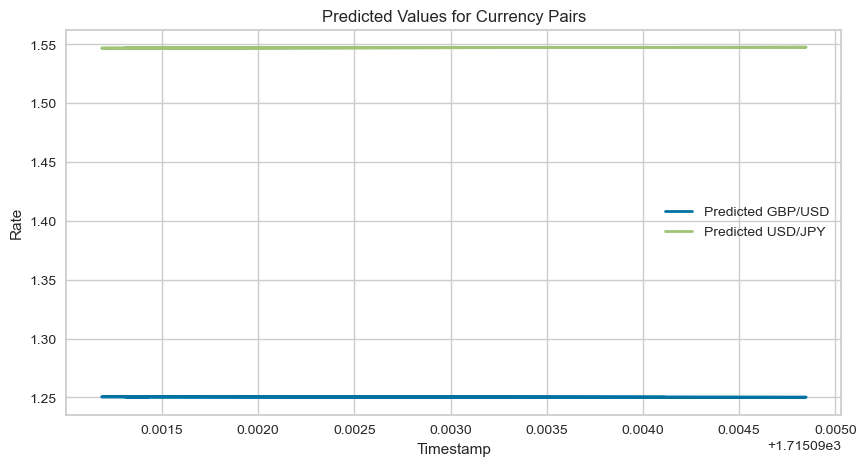

2024-05-07 19:13:55,606 - INFO - long USD/JPY and short GBP/USD
2024-05-07 19:13:55,893 - INFO - Retrieved USD/JPY: {'last': {'ask': 154.784, 'bid': 154.761, 'exchange': 48, 'timestamp': 1715123635000}, 'request_id': '1f9aebbdb9f49700d82af2efa36f3e5a', 'status': 'success', 'symbol': 'USD/JPY'}
2024-05-07 19:13:56,450 - INFO - Stored USD/JPY rate at 2024-05-07 19:13:55.895053: 154.77249999999998
2024-05-07 19:13:56,911 - INFO - Retrieved GBP/USD: {'last': {'ask': 1.25018, 'bid': 1.25003, 'exchange': 48, 'timestamp': 1715123636000}, 'request_id': '2231931afccae13220400158215f528a', 'status': 'success', 'symbol': 'GBP/USD'}
2024-05-07 19:13:57,483 - INFO - Stored GBP/USD rate at 2024-05-07 19:13:56.913706: 1.250105
2024-05-07 19:13:57,924 - INFO - Retrieved USD/JPY: {'last': {'ask': 154.784, 'bid': 154.761, 'exchange': 48, 'timestamp': 1715123635000}, 'request_id': '97f2f6176dceaf0c352f5e396cce25de', 'status': 'success', 'symbol': 'USD/JPY'}
2024-05-07 19:13:58,455 - INFO - Stored USD/JPY

,Description,Value
0,Session id,123
1,Target,rate
2,Target type,Regression
3,Original data shape,"(1768, 3)"
4,Transformed data shape,"(1768, 2)"
5,Transformed train set shape,"(1237, 2)"
6,Transformed test set shape,"(531, 2)"
7,Ignore features,1
8,Numeric features,1
9,Preprocess,True


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0001,0.0000,0.0001,0.4242,0.0001,0.0001
1,0.0001,0.0000,0.0001,0.3675,0.0000,0.0001
2,0.0001,0.0000,0.0001,0.3981,0.0001,0.0001
3,0.0001,0.0000,0.0001,0.2824,0.0000,0.0001
4,0.0001,0.0000,0.0001,0.4386,0.0000,0.0001
5,0.0001,0.0000,0.0001,0.2824,0.0000,0.0001
6,0.0001,0.0000,0.0001,0.0756,0.0001,0.0001
7,0.0001,0.0000,0.0001,0.3562,0.0000,0.0001
8,0.0001,0.0000,0.0001,0.3298,0.0001,0.0001


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Linear Regression,0.0001,0.0000,0.0001,0.3273,0.0001,0.0001


,Description,Value
0,Session id,123
1,Target,rate
2,Target type,Regression
3,Original data shape,"(1768, 3)"
4,Transformed data shape,"(1768, 2)"
5,Transformed train set shape,"(1237, 2)"
6,Transformed test set shape,"(531, 2)"
7,Ignore features,1
8,Numeric features,1
9,Preprocess,True


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0002,0.0000,0.0003,0.1430,0.0001,0.0001
1,0.0002,0.0000,0.0002,0.3015,0.0001,0.0001
2,0.0002,0.0000,0.0003,0.2907,0.0001,0.0001
3,0.0002,0.0000,0.0003,0.2033,0.0001,0.0001
4,0.0002,0.0000,0.0003,0.2478,0.0001,0.0001
5,0.0002,0.0000,0.0003,0.3332,0.0001,0.0001
6,0.0002,0.0000,0.0003,0.1678,0.0001,0.0001
7,0.0002,0.0000,0.0003,0.2901,0.0001,0.0001
8,0.0002,0.0000,0.0003,0.1429,0.0001,0.0001


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Linear Regression,0.0002,0.0000,0.0003,0.2980,0.0001,0.0001


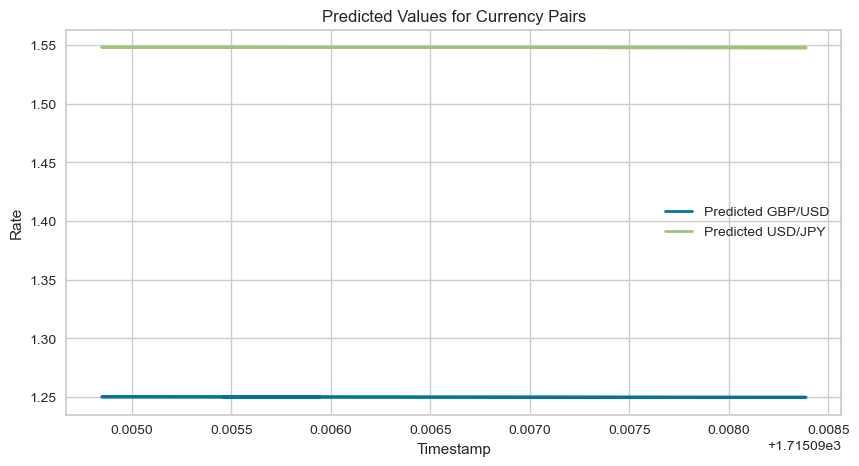

2024-05-07 20:13:55,568 - INFO - long GBP/USD and short USD/JPY
2024-05-07 20:13:55,879 - INFO - Retrieved GBP/USD: {'last': {'ask': 1.25018, 'bid': 1.25009, 'exchange': 48, 'timestamp': 1715127235000}, 'request_id': 'e8e2c60d4c5d8aad6d0cdce18fa2ee70', 'status': 'success', 'symbol': 'GBP/USD'}
2024-05-07 20:13:56,893 - INFO - Stored GBP/USD rate at 2024-05-07 20:13:55.880952: 1.250135
2024-05-07 20:13:57,572 - INFO - Retrieved USD/JPY: {'last': {'ask': 154.699, 'bid': 154.689, 'exchange': 48, 'timestamp': 1715127237000}, 'request_id': '86f1b08cbde9ba9f47c0b97677bd7acc', 'status': 'success', 'symbol': 'USD/JPY'}
2024-05-07 20:13:58,147 - INFO - Stored USD/JPY rate at 2024-05-07 20:13:57.574422: 154.69400000000002
2024-05-07 20:13:58,585 - INFO - Retrieved GBP/USD: {'last': {'ask': 1.25019, 'bid': 1.2501, 'exchange': 48, 'timestamp': 1715127238000}, 'request_id': '96a72a730f6dd6e21bfb35175835000e', 'status': 'success', 'symbol': 'GBP/USD'}
2024-05-07 20:13:59,100 - INFO - Stored GBP/USD 

In [24]:
trade_start = datetime.now()
trade_end = trade_start + timedelta(hours=3)
reinvestment_interval = timedelta(hours=1)
reinvestment_time = trade_start + reinvestment_interval + timedelta(seconds=1)
reinvestment_count = 0
rate = {}
active_reinvestments = []
long_cp = None
short_cp = None
prev_long_cp = None
prev_short_cp = None
first_short_cp_rate = None
first_long_cp_rate = None

# Initialize other variables
all_predictions = []
coeff = {}
formula = {}
ls_time = trade_start
ls_regression_window = timedelta(hours=1)
adjustment_interval = timedelta(hours=1)
next_adjustment = trade_start + adjustment_interval

def update_ls_pairs():
    global long_cp, short_cp, prev_long_cp, prev_short_cp, first_short_cp_rate, first_long_cp_rate, coeff, formula, all_predictions
    coeff = {}
    all_predictions = []
    
    for pair in Trade_cps:
        # Read rates of each trade pair over the last hour
        df = currency_lib.read(pair, date_range=(ls_time - ls_regression_window, ls_time)).data
        df.reset_index(inplace=True)
        df.rename(columns={'index': 'timestamp'}, inplace=True)
        df['timestamp'] = df['timestamp'] - timedelta(hours=4)
        df['timestamp'] = df['timestamp'].apply(lambda x: x.timestamp() / 1000000)

        if pair == "USD/JPY":
            df['rate'] = df['rate'] / 100

        # Linear regression setup and model creation
        experiment = setup(df,
                           target='rate',
                           ignore_features=['pair_name'],
                           session_id=123)
        model = create_model('lr')
        coeff[pair] = model.coef_[0]  # Store the coefficient
        formula[pair] = f'y = {model.coef_[0]}x + {model.intercept_}'
        predictions = predict_model(model)
        predictions['pair'] = pair  # Track currency pair with its predictions
        all_predictions.append(predictions)

    final_predictions = pd.concat(all_predictions)
    plt.figure(figsize=(10, 5))

    for pair in Trade_cps:
        subset = final_predictions[final_predictions['pair'] == pair]
        plt.plot(subset['timestamp'], subset['prediction_label'], label=f'Predicted {pair}', linewidth=2)

    plt.title('Predicted Values for Currency Pairs')
    plt.xlabel('Timestamp')
    plt.ylabel('Rate')
    plt.legend()
    plt.show()

    new_long_cp = max(coeff, key=coeff.get)
    new_short_cp = min(coeff, key=coeff.get)

    if new_long_cp != long_cp:
        first_long_cp_rate = None

    if new_short_cp != short_cp:
        first_short_cp_rate = None
    
    prev_long_cp = long_cp
    prev_short_cp = short_cp

    long_cp = new_long_cp
    short_cp = new_short_cp

    logging.info(f'long {long_cp} and short {short_cp}')


# Periodically update long and short pairs and update rates
update_ls_pairs()  # Initial long/short pair setup

while datetime.now() <= trade_end:
    # Update rates for the current long and short pairs
    if datetime.now() >= next_adjustment:
        ls_time = next_adjustment
        update_ls_pairs()       
        next_adjustment += adjustment_interval
    
    for pair in [long_cp, short_cp]:
        data = fetch_data(pair)
        rate_value = (data['last']['ask'] + data['last']['bid']) / 2
        rate[pair] = rate_value
        store_data(pair, rate_value, datetime.now())

        if pair == short_cp and first_short_cp_rate is None:
            first_short_cp_rate = rate[pair]
        elif pair == long_cp and first_long_cp_rate is None:
            first_long_cp_rate = rate[pair]

    df = pd.DataFrame({
        f'{long_cp}_rate': [rate[long_cp]],
        f'{short_cp}_rate': [rate[short_cp]]
    }, index=[pd.Timestamp(datetime.now())])

    df['L_position'] = first_short_cp_rate
    df['S_position'] = first_long_cp_rate
    df['LS_ratio'] = (rate[long_cp] * df['L_position']) / (rate[short_cp] * df['S_position'])

    if datetime.now() >= reinvestment_time:
        reinvestment_count += 1
        column_name = f'LS_ratio_{reinvestment_count}'
        df[column_name] = (df[f'{long_cp}_rate'] * df['L_position']) / (df[f'{short_cp}_rate'] * df['S_position'])
        active_reinvestments.append(column_name)  # Add this column to the list of active updates
        reinvestment_time += reinvestment_interval
    
    for column in active_reinvestments:
        df[column] = (df[f'{long_cp}_rate'] * df['L_position']) / (df[f'{short_cp}_rate'] * df['S_position'])

    trade_lib.append('portfolio', df)

In [33]:
trade_lib.read('portfolio').data

,USD/JPY_rate,GBP/USD_rate,L_position,S_position,LS_ratio,LS_ratio_1,LS_ratio_2
2024-05-07 18:13:48.442062,154.6970,1.250300,1.2503,154.697000,1.000000,NaN,NaN
2024-05-07 18:13:49.617916,154.6970,1.250300,1.2503,154.697000,1.000000,NaN,NaN
2024-05-07 18:13:50.744901,154.6970,1.250300,1.2503,154.697000,1.000000,NaN,NaN
2024-05-07 18:13:51.674414,154.6990,1.250300,1.2503,154.697000,1.000013,NaN,NaN
2024-05-07 18:13:52.797410,154.6990,1.250405,1.2503,154.697000,0.999929,NaN,NaN
...,...,...,...,...,...,...,...
2024-05-07 21:13:35.163848,154.9055,1.249710,154.6940,1.250135,0.998295,0.998295,0.998295
2024-05-07 21:13:37.152495,154.9045,1.249710,154.6940,1.250135,0.998302,0.998302,0.998302
2024-05-07 21:13:39.321951,154.9070,1.249800,154.6940,1.250135,0.998357,0.998357,0.998357
2024-05-07 21:13:42.454733,154.9050,1.249800,154.6940,1.250135,0.998370,0.998370,0.998370


In [60]:
target_time1 = pd.to_datetime('2024-05-07 18:13') + timedelta(hours=1)
target_time2 = pd.to_datetime('2024-05-07 18:13') + timedelta(hours=2)
#reinvest1 = target_time1.strftime('%Y-%m-%d %H:%M:%S')
reinvest1 = target_time1.strftime('%Y-%m-%d %H:%M')
reinvest2 = target_time2.strftime('%Y-%m-%d %H:%M')

In [61]:
trade_lib.read('portfolio').data.loc[reinvest1]

,USD/JPY_rate,GBP/USD_rate,L_position,S_position,LS_ratio,LS_ratio_1,LS_ratio_2
2024-05-07 19:13:02.661469,154.7750,1.250175,1.2503,154.697,1.000604,NaN,NaN
2024-05-07 19:13:05.469364,154.7750,1.250175,1.2503,154.697,1.000604,NaN,NaN
2024-05-07 19:13:07.927792,154.7750,1.250175,1.2503,154.697,1.000604,NaN,NaN
2024-05-07 19:13:09.883085,154.7750,1.250175,1.2503,154.697,1.000604,NaN,NaN
2024-05-07 19:13:11.978614,154.7750,1.250190,1.2503,154.697,1.000592,NaN,NaN
2024-05-07 19:13:14.357780,154.7750,1.250190,1.2503,154.697,1.000592,NaN,NaN
2024-05-07 19:13:16.491157,154.7735,1.250175,1.2503,154.697,1.000595,NaN,NaN
2024-05-07 19:13:18.491454,154.7740,1.250195,1.2503,154.697,1.000582,NaN,NaN
2024-05-07 19:13:20.448872,154.7860,1.250175,1.2503,154.697,1.000675,NaN,NaN
2024-05-07 19:13:22.299441,154.7855,1.250185,1.2503,154.697,1.000664,NaN,NaN


In [62]:
trade_lib.read('portfolio').data.loc[reinvest2]

,USD/JPY_rate,GBP/USD_rate,L_position,S_position,LS_ratio,LS_ratio_1,LS_ratio_2
2024-05-07 20:13:00.420333,154.7240,1.250070,1.2503,154.697000,1.000359,1.000359,NaN
2024-05-07 20:13:02.252432,154.7170,1.250090,1.2503,154.697000,1.000297,1.000297,NaN
2024-05-07 20:13:04.333860,154.7300,1.250170,1.2503,154.697000,1.000317,1.000317,NaN
2024-05-07 20:13:06.420278,154.7170,1.250170,1.2503,154.697000,1.000233,1.000233,NaN
2024-05-07 20:13:08.337150,154.7170,1.250105,1.2503,154.697000,1.000285,1.000285,NaN
2024-05-07 20:13:10.612064,154.7160,1.250110,1.2503,154.697000,1.000275,1.000275,NaN
2024-05-07 20:13:12.516969,154.7160,1.250110,1.2503,154.697000,1.000275,1.000275,NaN
2024-05-07 20:13:14.350063,154.7170,1.250110,1.2503,154.697000,1.000281,1.000281,NaN
2024-05-07 20:13:16.108359,154.7160,1.250110,1.2503,154.697000,1.000275,1.000275,NaN
2024-05-07 20:13:18.386266,154.7155,1.250110,1.2503,154.697000,1.000272,1.000272,NaN


In [76]:
ratio_invest_0 = trade_lib.read('portfolio').data['LS_ratio'].iloc[1]
ratio_reinvest_1 = trade_lib.read('portfolio').data['LS_ratio_1'].loc['2024-05-07 19:13:57'][0]
ratio_reinvest_2 = trade_lib.read('portfolio').data['LS_ratio_2'].loc[reinvest2][0]
last_ratio = trade_lib.read('portfolio').data['LS_ratio'].iloc[-1]

return0 = trade_lib.read('portfolio').data['LS_ratio'].loc['2024-05-07 20:13:44'][0] / ratio_invest_0 - 1
return1 = trade_lib.read('portfolio').data['LS_ratio_1'].loc['2024-05-07 20:13:44'][0] / ratio_reinvest_1 - 1
return2 = last_ratio / trade_lib.read('portfolio').data['LS_ratio_2'].loc['2024-05-07 20:13:58'][0] - 1

returns_array = np.array([return0, return1, return2])

total_return = np.sum(returns_array)
avg_return = np.mean(returns_array)

return_df = pd.DataFrame({'Investment 0': [return0],
                         'Reinvestment 1': [return1],
                         'Reinvestment 2': [return2],
                         'Total return': [total_return],
                         'Average return': [avg_return]})
return_df

,Investment 0,Reinvestment 1,Reinvestment 2,Total return,Average return
0,0.000255,-0.000388,-0.001706,-0.001839,-0.000613
